In [1]:
%reload_ext autoreload
%autoreload 2

import copy
import os
import pickle
import diagnostics
from pathlib import Path
from datasets import *
from models import Resnet34, Resnet34FeatVis
from trainer import Trainer, Evaluator, set_seed
from trainer import CrossValidationUtils as cvu
from trainer import FeaturesVisualizationUtils, FilterVisualizationUtils
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix
import random
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from metrics.confusion_matrix import *
from metrics.plot_functions import *
from metrics import Accuracy, AccuracyMulti, ROCMulti
from loss.focal_loss import *

Python version: 3.8.2 (default, Mar 25 2020, 17:03:02) 
[GCC 7.3.0]
NumPy version: 1.18.1
scikit-learn version: 0.22.1
pandas version: 1.0.3
OpenCV version: 4.2.0
Torch version: 1.6.0
Available GPUs: 2
Cuda version: 10.2
Torch device: cuda


/home/alessandro/.conda/envs/defeatcovid19/lib/python3.8/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.utils.testing module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.utils. Anything that cannot be imported from sklearn.utils is now part of the private API.
  warnings.warn(message, FutureWarning)


In [2]:
# select GPU
torch.cuda.set_device(0)

In [3]:
# Fix seed to improve reproducibility
SEED = 6666
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False


## Create Dataset with frame differences

In [4]:
# update MetaData file with current path for pickle files
old_root = './sacco/PKL/'    # './sacco/PKL/raw_images' and './sacco/PKL/masks'
new_root = './input/'

metadata_old = pd.read_csv('./input/Clip_MetaData.csv')
metadata_old['index_pickle'] = metadata_old['index_pickle'].str.replace(old_root, new_root)
metadata_old['index_mask'] = metadata_old['index_mask'].str.replace(old_root, new_root)
metadata_old.to_csv('./input/Clip_MetaDataUpdate.csv', index=False)

In [5]:
input_name = 'eco_50_first_diff_samplFirst_mask_256'

frame_to_keep = 50
frame_sampling = 'first_available' # 'equally_spaced' 
apply_frame_difference = True
apply_sampling_first = True  # if True, apply sampling first and then frame difference (if any). If False, reverse order
apply_mask = True
resize = 256
output_folder = os.path.join('./input/', input_name)
metadata_out = os.path.join('./input/', 'MetaData_' + input_name + '.csv')

In [6]:
# create dataset

metadata_raw = pd.read_csv('./input/Clip_MetaDataUpdate.csv')
create_model_input(metadata_raw, output_folder, metadata_out, frame_to_keep, frame_sampling, apply_frame_difference,
                   apply_sampling_first, apply_mask, resize)


Total removed: 54
    - because of color: 3
    - because of number of frames: 51

Total remaining: 678 out of 732 



,count,out of
covid,,
0,528,573
1,150,159


,count,out of
akinetic,,
0,479,509
1,199,223



Raw pickle folder size: 33,966 MB

Total number of frames will be: 49 

732 / 732
Total elapsed time: 0:01:52

Files saved in ./input/eco_50_first_diff_samplFirst_mask_256
Output folder size: 2,076 MB

Model metadata saved in ./input/MetaData_eco_50_first_diff_samplFirst_mask_256.csv


In [10]:
metadata = pd.read_csv(os.path.join('./input/', 'MetaData_' + input_name + '.csv'))
metadata

,keep,folder,index_pickle_final,NumberOfFrames_final,covid,akinetic,index_pickle,index_mask,RWaveTimeVector,Transform,...,PatientName,PhotometricInterpretation,CineRate,y_size,HeartRate,FrameDelay,Frames,NumberOfFrames,SamplesPerPixel,index
0,Keep,2020-01-01-acinesia-p-inflat,./input/eco_50_first_diff_samplFirst_mask_256/...,49.0,0,1,./input/raw_images/BRVI49BAMEINLA3C.pickle,./input/masks/BRVI49BAMEINLA3C_mask.pickle,0,None,...,BRUNO^VINCENZO,YBR_FULL_422,0,600,78,0.0,84,84,3,eco-scan-cardio/2020-01-01-acinesia-p-inflat/B...
1,Keep,2020-01-01-acinesia-p-inflat,./input/eco_50_first_diff_samplFirst_mask_256/...,49.0,0,1,./input/raw_images/DIFR40BAMEINLA3C_protesi mi...,./input/masks/DIFR40BAMEINLA3C_protesi mitrali...,0,None,...,DI PALO^FRANCESCO,YBR_FULL_422,0,600,65,0.0,91,91,3,eco-scan-cardio/2020-01-01-acinesia-p-inflat/D...
2,Keep,2020-01-01-acinesia-p-inflat,./input/eco_50_first_diff_samplFirst_mask_256/...,49.0,0,1,./input/raw_images/GRAL43BAMEINLA3C.pickle,./input/masks/GRAL43BAMEINLA3C_mask.pickle,0,None,...,GRAZZI^ALESSANDRO^^^,YBR_FULL_422,50,480,76,0.0,93,93,3,eco-scan-cardio/2020-01-01-acinesia-p-inflat/G...
3,Keep,2020-01-01-acinesia-p-inflat,./input/eco_50_first_diff_samplFirst_mask_256/...,49.0,0,1,./input/raw_images/GRAL43BAMEINLALAX.pickle,./input/masks/GRAL43BAMEINLALAX_mask.pickle,0,None,...,GRAZZI^ALESSANDRO^^^,YBR_FULL_422,50,480,74,0.0,82,82,3,eco-scan-cardio/2020-01-01-acinesia-p-inflat/G...
4,Keep,2020-01-01-acinesia-p-inflat,./input/eco_50_first_diff_samplFirst_mask_256/...,49.0,0,1,./input/raw_images/MOAN71BAINLALAX.pickle,./input/masks/MOAN71BAINLALAX_mask.pickle,0,None,...,MONTALTO^ANTONIO,YBR_FULL_422,30,708,77,0.0,72,72,3,eco-scan-cardio/2020-01-01-acinesia-p-inflat/M...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
673,Keep,2020-08-07-covid-normali,./input/eco_50_first_diff_samplFirst_mask_256/...,49.0,1,0,./input/raw_images/WAME62_4C BIS.pickle,./input/masks/WAME62_4C BIS_mask.pickle,0,None,...,WANG^MEILING,RGB,26,768,0,0.0,79,79,3,eco-scan-cardio/2020-08-07-covid-normali/WAME6...
674,Keep,2020-08-07-covid-normali,./input/eco_50_first_diff_samplFirst_mask_256/...,49.0,1,0,./input/raw_images/WAME62_4C SOTTOCOSTALE BIS....,./input/masks/WAME62_4C SOTTOCOSTALE BIS_mask....,0,None,...,WANG^MEILING,RGB,22,768,0,0.0,68,68,3,eco-scan-cardio/2020-08-07-covid-normali/WAME6...
675,Keep,2020-08-07-covid-normali,./input/eco_50_first_diff_samplFirst_mask_256/...,49.0,1,0,./input/raw_images/WAME62_4C SOTTOCOSTALE.pickle,./input/masks/WAME62_4C SOTTOCOSTALE_mask.pickle,0,None,...,WANG^MEILING,RGB,22,768,0,0.0,68,68,3,eco-scan-cardio/2020-08-07-covid-normali/WAME6...
676,Keep,2020-08-07-covid-normali,./input/eco_50_first_diff_samplFirst_mask_256/...,49.0,1,0,./input/raw_images/WAME62_4C_BIS.pickle,./input/masks/WAME62_4C_BIS_mask.pickle,0,None,...,WANG^MEILING,RGB,26,768,0,0.0,80,80,3,eco-scan-cardio/2020-08-07-covid-normali/WAME6...


## Train model Akinetic Yes/No

In [4]:
input_name = 'eco_50_first_diff_samplFirst_mask_256'
size = 256

dataset = ecoSaccoDataset(input_name, target_class='akinetic', size=size, show_info=True)

ecoSaccoDataset initialized with size=256, augment=None
Dataset is located in ./input/eco_50_first_diff_samplFirst_mask_256

############    eco_50_first_diff_samplFirst_mask_256 dataset    ############

Total files: 678
Total frames: 49


,image,label,meaning,source
0,./input/eco_50_first_diff_samplFirst_mask_256/...,1,akinetic,Sacco
1,./input/eco_50_first_diff_samplFirst_mask_256/...,1,akinetic,Sacco
2,./input/eco_50_first_diff_samplFirst_mask_256/...,1,akinetic,Sacco
3,./input/eco_50_first_diff_samplFirst_mask_256/...,1,akinetic,Sacco
4,./input/eco_50_first_diff_samplFirst_mask_256/...,1,akinetic,Sacco
...,...,...,...,...
673,./input/eco_50_first_diff_samplFirst_mask_256/...,0,not_akinetic,Sacco
674,./input/eco_50_first_diff_samplFirst_mask_256/...,0,not_akinetic,Sacco
675,./input/eco_50_first_diff_samplFirst_mask_256/...,0,not_akinetic,Sacco
676,./input/eco_50_first_diff_samplFirst_mask_256/...,0,not_akinetic,Sacco


,,,count
label,meaning,source,
0,not_akinetic,Sacco,479
1,akinetic,Sacco,199



Used raw classifier: Resnet34

Start hyperparameter tuning


============================== BCE - InvertClass:no ==============================


Executing a 5-fold cross validation

Train distribution for each split:


,,,train_1,train_2,train_3,train_4,train_5
label,meaning,source,,,,,
0,not_akinetic,Sacco,383,383,383,384,383
1,akinetic,Sacco,159,159,159,159,160



Validation distribution for each split:


,,,valid_1,valid_2,valid_3,valid_4,valid_5
label,meaning,source,,,,,
0,not_akinetic,Sacco,96,96,96,95,96
1,akinetic,Sacco,40,40,40,40,39



=== Split #1 ===

Trainer started with classifier: Resnet34
dataset: <datasets.ecoSaccoDataset.ecoSaccoDataset object at 0x7fd387581fa0>
batch size: 32
Train set: 542
Validation set: 136
Training with 17 mini-batches per epoch
Logging performance every 4 iter, smoothing every: 17 iter, saving checkpoints every 85 iter

* performance with model.train()
# performance with model.eval()
                    |         VALID        |        TRAIN         |         
 lr     iter  epoch | loss    roc    acc   | loss    roc    acc   |  time   
------------------------------------------------------------------------------
0.010000   17   1.0 | 0.633# 0.512  0.669  | 0.768* 0.523  0.498  |  24.56
                    |                      | 0.637# 0.493  0.677  |  24.56
0.010000   34   2.0 | 0.710# 0.651  0.493  | 0.660* 0.681  0.581  |  31.92
                    |                      | 0.734# 0.552  0.454  |  31.92
0.009000   51   3.0 | 0.640# 0.753  0.610  | 0.603* 0.784  0.657  |  39.13
     

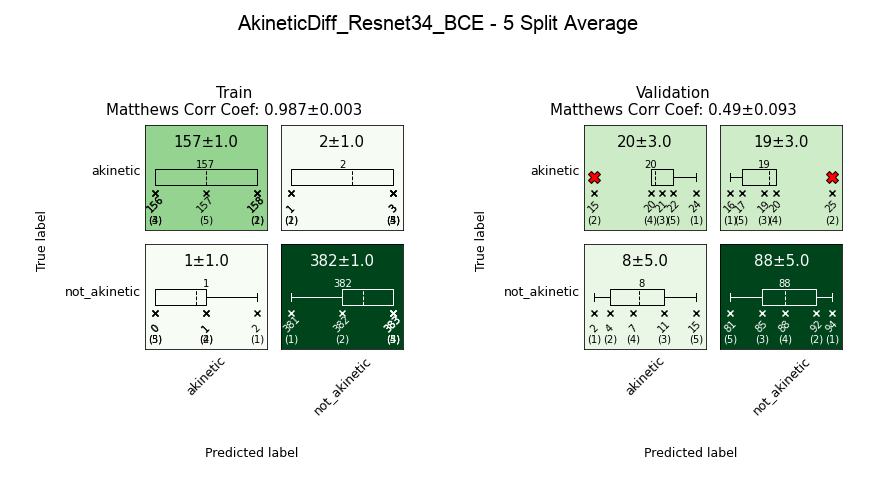



Average Performance:


,Valid_Loss_Avg,Valid_ROC_Avg,Valid_Acc_Avg,Train_Loss_Avg,Train_ROC_Avg,Train_Acc_Avg,train_akinetic_f1-score_Avg,valid_akinetic_f1-score_Avg,train_not_akinetic_f1-score_Avg,valid_not_akinetic_f1-score_Avg,train_MCC_Avg,valid_MCC_Avg
0,0.822 ± 0.152,0.845 ± 0.024,0.799 ± 0.036,0.01 ± 0.002,1.0 ± 0.0,0.994 ± 0.001,0.991 ± 0.002,0.599 ± 0.071,0.996 ± 0.001,0.866 ± 0.026,0.987 ± 0.003,0.49 ± 0.093





=== Full Dataset ===


Distribution for full dataset:


,,,train,validation
label,meaning,source,,
0,not_akinetic,Sacco,383,96
1,akinetic,Sacco,159,40


Trainer started with classifier: Resnet34
dataset: <datasets.ecoSaccoDataset.ecoSaccoDataset object at 0x7fd380066af0>
batch size: 32
Train set: 542
Validation set: 136
Training with 17 mini-batches per epoch
Logging performance every 4 iter, smoothing every: 17 iter, saving checkpoints every 85 iter
SGD (
Parameter Group 0
    dampening: 0
    initial_lr: 0.01
    lr: 0.01
    momentum: 0.9
    nesterov: False
    weight_decay: 0.0001
)'
<torch.optim.lr_scheduler.StepLR object at 0x7fd3800661f0>'
BCELoss()'
[Accuracy(), <function roc_auc_score at 0x7fd387862790>]'

* performance with model.train()
# performance with model.eval()
                    |         VALID        |        TRAIN         |         
 lr     iter  epoch | loss    roc    acc   | loss    roc    acc   |  time   
------------------------------------------------------------------------------
0.010000   17   1.0 | 0.624# 0.550  0.706  | 0.750* 0.535  0.507  |   6.66
                    |                      | 0.628# 0.

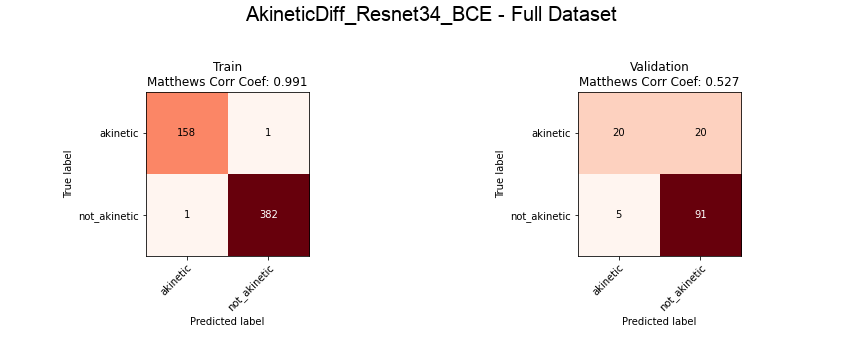

Train                         Validation                  \
             precision recall f1-score support  precision recall f1-score   
akinetic          0.99   0.99     0.99     159        0.8    0.5     0.62   
not_akinetic         1      1     1.00     383       0.82   0.95     0.88   
accuracy                          1.00     542                       0.82   
macro avg            1      1     1.00     542       0.81   0.72     0.75   
weighted avg         1      1     1.00     542       0.81   0.82     0.80   

                      
             support  
akinetic          40  
not_akinetic      96  
accuracy         136  
macro avg        136  
weighted avg     136

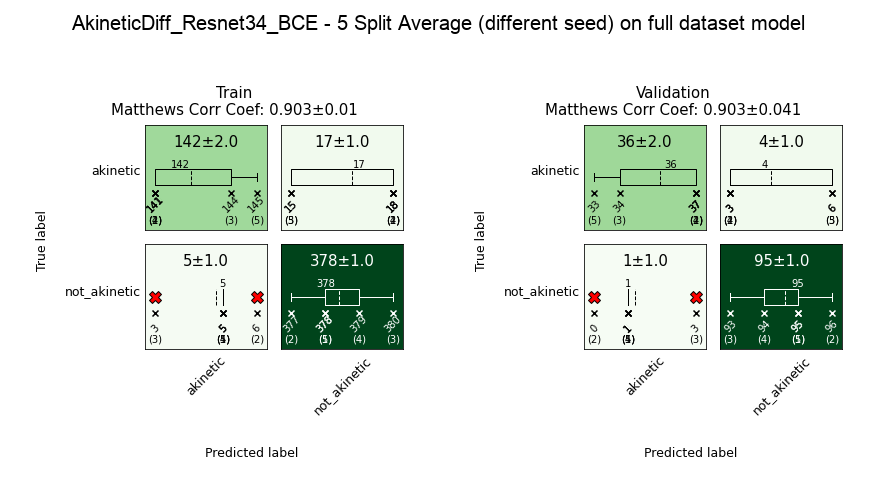


Performance summary:


,valid_loss,valid_roc,valid_acc,train_loss,train_roc,train_acc,train_akinetic_f1-score,valid_akinetic_f1-score,train_not_akinetic_f1-score,valid_not_akinetic_f1-score,train_mcc,valid_mcc
Set,,,,,,,,,,,,
Cross-Validation,0.822 ± 0.152,0.845 ± 0.024,0.799 ± 0.036,0.01 ± 0.002,1.0 ± 0.0,0.994 ± 0.001,0.991 ± 0.002,0.599 ± 0.071,0.996 ± 0.001,0.866 ± 0.026,0.987 ± 0.003,0.49 ± 0.093
Full,0.884,0.825,0.816,0.006,1.0,0.996,0.929 ± 0.008,0.929 ± 0.03,0.972 ± 0.003,0.972 ± 0.011,0.903 ± 0.01,0.903 ± 0.041


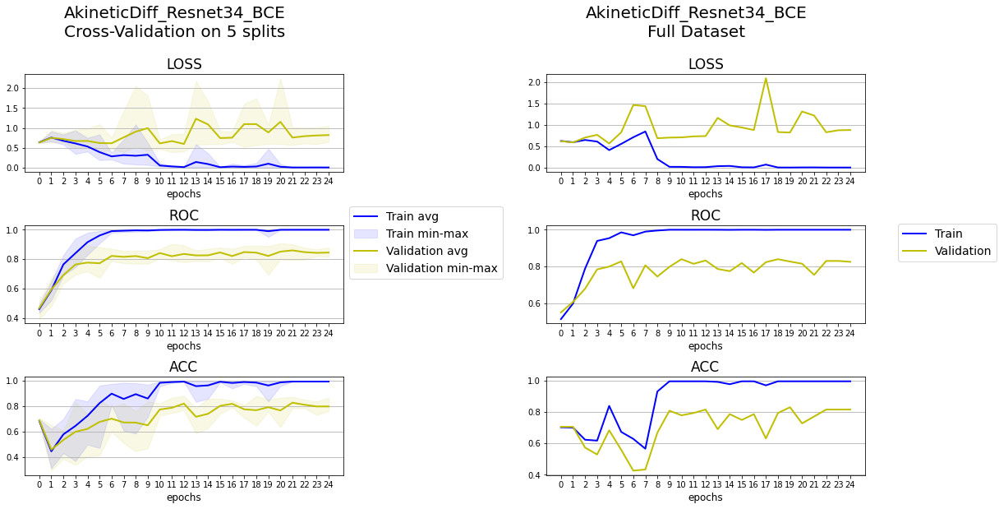

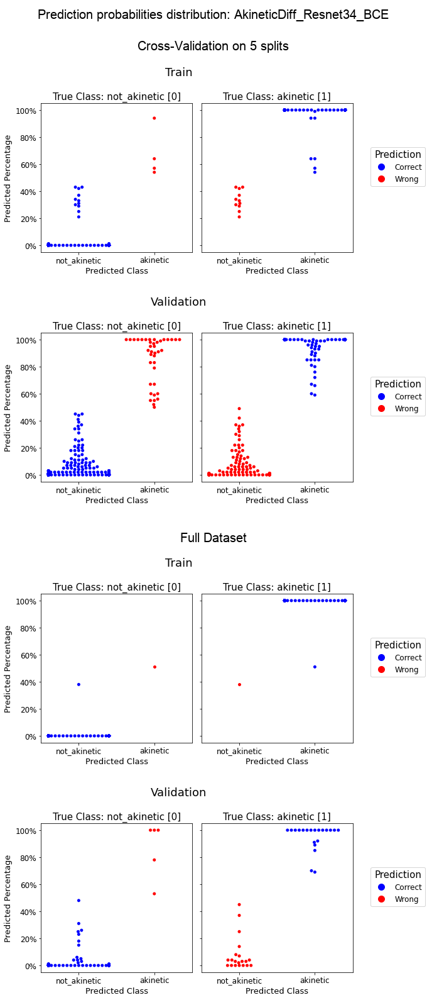



============================== BCE - InvertClass:yes ==============================


Executing a 5-fold cross validation

Train distribution for each split:


,,,train_1,train_2,train_3,train_4,train_5
label,meaning,source,,,,,
0,not_akinetic,Sacco,383,383,383,384,383
1,akinetic,Sacco,159,159,159,159,160



Validation distribution for each split:


,,,valid_1,valid_2,valid_3,valid_4,valid_5
label,meaning,source,,,,,
0,not_akinetic,Sacco,96,96,96,95,96
1,akinetic,Sacco,40,40,40,40,39



=== Split #1 ===

Trainer started with classifier: Resnet34
dataset: <datasets.ecoSaccoDataset.ecoSaccoDataset object at 0x7fd36c288070>
batch size: 32
Train set: 542
Validation set: 136
Training with 17 mini-batches per epoch
Logging performance every 4 iter, smoothing every: 17 iter, saving checkpoints every 85 iter

* performance with model.train()
# performance with model.eval()
                    |         VALID        |        TRAIN         |         
 lr     iter  epoch | loss    roc    acc   | loss    roc    acc   |  time   
------------------------------------------------------------------------------
0.010000   17   1.0 | 1.004# 0.658  0.301  | 0.761* 0.475  0.507  |   6.71
                    |                      | 1.051# 0.470  0.293  |   6.71
0.010000   34   2.0 | 1.005# 0.653  0.287  | 0.731* 0.549  0.537  |  13.34
                    |                      | 1.069# 0.573  0.314  |  13.34
0.009000   51   3.0 | 0.826# 0.728  0.390  | 0.654* 0.668  0.603  |  19.99
     

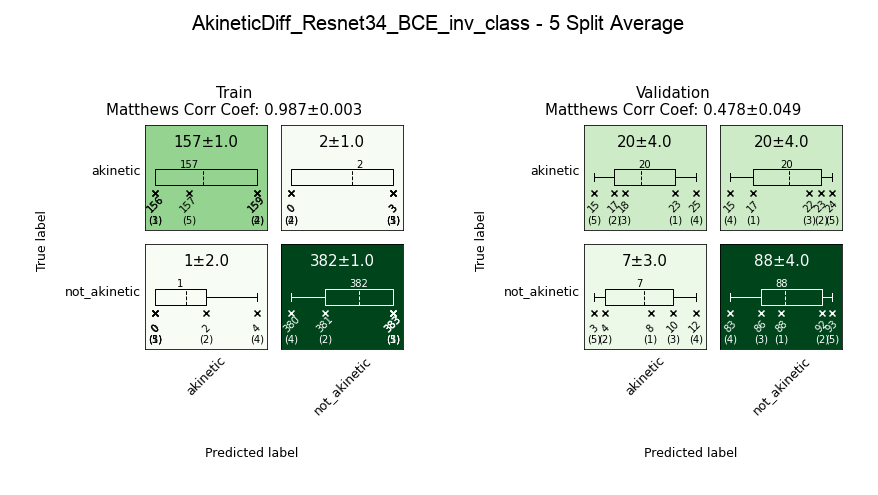



Average Performance:


,Valid_Loss_Avg,Valid_ROC_Avg,Valid_Acc_Avg,Train_Loss_Avg,Train_ROC_Avg,Train_Acc_Avg,train_akinetic_f1-score_Avg,valid_akinetic_f1-score_Avg,train_not_akinetic_f1-score_Avg,valid_not_akinetic_f1-score_Avg,train_MCC_Avg,valid_MCC_Avg
0,0.933 ± 0.127,0.837 ± 0.028,0.796 ± 0.017,0.01 ± 0.002,1.0 ± 0.0,0.994 ± 0.001,0.991 ± 0.002,0.582 ± 0.055,0.996 ± 0.001,0.865 ± 0.012,0.987 ± 0.003,0.478 ± 0.049





=== Full Dataset ===


Distribution for full dataset:


,,,train,validation
label,meaning,source,,
0,not_akinetic,Sacco,383,96
1,akinetic,Sacco,159,40


Trainer started with classifier: Resnet34
dataset: <datasets.ecoSaccoDataset.ecoSaccoDataset object at 0x7fd344d4cd90>
batch size: 32
Train set: 542
Validation set: 136
Training with 17 mini-batches per epoch
Logging performance every 4 iter, smoothing every: 17 iter, saving checkpoints every 85 iter
SGD (
Parameter Group 0
    dampening: 0
    initial_lr: 0.01
    lr: 0.01
    momentum: 0.9
    nesterov: False
    weight_decay: 0.0001
)'
<torch.optim.lr_scheduler.StepLR object at 0x7fd344e383d0>'
BCELoss()'
[Accuracy(), <function roc_auc_score at 0x7fd387862790>]'

* performance with model.train()
# performance with model.eval()
                    |         VALID        |        TRAIN         |         
 lr     iter  epoch | loss    roc    acc   | loss    roc    acc   |  time   
------------------------------------------------------------------------------
0.010000   17   1.0 | 1.151# 0.558  0.294  | 0.761* 0.505  0.513  |   6.53
                    |                      | 1.132# 0.

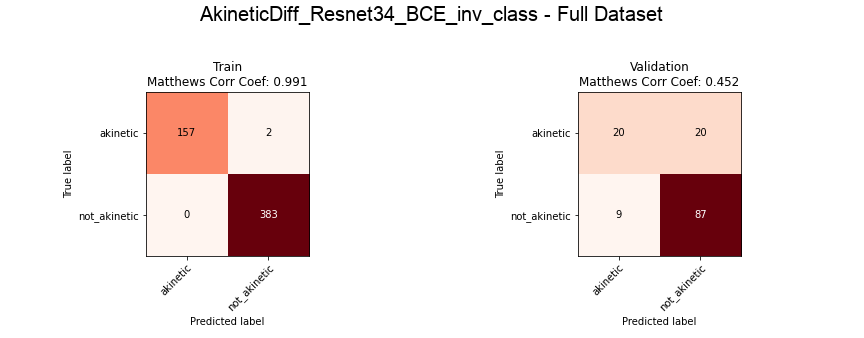

Train                         Validation                  \
             precision recall f1-score support  precision recall f1-score   
akinetic             1   0.99     0.99     159       0.69    0.5     0.58   
not_akinetic      0.99      1     1.00     383       0.81   0.91     0.86   
accuracy                          1.00     542                       0.79   
macro avg            1   0.99     1.00     542       0.75    0.7     0.72   
weighted avg         1      1     1.00     542       0.78   0.79     0.78   

                      
             support  
akinetic          40  
not_akinetic      96  
accuracy         136  
macro avg        136  
weighted avg     136

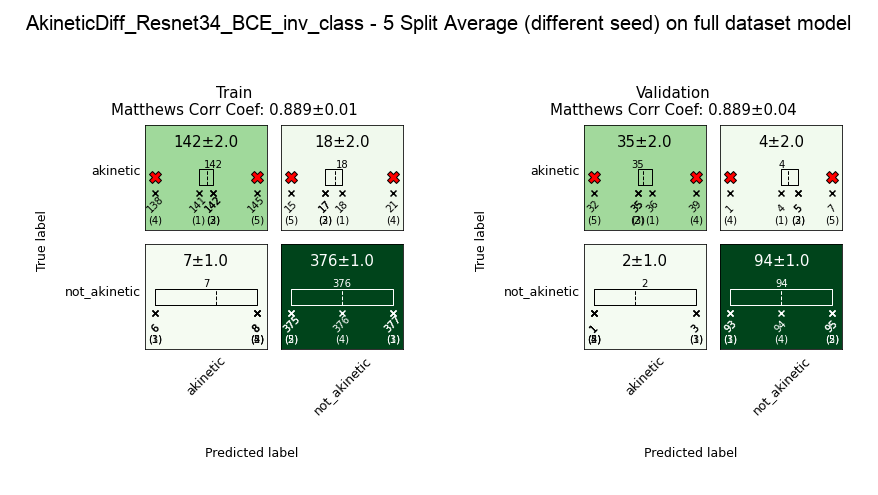


Performance summary:


,valid_loss,valid_roc,valid_acc,train_loss,train_roc,train_acc,train_akinetic_f1-score,valid_akinetic_f1-score,train_not_akinetic_f1-score,valid_not_akinetic_f1-score,train_mcc,valid_mcc
Set,,,,,,,,,,,,
Cross-Validation,0.933 ± 0.127,0.837 ± 0.028,0.796 ± 0.017,0.01 ± 0.002,1.0 ± 0.0,0.994 ± 0.001,0.991 ± 0.002,0.582 ± 0.055,0.996 ± 0.001,0.865 ± 0.012,0.987 ± 0.003,0.478 ± 0.049
Full,1.081,0.803,0.787,0.007,1.0,0.996,0.919 ± 0.008,0.919 ± 0.03,0.968 ± 0.003,0.968 ± 0.011,0.889 ± 0.01,0.889 ± 0.04


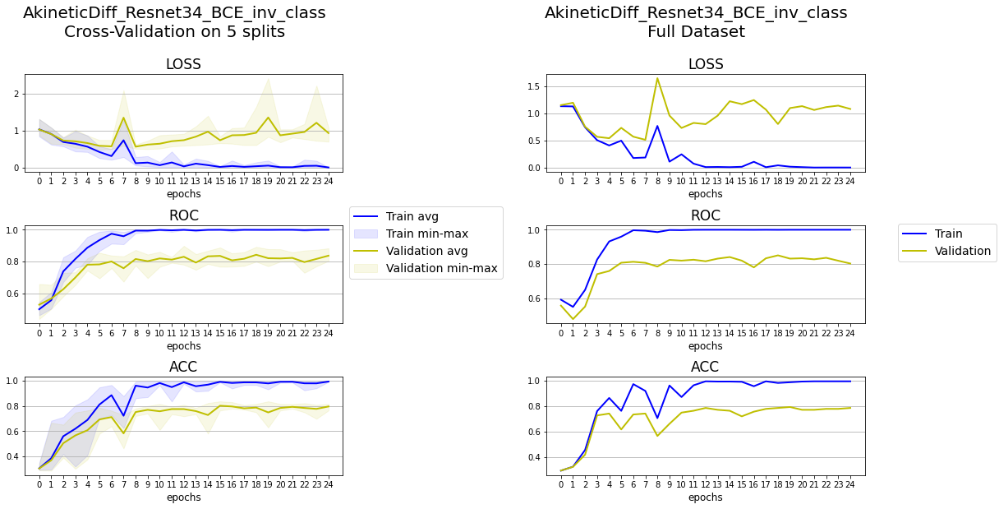

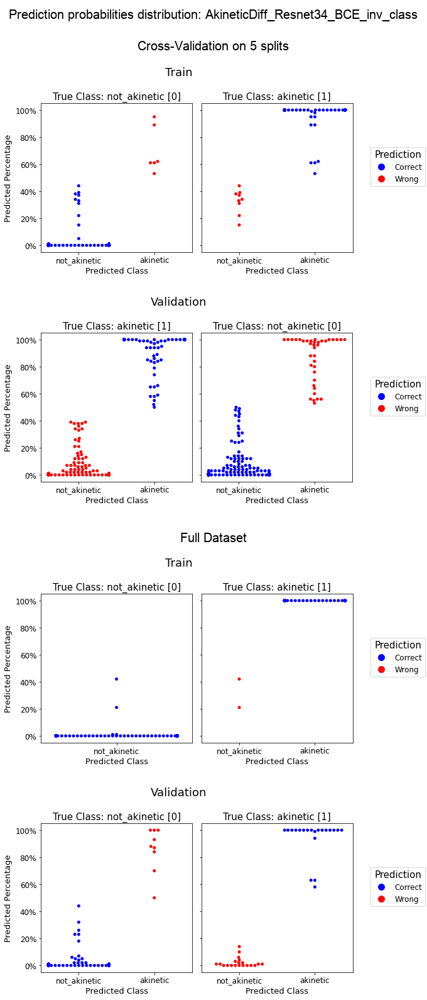



============================== FocLos - InvertClass:no ==============================


Executing a 5-fold cross validation

Train distribution for each split:


,,,train_1,train_2,train_3,train_4,train_5
label,meaning,source,,,,,
0,not_akinetic,Sacco,383,383,383,384,383
1,akinetic,Sacco,159,159,159,159,160



Validation distribution for each split:


,,,valid_1,valid_2,valid_3,valid_4,valid_5
label,meaning,source,,,,,
0,not_akinetic,Sacco,96,96,96,95,96
1,akinetic,Sacco,40,40,40,40,39



=== Split #1 ===

Trainer started with classifier: Resnet34
dataset: <datasets.ecoSaccoDataset.ecoSaccoDataset object at 0x7fd344c18070>
batch size: 32
Train set: 542
Validation set: 136
Training with 17 mini-batches per epoch
Logging performance every 4 iter, smoothing every: 17 iter, saving checkpoints every 85 iter

* performance with model.train()
# performance with model.eval()
                    |         VALID        |        TRAIN         |         
 lr     iter  epoch | loss    roc    acc   | loss    roc    acc   |  time   
------------------------------------------------------------------------------
0.010000   17   1.0 | 0.361# 0.634  0.706  | 0.275* 0.503  0.482  |   6.66
                    |                      | 0.377# 0.602  0.708  |   6.66
0.010000   34   2.0 | 0.159# 0.591  0.662  | 0.231* 0.618  0.548  |  13.39
                    |                      | 0.162# 0.592  0.699  |  13.39
0.009000   51   3.0 | 0.167# 0.601  0.610  | 0.211* 0.647  0.576  |  20.14
     

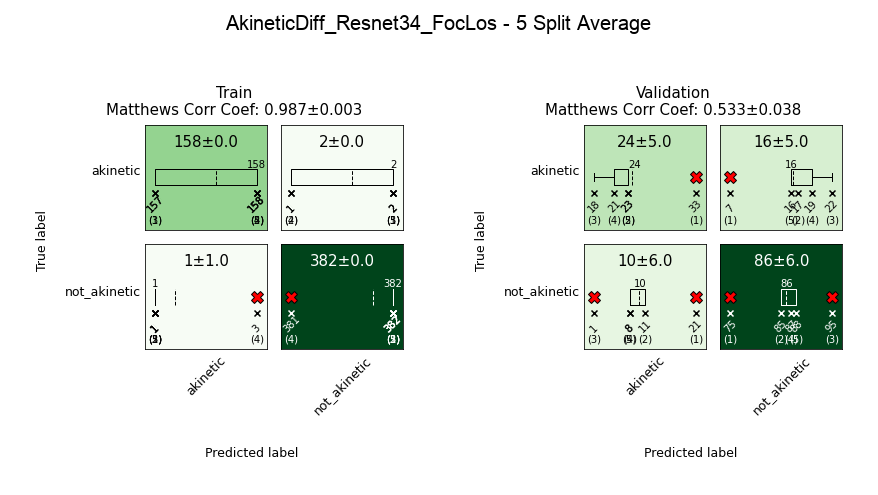



Average Performance:


,Valid_Loss_Avg,Valid_ROC_Avg,Valid_Acc_Avg,Train_Loss_Avg,Train_ROC_Avg,Train_Acc_Avg,train_akinetic_f1-score_Avg,valid_akinetic_f1-score_Avg,train_not_akinetic_f1-score_Avg,valid_not_akinetic_f1-score_Avg,train_MCC_Avg,valid_MCC_Avg
0,0.283 ± 0.03,0.838 ± 0.028,0.808 ± 0.015,0.002 ± 0.0,1.0 ± 0.0,0.994 ± 0.001,0.991 ± 0.002,0.64 ± 0.036,0.996 ± 0.001,0.868 ± 0.017,0.987 ± 0.003,0.533 ± 0.038





=== Full Dataset ===


Distribution for full dataset:


,,,train,validation
label,meaning,source,,
0,not_akinetic,Sacco,383,96
1,akinetic,Sacco,159,40


Trainer started with classifier: Resnet34
dataset: <datasets.ecoSaccoDataset.ecoSaccoDataset object at 0x7fd323b15e80>
batch size: 32
Train set: 542
Validation set: 136
Training with 17 mini-batches per epoch
Logging performance every 4 iter, smoothing every: 17 iter, saving checkpoints every 85 iter
SGD (
Parameter Group 0
    dampening: 0
    initial_lr: 0.01
    lr: 0.01
    momentum: 0.9
    nesterov: False
    weight_decay: 0.0001
)'
<torch.optim.lr_scheduler.StepLR object at 0x7fd323b15f10>'
FocalLoss()'
[Accuracy(), <function roc_auc_score at 0x7fd387862790>]'

* performance with model.train()
# performance with model.eval()
                    |         VALID        |        TRAIN         |         
 lr     iter  epoch | loss    roc    acc   | loss    roc    acc   |  time   
------------------------------------------------------------------------------
0.010000   17   1.0 | 0.172# 0.495  0.691  | 0.263* 0.573  0.550  |   6.66
                    |                      | 0.188# 

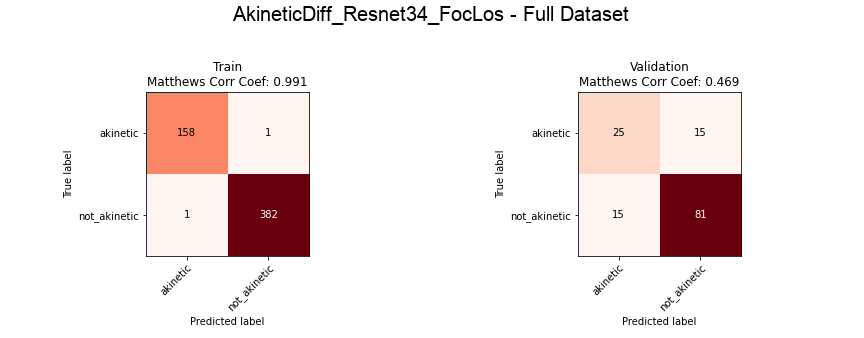

Train                         Validation                  \
             precision recall f1-score support  precision recall f1-score   
akinetic          0.99   0.99     0.99     159       0.62   0.62     0.62   
not_akinetic         1      1     1.00     383       0.84   0.84     0.84   
accuracy                          1.00     542                       0.78   
macro avg            1      1     1.00     542       0.73   0.73     0.73   
weighted avg         1      1     1.00     542       0.78   0.78     0.78   

                      
             support  
akinetic          40  
not_akinetic      96  
accuracy         136  
macro avg        136  
weighted avg     136

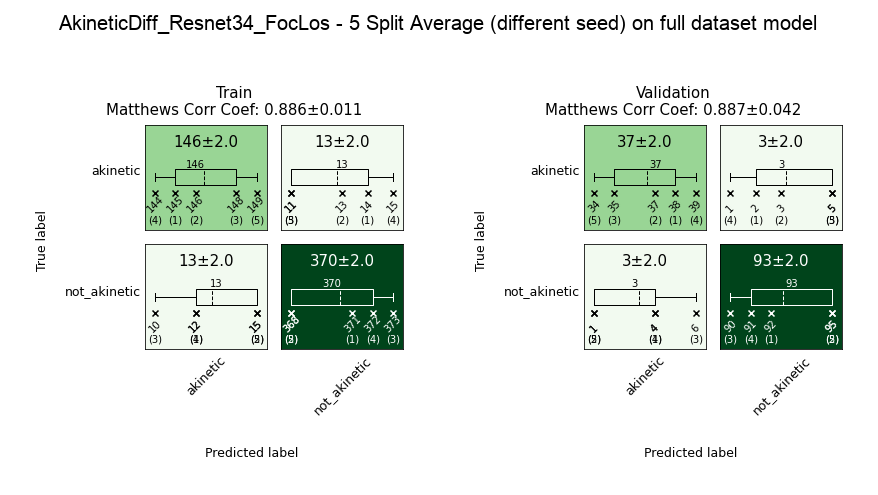


Performance summary:


,valid_loss,valid_roc,valid_acc,train_loss,train_roc,train_acc,train_akinetic_f1-score,valid_akinetic_f1-score,train_not_akinetic_f1-score,valid_not_akinetic_f1-score,train_mcc,valid_mcc
Set,,,,,,,,,,,,
Cross-Validation,0.283 ± 0.03,0.838 ± 0.028,0.808 ± 0.015,0.002 ± 0.0,1.0 ± 0.0,0.994 ± 0.001,0.991 ± 0.002,0.64 ± 0.036,0.996 ± 0.001,0.868 ± 0.017,0.987 ± 0.003,0.533 ± 0.038
Full,0.337,0.809,0.779,0.001,1.0,0.996,0.92 ± 0.008,0.92 ± 0.03,0.967 ± 0.003,0.967 ± 0.013,0.886 ± 0.011,0.887 ± 0.042


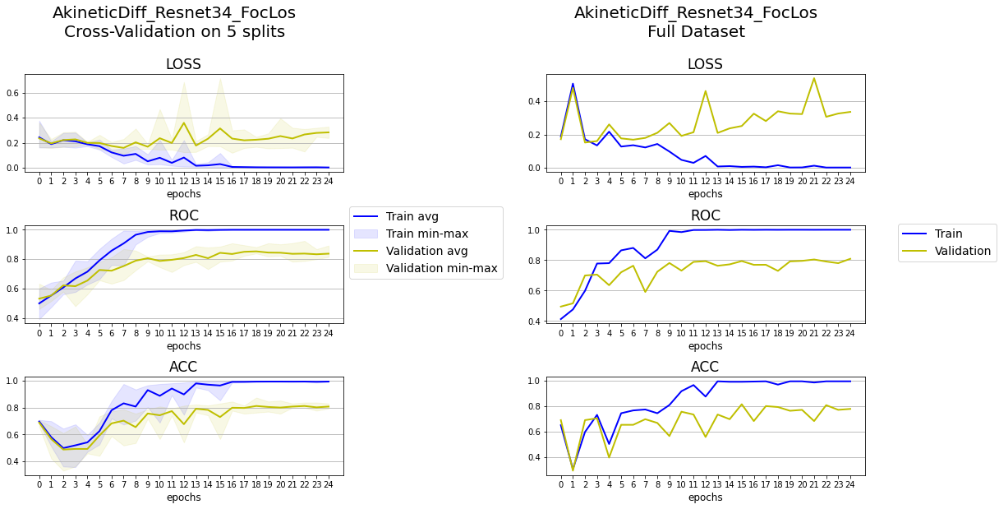

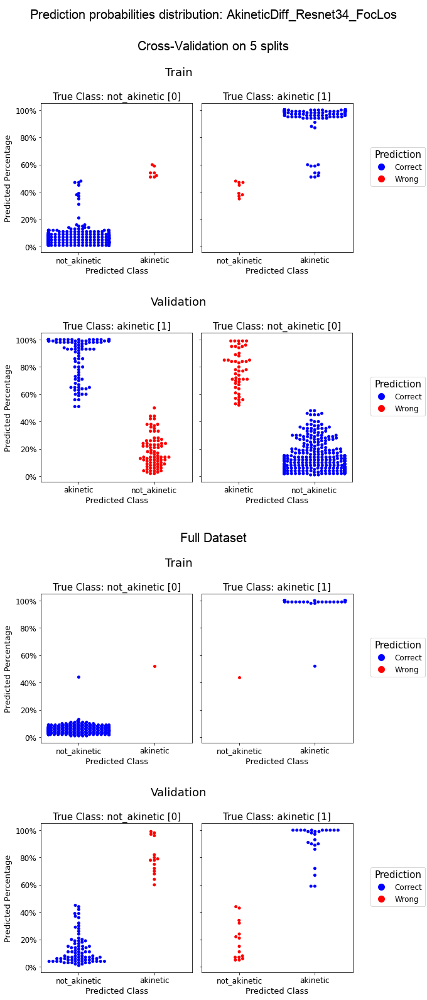



============================== FocLos - InvertClass:yes ==============================


Executing a 5-fold cross validation

Train distribution for each split:


,,,train_1,train_2,train_3,train_4,train_5
label,meaning,source,,,,,
0,not_akinetic,Sacco,383,383,383,384,383
1,akinetic,Sacco,159,159,159,159,160



Validation distribution for each split:


,,,valid_1,valid_2,valid_3,valid_4,valid_5
label,meaning,source,,,,,
0,not_akinetic,Sacco,96,96,96,95,96
1,akinetic,Sacco,40,40,40,40,39



=== Split #1 ===

Trainer started with classifier: Resnet34
dataset: <datasets.ecoSaccoDataset.ecoSaccoDataset object at 0x7fd35c093d30>
batch size: 32
Train set: 542
Validation set: 136
Training with 17 mini-batches per epoch
Logging performance every 4 iter, smoothing every: 17 iter, saving checkpoints every 85 iter

* performance with model.train()
# performance with model.eval()
                    |         VALID        |        TRAIN         |         
 lr     iter  epoch | loss    roc    acc   | loss    roc    acc   |  time   
------------------------------------------------------------------------------
0.010000   17   1.0 | 0.338# 0.494  0.309  | 0.272* 0.488  0.476  |   6.65
                    |                      | 0.350# 0.506  0.327  |   6.65
0.010000   34   2.0 | 0.230# 0.526  0.500  | 0.236* 0.613  0.579  |  13.39
                    |                      | 0.220# 0.555  0.531  |  13.39
0.009000   51   3.0 | 0.184# 0.659  0.574  | 0.175* 0.715  0.655  |  20.10
     

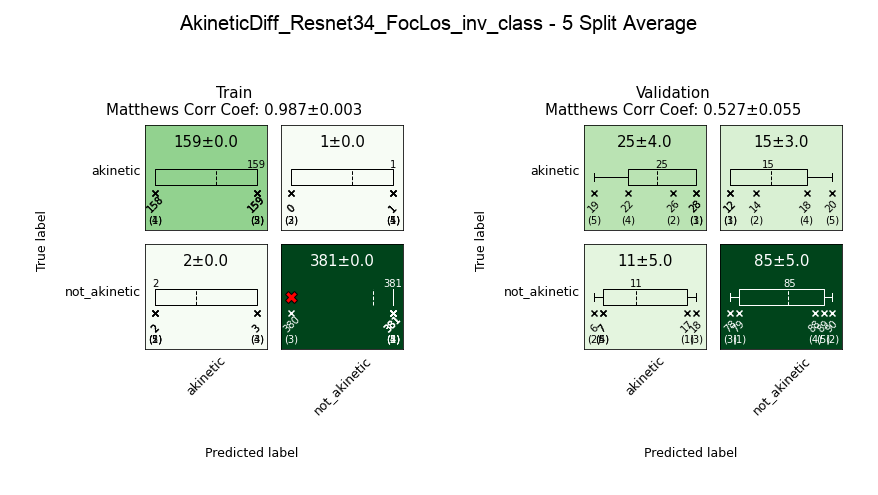



Average Performance:


,Valid_Loss_Avg,Valid_ROC_Avg,Valid_Acc_Avg,Train_Loss_Avg,Train_ROC_Avg,Train_Acc_Avg,train_akinetic_f1-score_Avg,valid_akinetic_f1-score_Avg,train_not_akinetic_f1-score_Avg,valid_not_akinetic_f1-score_Avg,train_MCC_Avg,valid_MCC_Avg
0,0.246 ± 0.058,0.86 ± 0.013,0.807 ± 0.026,0.003 ± 0.001,1.0 ± 0.0,0.994 ± 0.001,0.991 ± 0.002,0.651 ± 0.044,0.996 ± 0.001,0.866 ± 0.022,0.987 ± 0.003,0.527 ± 0.055





=== Full Dataset ===


Distribution for full dataset:


,,,train,validation
label,meaning,source,,
0,not_akinetic,Sacco,383,96
1,akinetic,Sacco,159,40


Trainer started with classifier: Resnet34
dataset: <datasets.ecoSaccoDataset.ecoSaccoDataset object at 0x7fd32340e9d0>
batch size: 32
Train set: 542
Validation set: 136
Training with 17 mini-batches per epoch
Logging performance every 4 iter, smoothing every: 17 iter, saving checkpoints every 85 iter
SGD (
Parameter Group 0
    dampening: 0
    initial_lr: 0.01
    lr: 0.01
    momentum: 0.9
    nesterov: False
    weight_decay: 0.0001
)'
<torch.optim.lr_scheduler.StepLR object at 0x7fd32335e970>'
FocalLoss()'
[Accuracy(), <function roc_auc_score at 0x7fd387862790>]'

* performance with model.train()
# performance with model.eval()
                    |         VALID        |        TRAIN         |         
 lr     iter  epoch | loss    roc    acc   | loss    roc    acc   |  time   
------------------------------------------------------------------------------
0.010000   17   1.0 | 0.588# 0.476  0.294  | 0.273* 0.486  0.522  |   6.69
                    |                      | 0.570# 

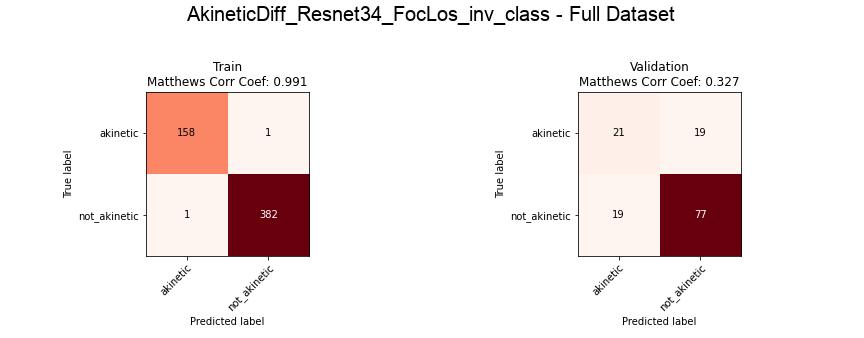

Train                         Validation                  \
             precision recall f1-score support  precision recall f1-score   
akinetic          0.99   0.99     0.99     159       0.52   0.52     0.52   
not_akinetic         1      1     1.00     383        0.8    0.8     0.80   
accuracy                          1.00     542                       0.72   
macro avg            1      1     1.00     542       0.66   0.66     0.66   
weighted avg         1      1     1.00     542       0.72   0.72     0.72   

                      
             support  
akinetic          40  
not_akinetic      96  
accuracy         136  
macro avg        136  
weighted avg     136

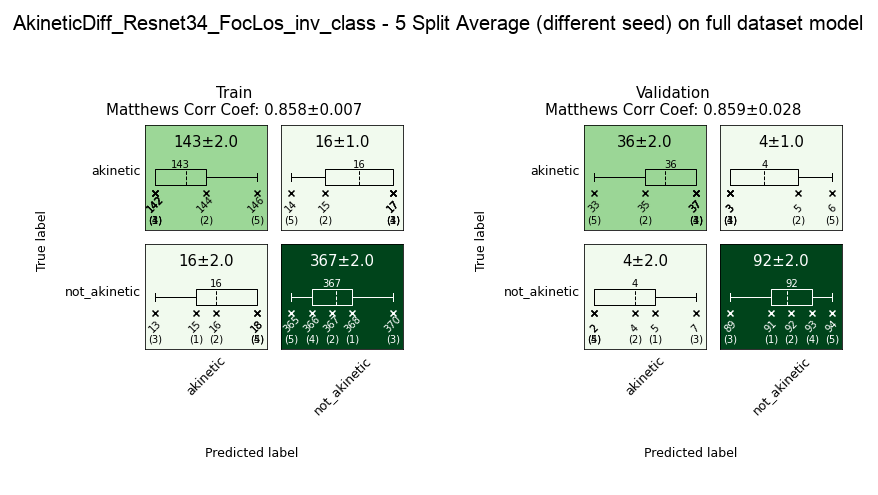


Performance summary:


,valid_loss,valid_roc,valid_acc,train_loss,train_roc,train_acc,train_akinetic_f1-score,valid_akinetic_f1-score,train_not_akinetic_f1-score,valid_not_akinetic_f1-score,train_mcc,valid_mcc
Set,,,,,,,,,,,,
Cross-Validation,0.246 ± 0.058,0.86 ± 0.013,0.807 ± 0.026,0.003 ± 0.001,1.0 ± 0.0,0.994 ± 0.001,0.991 ± 0.002,0.651 ± 0.044,0.996 ± 0.001,0.866 ± 0.022,0.987 ± 0.003,0.527 ± 0.055
Full,0.291,0.82,0.721,0.001,1.0,0.996,0.9 ± 0.005,0.9 ± 0.02,0.958 ± 0.002,0.958 ± 0.009,0.858 ± 0.007,0.859 ± 0.028


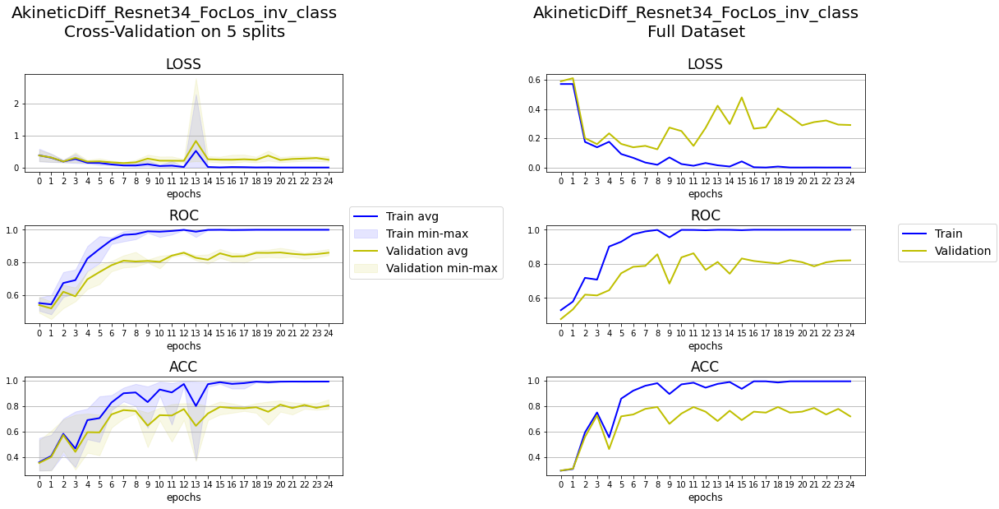

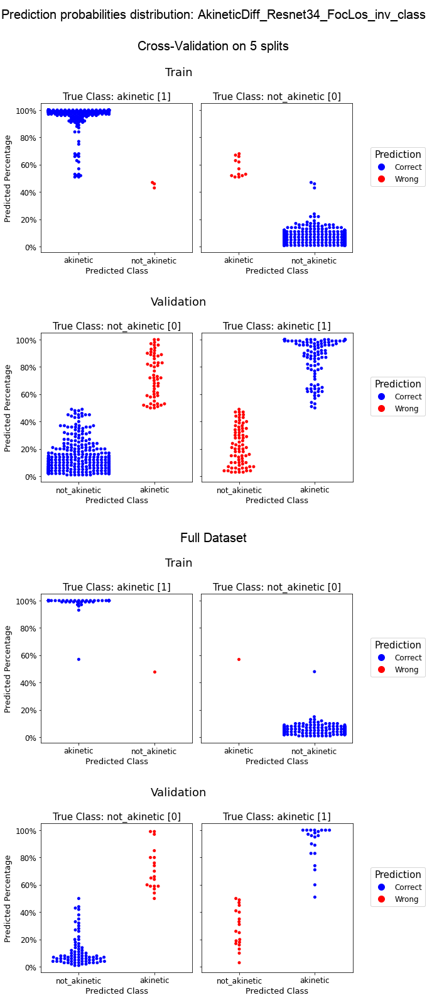




Final Log:


,session_ID,valid_loss,valid_roc,valid_acc,train_loss,train_roc,train_acc,train_akinetic_f1-score,valid_akinetic_f1-score,train_not_akinetic_f1-score,valid_not_akinetic_f1-score,train_mcc,valid_mcc,loss,inverted_class,model_ID
Cross-Validation,AkineticDiff_Resnet34_BCE,0.822 ± 0.152,0.845 ± 0.024,0.799 ± 0.036,0.01 ± 0.002,1.0 ± 0.0,0.994 ± 0.001,0.991 ± 0.002,0.599 ± 0.071,0.996 ± 0.001,0.866 ± 0.026,0.987 ± 0.003,0.49 ± 0.093,BCE,no,Resnet34
Full,AkineticDiff_Resnet34_BCE,0.884,0.825,0.816,0.006,1.0,0.996,0.929 ± 0.008,0.929 ± 0.03,0.972 ± 0.003,0.972 ± 0.011,0.903 ± 0.01,0.903 ± 0.041,BCE,no,Resnet34
Cross-Validation,AkineticDiff_Resnet34_BCE_inv_class,0.933 ± 0.127,0.837 ± 0.028,0.796 ± 0.017,0.01 ± 0.002,1.0 ± 0.0,0.994 ± 0.001,0.991 ± 0.002,0.582 ± 0.055,0.996 ± 0.001,0.865 ± 0.012,0.987 ± 0.003,0.478 ± 0.049,BCE,yes,Resnet34
Full,AkineticDiff_Resnet34_BCE_inv_class,1.081,0.803,0.787,0.007,1.0,0.996,0.919 ± 0.008,0.919 ± 0.03,0.968 ± 0.003,0.968 ± 0.011,0.889 ± 0.01,0.889 ± 0.04,BCE,yes,Resnet34
Cross-Validation,AkineticDiff_Resnet34_FocLos,0.283 ± 0.03,0.838 ± 0.028,0.808 ± 0.015,0.002 ± 0.0,1.0 ± 0.0,0.994 ± 0.001,0.991 ± 0.002,0.64 ± 0.036,0.996 ± 0.001,0.868 ± 0.017,0.987 ± 0.003,0.533 ± 0.038,FocLos,no,Resnet34
Full,AkineticDiff_Resnet34_FocLos,0.337,0.809,0.779,0.001,1.0,0.996,0.92 ± 0.008,0.92 ± 0.03,0.967 ± 0.003,0.967 ± 0.013,0.886 ± 0.011,0.887 ± 0.042,FocLos,no,Resnet34
Cross-Validation,AkineticDiff_Resnet34_FocLos_inv_class,0.246 ± 0.058,0.86 ± 0.013,0.807 ± 0.026,0.003 ± 0.001,1.0 ± 0.0,0.994 ± 0.001,0.991 ± 0.002,0.651 ± 0.044,0.996 ± 0.001,0.866 ± 0.022,0.987 ± 0.003,0.527 ± 0.055,FocLos,yes,Resnet34
Full,AkineticDiff_Resnet34_FocLos_inv_class,0.291,0.82,0.721,0.001,1.0,0.996,0.9 ± 0.005,0.9 ± 0.02,0.958 ± 0.002,0.958 ± 0.009,0.858 ± 0.007,0.859 ± 0.028,FocLos,yes,Resnet34



Total elapsed time: 1:15:54


In [5]:
# cross-validate and train model on full set - hyperparameter tuning for loss_set and invert_class_set

trainer_ID = 'AkineticDiff'
base_classifier_ID = Resnet34(num_channels=dataset.total_frames)
dataset = dataset
batch_size = 32

cvu.tune_with_CV(trainer_ID = trainer_ID,
                 dataset = dataset,
                 base_classifier_ID = base_classifier_ID,
                 batch_size = batch_size,
                 n_splits = 5,
                 max_epochs_split = 25,
                 max_epochs_full = 25,
                 stratify_lab = dataset.labels,
                 loss_set = ['BCE', 'FocLos'],
                 invert_class_set = True,
                 measure_to_plot = ['loss', 'roc', 'acc'],
                 metrics = [Accuracy(), roc_auc_score],
                 show_info=False, show_log=2, show_perf_plot=True,
                 save_split_checkpoint=False, save_split_final=True,
                 save_full_checkpoint=False, save_full_final=True,
                 reload_split=False, reload_full=False)

# reload final performance log
final_log=pd.read_csv(os.path.join('results', trainer_ID, trainer_ID+'_final_performance.csv'), sep=';', index_col=0)

Evaluating heatmap:

 -- Gradient aggregation: mean
 -- Soft activation is applied to <class 'torch.nn.modules.activation.ReLU'> , replaced with LeakyReLU(negative_slope=0.01, inplace=True)

Processing 7/7 batch - Total elapsed time: 0:00:52
Done




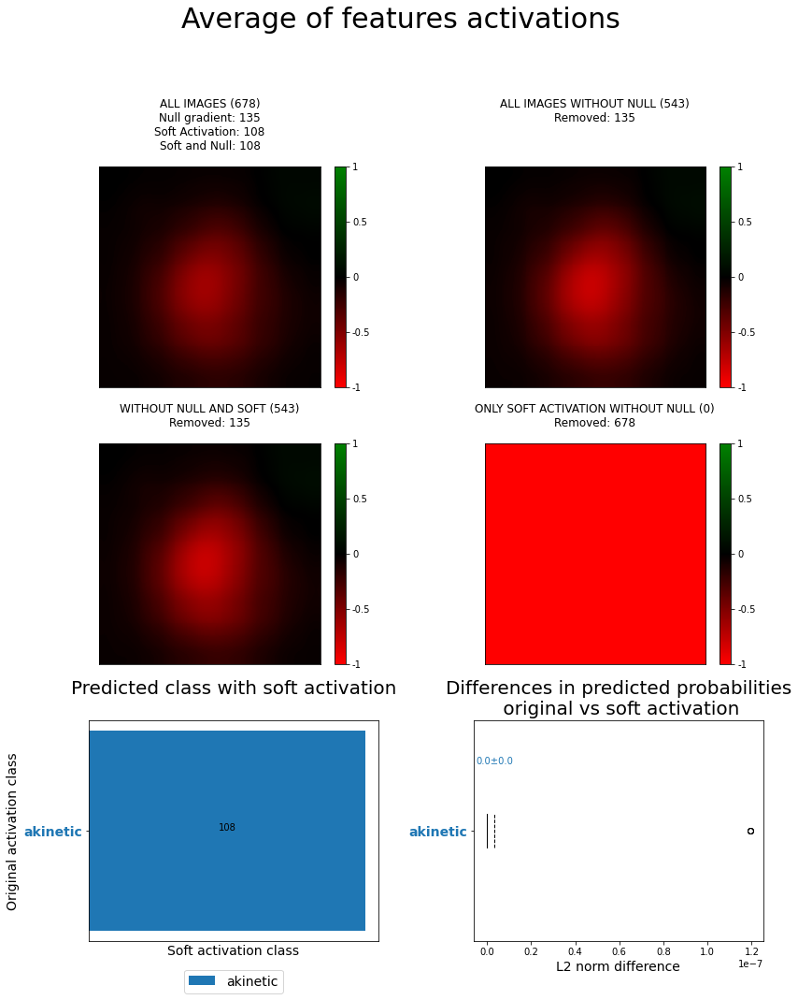

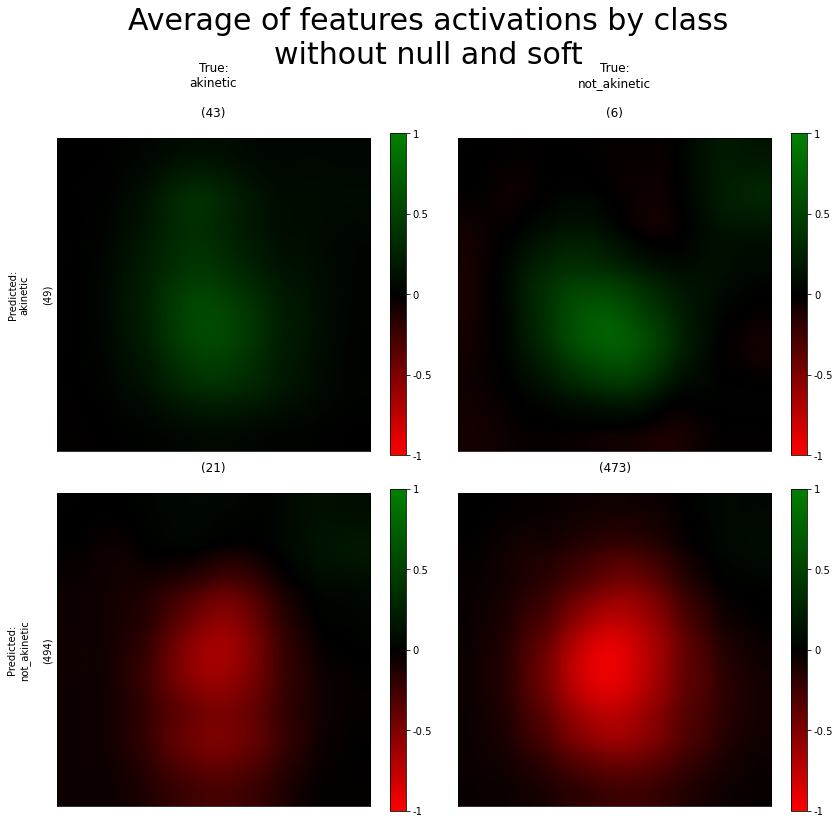

Data used for bar and box plot


,meaning,count,avg_L2_norm_diff,L2diff_list,akinetic,not_akinetic
0,akinetic,108,3.311369e-09,"[[0.0], [0.0], [1.1920929e-07], [0.0], [0.0], ...",108.0,0.0


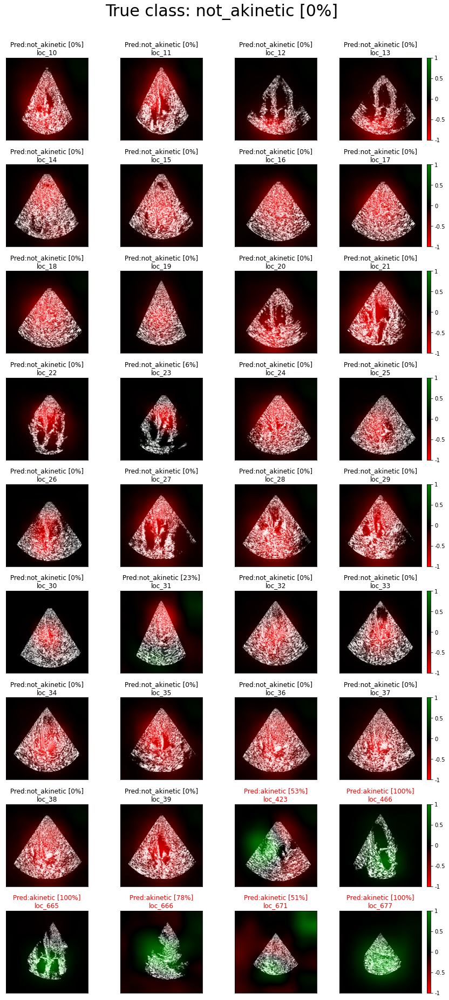

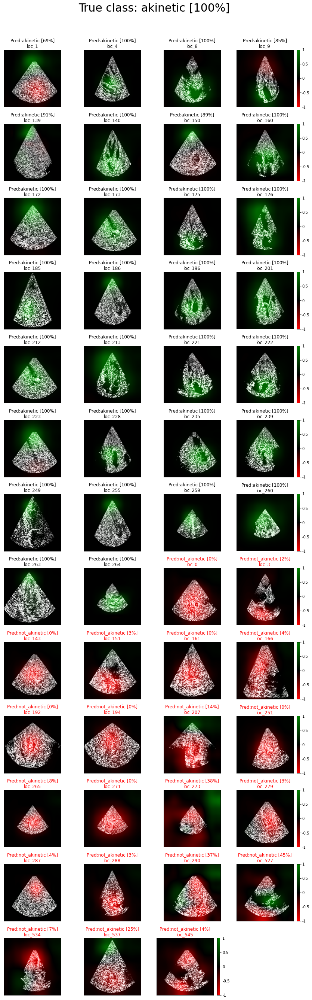

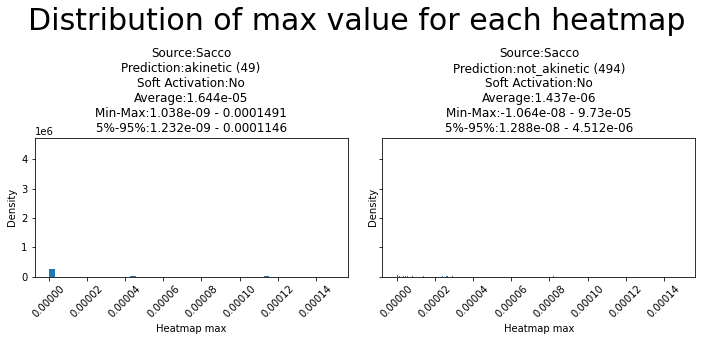

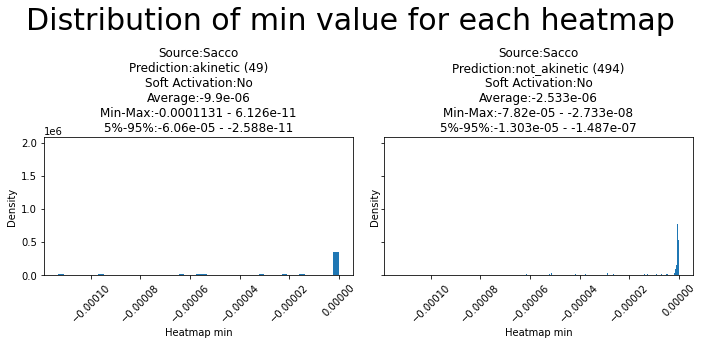

In [5]:
# evaluate features visualization

new_index = np.array(dataset.df.index)
model = Resnet34FeatVis(num_channels=dataset.total_frames)
reload_model_ID = 'AkineticDiff_Resnet34_BCE_full'
model_ID = 'AkineticDiff_Resnet34_BCE'
save_path = 'AkineticDiff'

fvu = FeaturesVisualizationUtils(save_path=save_path,
                                 model_ID=model_ID,
                                 image_size = size)
fvu.run_features_visualization(dataset=dataset,
                               new_index=new_index,
                               model=model,
                               reload_model_ID=reload_model_ID,
                               gradient_aggregation='mean',
                               apply_soft_activation=True,
                               nn_to_replace=nn.ReLU,
                               nn_replacement=nn.LeakyReLU(inplace=True),
                               frame_to_show=0,
                               heatmap_transformation='exponential')
fvu.plot_heatmap(fig_size = 12)
fvu.plot_sample_masked(fig_size = 12, max_sample_combination = 30, sample_ncol = 4)
fvu.plot_heatmap_max_distribution()

In [ ]:
fvu.fin

## Train model Covid Yes/No

In [7]:
input_name = 'eco_50_first_diff_samplFirst_mask_256'
size = 256

dataset = ecoSaccoDataset(input_name, target_class='covid', size=size, show_info=True)

ecoSaccoDataset initialized with size=256, augment=None
Dataset is located in ./input/eco_50_first_diff_samplFirst_mask_256

############    eco_50_first_diff_samplFirst_mask_256 dataset    ############

Total files: 678
Total frames: 49


/home/alessandro/.conda/envs/defeatcovid19/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,image,label,meaning,source
0,./input/eco_50_first_diff_samplFirst_mask_256/...,0,not_covid,Sacco
1,./input/eco_50_first_diff_samplFirst_mask_256/...,0,not_covid,Sacco
2,./input/eco_50_first_diff_samplFirst_mask_256/...,0,not_covid,Sacco
3,./input/eco_50_first_diff_samplFirst_mask_256/...,0,not_covid,Sacco
4,./input/eco_50_first_diff_samplFirst_mask_256/...,0,not_covid,Sacco
...,...,...,...,...
673,./input/eco_50_first_diff_samplFirst_mask_256/...,1,covid,Sacco
674,./input/eco_50_first_diff_samplFirst_mask_256/...,1,covid,Sacco
675,./input/eco_50_first_diff_samplFirst_mask_256/...,1,covid,Sacco
676,./input/eco_50_first_diff_samplFirst_mask_256/...,1,covid,Sacco


,,,count
label,meaning,source,
0,not_covid,Sacco,528
1,covid,Sacco,150


/home/alessandro/.conda/envs/defeatcovid19/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)



Used raw classifier: Resnet34

Start hyperparameter tuning


============================== BCE - InvertClass:no ==============================


Executing a 5-fold cross validation

Train distribution for each split:


,,,train_1,train_2,train_3,train_4,train_5
label,meaning,source,,,,,
0,not_covid,Sacco,422,422,422,423,423
1,covid,Sacco,120,120,120,120,120



Validation distribution for each split:


,,,valid_1,valid_2,valid_3,valid_4,valid_5
label,meaning,source,,,,,
0,not_covid,Sacco,106,106,106,105,105
1,covid,Sacco,30,30,30,30,30



=== Split #1 ===

Trainer started with classifier: Resnet34
dataset: <datasets.ecoSaccoDataset.ecoSaccoDataset object at 0x7fd387603610>
batch size: 32
Train set: 542
Validation set: 136
Training with 17 mini-batches per epoch
Logging performance every 4 iter, smoothing every: 17 iter, saving checkpoints every 85 iter

* performance with model.train()
# performance with model.eval()
                    |         VALID        |        TRAIN         |         
 lr     iter  epoch | loss    roc    acc   | loss    roc    acc   |  time   
------------------------------------------------------------------------------
0.010000   17   1.0 | 0.766# 0.780  0.390  | 0.694* 0.594  0.579  |   6.75
                    |                      | 0.786# 0.635  0.362  |   6.75
0.010000   34   2.0 | 0.886# 0.810  0.294  | 0.528* 0.845  0.742  |  13.53
                    |                      | 0.869# 0.755  0.308  |  13.53
0.009000   51   3.0 | 0.631# 0.879  0.574  | 0.402* 0.936  0.854  |  20.24
     

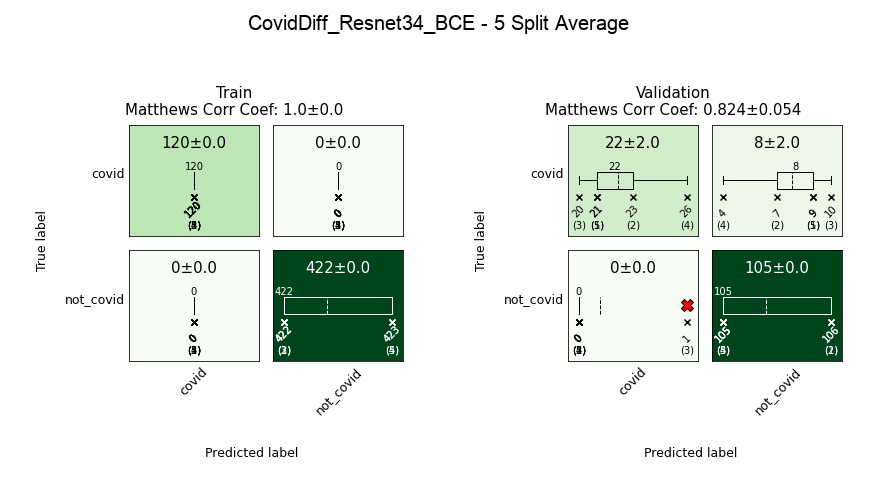



Average Performance:


,Valid_Loss_Avg,Valid_ROC_Avg,Valid_Acc_Avg,Train_Loss_Avg,Train_ROC_Avg,Train_Acc_Avg,train_covid_f1-score_Avg,valid_covid_f1-score_Avg,train_not_covid_f1-score_Avg,valid_not_covid_f1-score_Avg,train_MCC_Avg,valid_MCC_Avg
0,0.308 ± 0.119,0.962 ± 0.029,0.941 ± 0.017,0.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,0.846 ± 0.049,1.0 ± 0.0,0.964 ± 0.011,1.0 ± 0.0,0.824 ± 0.054





=== Full Dataset ===


Distribution for full dataset:


,,,train,validation
label,meaning,source,,
0,not_covid,Sacco,422,106
1,covid,Sacco,120,30


Trainer started with classifier: Resnet34
dataset: <datasets.ecoSaccoDataset.ecoSaccoDataset object at 0x7fd323a477f0>
batch size: 32
Train set: 542
Validation set: 136
Training with 17 mini-batches per epoch
Logging performance every 4 iter, smoothing every: 17 iter, saving checkpoints every 85 iter
SGD (
Parameter Group 0
    dampening: 0
    initial_lr: 0.01
    lr: 0.01
    momentum: 0.9
    nesterov: False
    weight_decay: 0.0001
)'
<torch.optim.lr_scheduler.StepLR object at 0x7fd323a37790>'
BCELoss()'
[Accuracy(), <function roc_auc_score at 0x7fd387862790>]'

* performance with model.train()
# performance with model.eval()
                    |         VALID        |        TRAIN         |         
 lr     iter  epoch | loss    roc    acc   | loss    roc    acc   |  time   
------------------------------------------------------------------------------
0.010000   17   1.0 | 0.756# 0.419  0.412  | 0.678* 0.668  0.601  |   6.55
                    |                      | 0.759# 0.

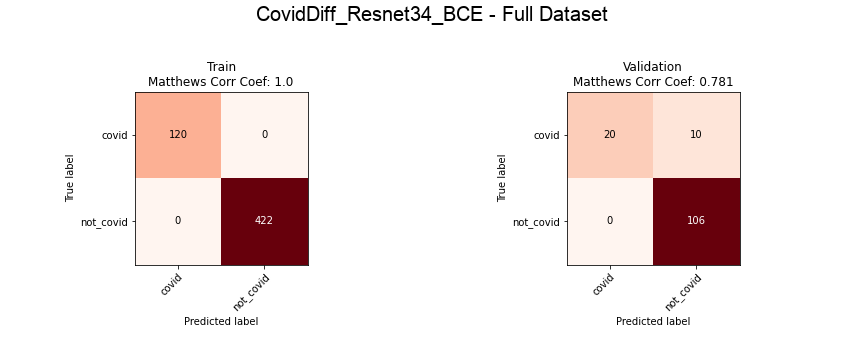

Train                         Validation                  \
             precision recall f1-score support  precision recall f1-score   
covid                1      1      1.0     120          1   0.67     0.80   
not_covid            1      1      1.0     422       0.91      1     0.95   
accuracy                           1.0     542                       0.93   
macro avg            1      1      1.0     542       0.96   0.83     0.88   
weighted avg         1      1      1.0     542       0.93   0.93     0.92   

                      
             support  
covid             30  
not_covid        106  
accuracy         136  
macro avg        136  
weighted avg     136

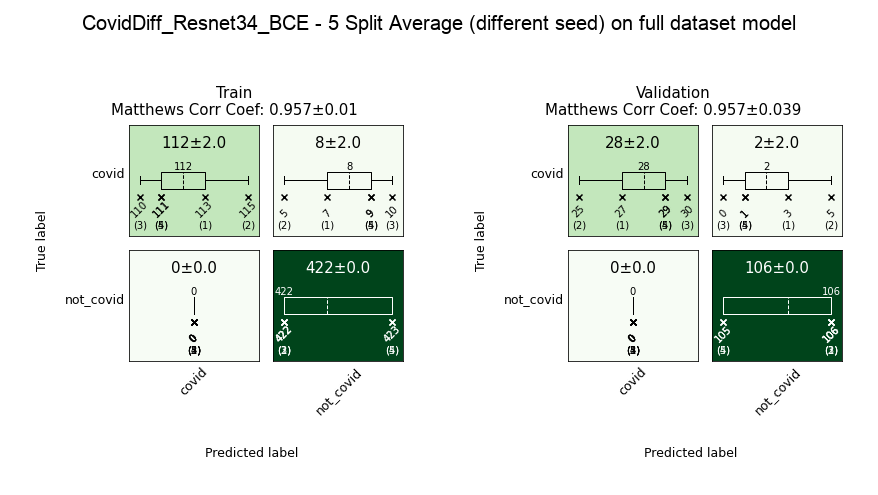


Performance summary:


,valid_loss,valid_roc,valid_acc,train_loss,train_roc,train_acc,train_covid_f1-score,valid_covid_f1-score,train_not_covid_f1-score,valid_not_covid_f1-score,train_mcc,valid_mcc
Set,,,,,,,,,,,,
Cross-Validation,0.308 ± 0.119,0.962 ± 0.029,0.941 ± 0.017,0.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,0.846 ± 0.049,1.0 ± 0.0,0.964 ± 0.011,1.0 ± 0.0,0.824 ± 0.054
Full,0.486,0.871,0.926,0.0,1.0,1.0,0.965 ± 0.008,0.965 ± 0.033,0.991 ± 0.002,0.991 ± 0.008,0.957 ± 0.01,0.957 ± 0.039


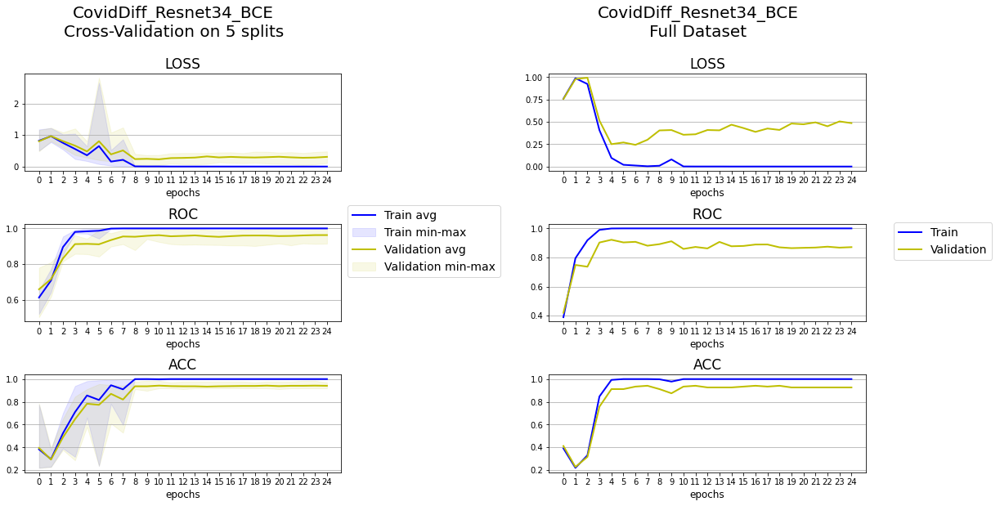

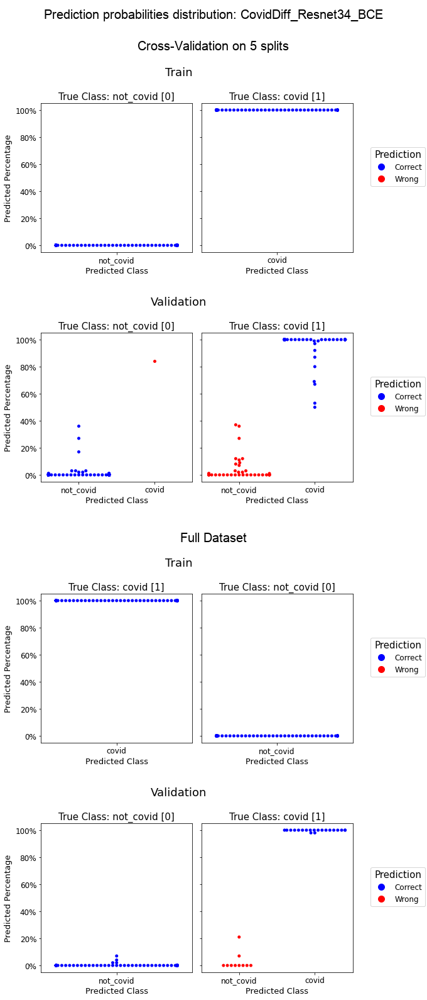



============================== BCE - InvertClass:yes ==============================


Executing a 5-fold cross validation

Train distribution for each split:


,,,train_1,train_2,train_3,train_4,train_5
label,meaning,source,,,,,
0,not_covid,Sacco,422,422,422,423,423
1,covid,Sacco,120,120,120,120,120



Validation distribution for each split:


,,,valid_1,valid_2,valid_3,valid_4,valid_5
label,meaning,source,,,,,
0,not_covid,Sacco,106,106,106,105,105
1,covid,Sacco,30,30,30,30,30



=== Split #1 ===

Trainer started with classifier: Resnet34
dataset: <datasets.ecoSaccoDataset.ecoSaccoDataset object at 0x7fd3230ced30>
batch size: 32
Train set: 542
Validation set: 136
Training with 17 mini-batches per epoch
Logging performance every 4 iter, smoothing every: 17 iter, saving checkpoints every 85 iter

* performance with model.train()
# performance with model.eval()
                    |         VALID        |        TRAIN         |         
 lr     iter  epoch | loss    roc    acc   | loss    roc    acc   |  time   
------------------------------------------------------------------------------
0.010000   17   1.0 | 0.984# 0.209  0.206  | 0.703* 0.644  0.552  |   6.78
                    |                      | 0.946# 0.364  0.223  |   6.78
0.010000   34   2.0 | 0.662# 0.782  0.618  | 0.576* 0.841  0.697  |  13.51
                    |                      | 0.657# 0.798  0.629  |  13.51
0.009000   51   3.0 | 0.849# 0.919  0.382  | 0.426* 0.948  0.830  |  20.13
     

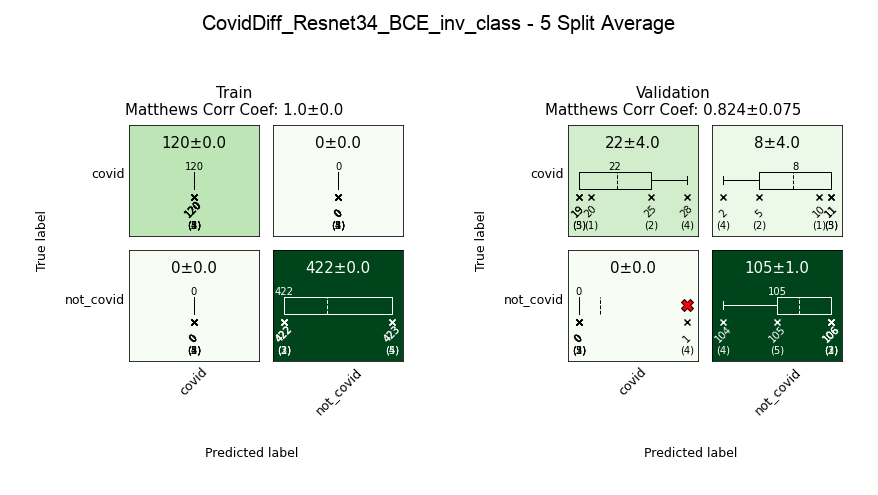



Average Performance:


,Valid_Loss_Avg,Valid_ROC_Avg,Valid_Acc_Avg,Train_Loss_Avg,Train_ROC_Avg,Train_Acc_Avg,train_covid_f1-score_Avg,valid_covid_f1-score_Avg,train_not_covid_f1-score_Avg,valid_not_covid_f1-score_Avg,train_MCC_Avg,valid_MCC_Avg
0,0.322 ± 0.138,0.945 ± 0.036,0.941 ± 0.025,0.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,0.842 ± 0.073,1.0 ± 0.0,0.964 ± 0.015,1.0 ± 0.0,0.824 ± 0.075





=== Full Dataset ===


Distribution for full dataset:


,,,train,validation
label,meaning,source,,
0,not_covid,Sacco,422,106
1,covid,Sacco,120,30


Trainer started with classifier: Resnet34
dataset: <datasets.ecoSaccoDataset.ecoSaccoDataset object at 0x7fd3222cef10>
batch size: 32
Train set: 542
Validation set: 136
Training with 17 mini-batches per epoch
Logging performance every 4 iter, smoothing every: 17 iter, saving checkpoints every 85 iter
SGD (
Parameter Group 0
    dampening: 0
    initial_lr: 0.01
    lr: 0.01
    momentum: 0.9
    nesterov: False
    weight_decay: 0.0001
)'
<torch.optim.lr_scheduler.StepLR object at 0x7fd323981850>'
BCELoss()'
[Accuracy(), <function roc_auc_score at 0x7fd387862790>]'

* performance with model.train()
# performance with model.eval()
                    |         VALID        |        TRAIN         |         
 lr     iter  epoch | loss    roc    acc   | loss    roc    acc   |  time   
------------------------------------------------------------------------------
0.010000   17   1.0 | 1.029# 0.492  0.221  | 0.676* 0.694  0.609  |   6.69
                    |                      | 1.022# 0.

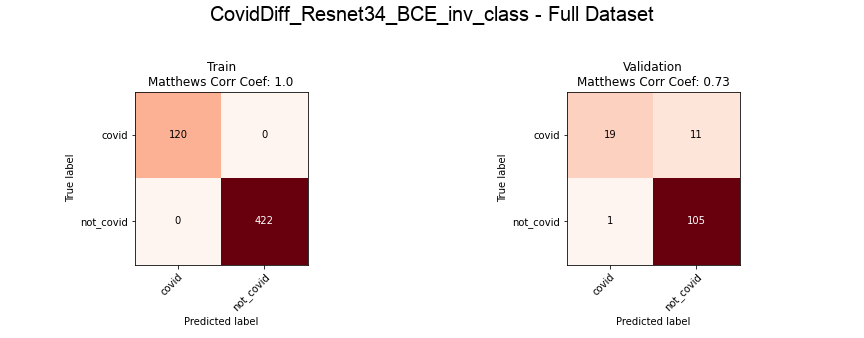

Train                         Validation                  \
             precision recall f1-score support  precision recall f1-score   
covid                1      1      1.0     120       0.95   0.63     0.76   
not_covid            1      1      1.0     422       0.91   0.99     0.95   
accuracy                           1.0     542                       0.91   
macro avg            1      1      1.0     542       0.93   0.81     0.85   
weighted avg         1      1      1.0     542       0.92   0.91     0.90   

                      
             support  
covid             30  
not_covid        106  
accuracy         136  
macro avg        136  
weighted avg     136

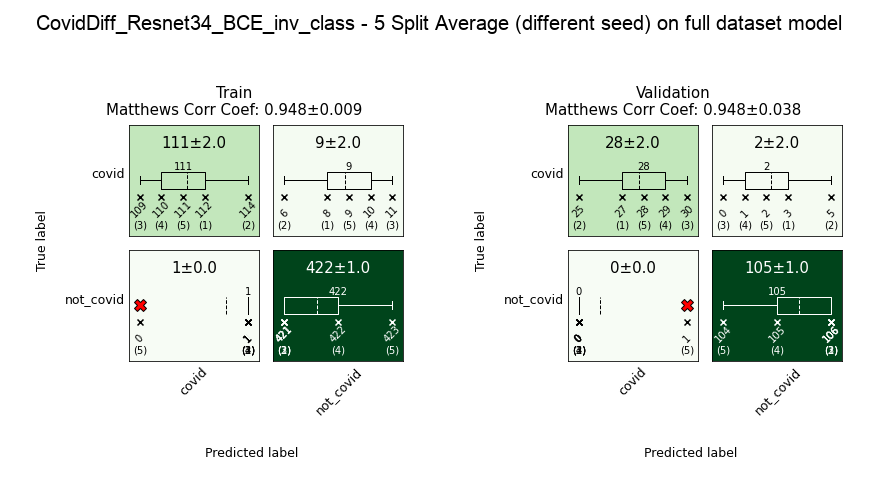


Performance summary:


,valid_loss,valid_roc,valid_acc,train_loss,train_roc,train_acc,train_covid_f1-score,valid_covid_f1-score,train_not_covid_f1-score,valid_not_covid_f1-score,train_mcc,valid_mcc
Set,,,,,,,,,,,,
Cross-Validation,0.322 ± 0.138,0.945 ± 0.036,0.941 ± 0.025,0.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,0.842 ± 0.073,1.0 ± 0.0,0.964 ± 0.015,1.0 ± 0.0,0.824 ± 0.075
Full,0.438,0.912,0.912,0.0,1.0,1.0,0.959 ± 0.008,0.958 ± 0.032,0.989 ± 0.002,0.989 ± 0.008,0.948 ± 0.009,0.948 ± 0.038


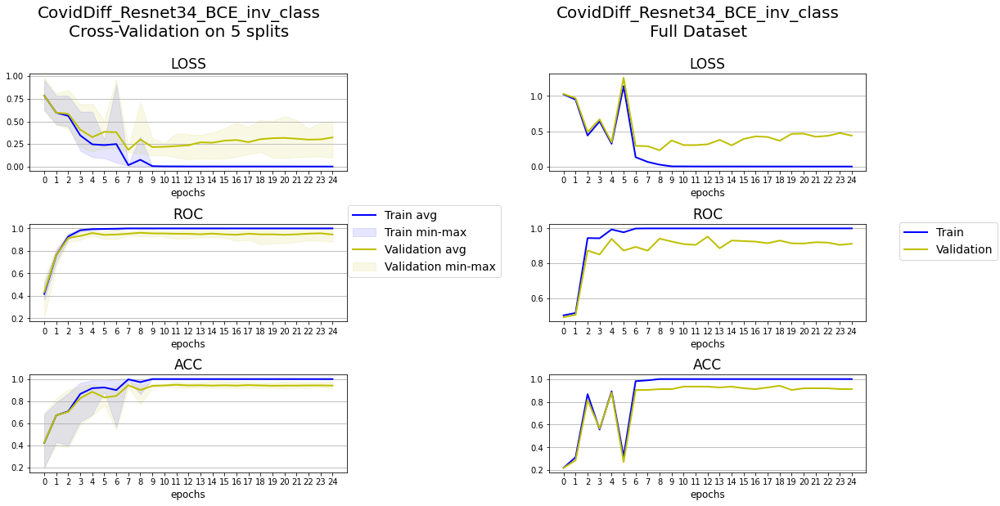

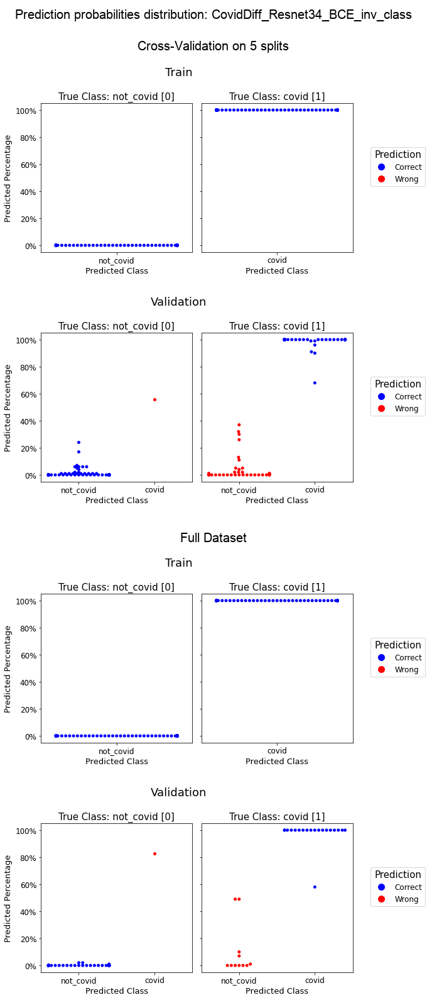



============================== FocLos - InvertClass:no ==============================


Executing a 5-fold cross validation

Train distribution for each split:


,,,train_1,train_2,train_3,train_4,train_5
label,meaning,source,,,,,
0,not_covid,Sacco,422,422,422,423,423
1,covid,Sacco,120,120,120,120,120



Validation distribution for each split:


,,,valid_1,valid_2,valid_3,valid_4,valid_5
label,meaning,source,,,,,
0,not_covid,Sacco,106,106,106,105,105
1,covid,Sacco,30,30,30,30,30



=== Split #1 ===

Trainer started with classifier: Resnet34
dataset: <datasets.ecoSaccoDataset.ecoSaccoDataset object at 0x7fd387603dc0>
batch size: 32
Train set: 542
Validation set: 136
Training with 17 mini-batches per epoch
Logging performance every 4 iter, smoothing every: 17 iter, saving checkpoints every 85 iter

* performance with model.train()
# performance with model.eval()
                    |         VALID        |        TRAIN         |         
 lr     iter  epoch | loss    roc    acc   | loss    roc    acc   |  time   
------------------------------------------------------------------------------
0.010000   17   1.0 | 0.304# 0.430  0.331  | 0.243* 0.599  0.542  |   6.69
                    |                      | 0.305# 0.393  0.321  |   6.69
0.010000   34   2.0 | 0.377# 0.756  0.301  | 0.192* 0.734  0.673  |  13.34
                    |                      | 0.345# 0.719  0.310  |  13.34
0.009000   51   3.0 | 0.195# 0.839  0.529  | 0.119* 0.910  0.801  |  19.97
     

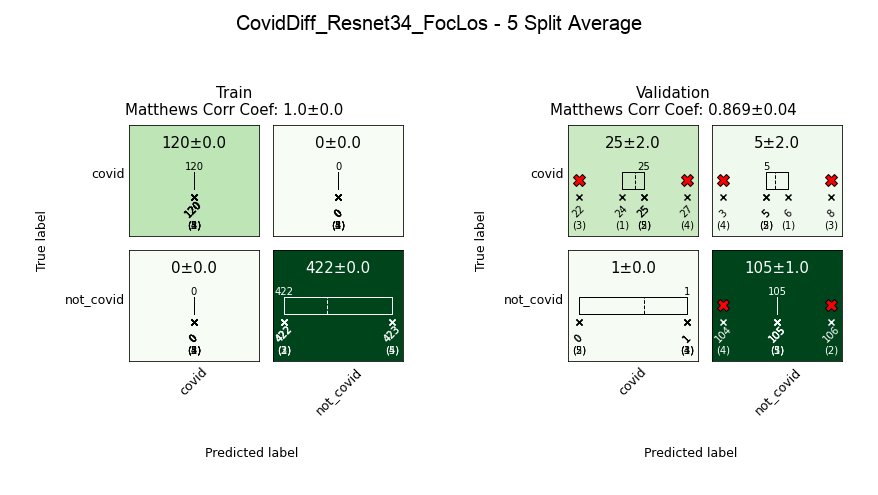



Average Performance:


,Valid_Loss_Avg,Valid_ROC_Avg,Valid_Acc_Avg,Train_Loss_Avg,Train_ROC_Avg,Train_Acc_Avg,train_covid_f1-score_Avg,valid_covid_f1-score_Avg,train_not_covid_f1-score_Avg,valid_not_covid_f1-score_Avg,train_MCC_Avg,valid_MCC_Avg
0,0.088 ± 0.043,0.959 ± 0.03,0.956 ± 0.013,0.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,0.89 ± 0.035,1.0 ± 0.0,0.972 ± 0.008,1.0 ± 0.0,0.869 ± 0.04





=== Full Dataset ===


Distribution for full dataset:


,,,train,validation
label,meaning,source,,
0,not_covid,Sacco,422,106
1,covid,Sacco,120,30


Trainer started with classifier: Resnet34
dataset: <datasets.ecoSaccoDataset.ecoSaccoDataset object at 0x7fd344e08c40>
batch size: 32
Train set: 542
Validation set: 136
Training with 17 mini-batches per epoch
Logging performance every 4 iter, smoothing every: 17 iter, saving checkpoints every 85 iter
SGD (
Parameter Group 0
    dampening: 0
    initial_lr: 0.01
    lr: 0.01
    momentum: 0.9
    nesterov: False
    weight_decay: 0.0001
)'
<torch.optim.lr_scheduler.StepLR object at 0x7fd344e08ac0>'
FocalLoss()'
[Accuracy(), <function roc_auc_score at 0x7fd387862790>]'

* performance with model.train()
# performance with model.eval()
                    |         VALID        |        TRAIN         |         
 lr     iter  epoch | loss    roc    acc   | loss    roc    acc   |  time   
------------------------------------------------------------------------------
0.010000   17   1.0 | 0.369# 0.563  0.250  | 0.243* 0.590  0.568  |   6.64
                    |                      | 0.414# 

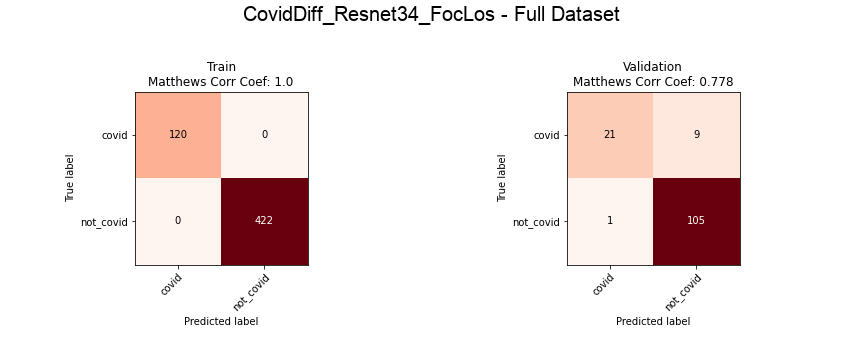

Train                         Validation                  \
             precision recall f1-score support  precision recall f1-score   
covid                1      1      1.0     120       0.95    0.7     0.81   
not_covid            1      1      1.0     422       0.92   0.99     0.95   
accuracy                           1.0     542                       0.93   
macro avg            1      1      1.0     542       0.94   0.85     0.88   
weighted avg         1      1      1.0     542       0.93   0.93     0.92   

                      
             support  
covid             30  
not_covid        106  
accuracy         136  
macro avg        136  
weighted avg     136

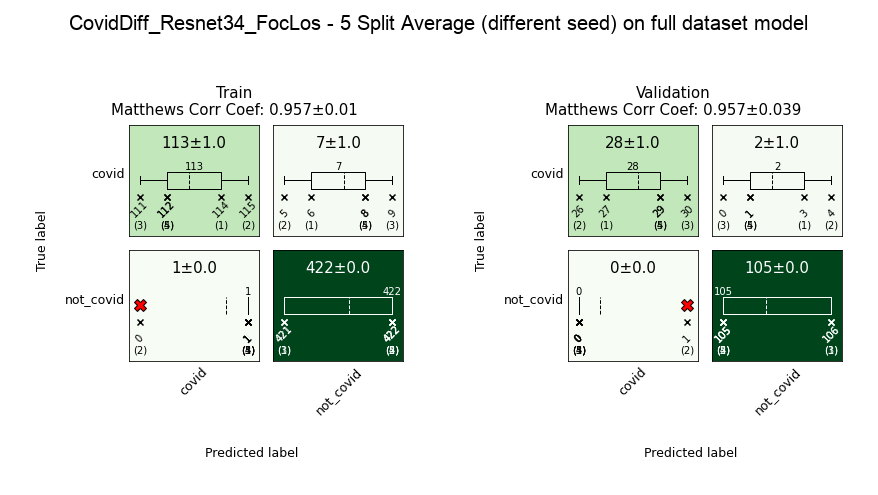


Performance summary:


,valid_loss,valid_roc,valid_acc,train_loss,train_roc,train_acc,train_covid_f1-score,valid_covid_f1-score,train_not_covid_f1-score,valid_not_covid_f1-score,train_mcc,valid_mcc
Set,,,,,,,,,,,,
Cross-Validation,0.088 ± 0.043,0.959 ± 0.03,0.956 ± 0.013,0.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,0.89 ± 0.035,1.0 ± 0.0,0.972 ± 0.008,1.0 ± 0.0,0.869 ± 0.04
Full,0.161,0.89,0.926,0.0,1.0,1.0,0.966 ± 0.008,0.965 ± 0.032,0.991 ± 0.002,0.991 ± 0.008,0.957 ± 0.01,0.957 ± 0.039


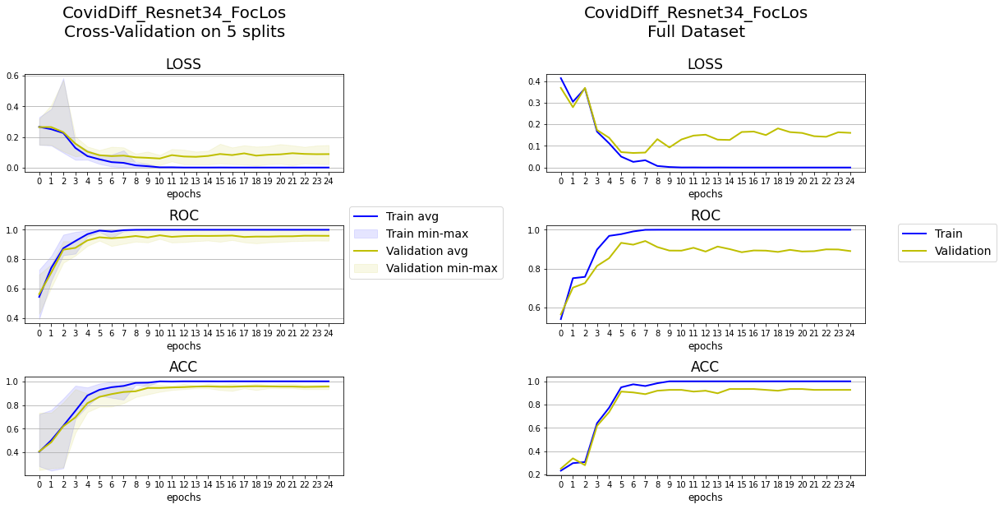

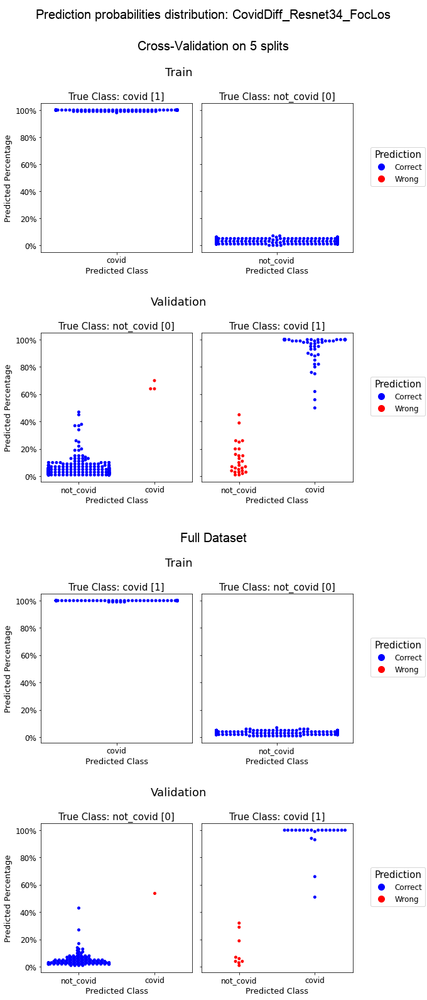



============================== FocLos - InvertClass:yes ==============================


Executing a 5-fold cross validation

Train distribution for each split:


,,,train_1,train_2,train_3,train_4,train_5
label,meaning,source,,,,,
0,not_covid,Sacco,422,422,422,423,423
1,covid,Sacco,120,120,120,120,120



Validation distribution for each split:


,,,valid_1,valid_2,valid_3,valid_4,valid_5
label,meaning,source,,,,,
0,not_covid,Sacco,106,106,106,105,105
1,covid,Sacco,30,30,30,30,30



=== Split #1 ===

Trainer started with classifier: Resnet34
dataset: <datasets.ecoSaccoDataset.ecoSaccoDataset object at 0x7fd321d3ec70>
batch size: 32
Train set: 542
Validation set: 136
Training with 17 mini-batches per epoch
Logging performance every 4 iter, smoothing every: 17 iter, saving checkpoints every 85 iter

* performance with model.train()
# performance with model.eval()
                    |         VALID        |        TRAIN         |         
 lr     iter  epoch | loss    roc    acc   | loss    roc    acc   |  time   
------------------------------------------------------------------------------
0.010000   17   1.0 | 0.367# 0.529  0.235  | 0.273* 0.539  0.507  |   6.58
                    |                      | 0.403# 0.405  0.227  |   6.58
0.010000   34   2.0 | 0.124# 0.732  0.757  | 0.198* 0.754  0.613  |  13.09
                    |                      | 0.124# 0.717  0.769  |  13.09
0.009000   51   3.0 | 0.136# 0.906  0.684  | 0.150* 0.873  0.734  |  19.75
     

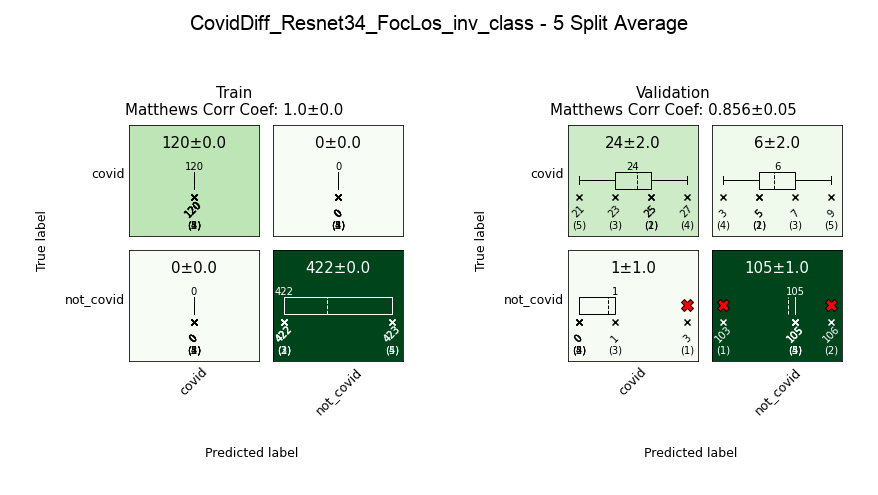



Average Performance:


,Valid_Loss_Avg,Valid_ROC_Avg,Valid_Acc_Avg,Train_Loss_Avg,Train_ROC_Avg,Train_Acc_Avg,train_covid_f1-score_Avg,valid_covid_f1-score_Avg,train_not_covid_f1-score_Avg,valid_not_covid_f1-score_Avg,train_MCC_Avg,valid_MCC_Avg
0,0.085 ± 0.039,0.971 ± 0.018,0.951 ± 0.017,0.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,0.879 ± 0.044,1.0 ± 0.0,0.97 ± 0.01,1.0 ± 0.0,0.856 ± 0.05





=== Full Dataset ===


Distribution for full dataset:


,,,train,validation
label,meaning,source,,
0,not_covid,Sacco,422,106
1,covid,Sacco,120,30


Trainer started with classifier: Resnet34
dataset: <datasets.ecoSaccoDataset.ecoSaccoDataset object at 0x7fd323cddf40>
batch size: 32
Train set: 542
Validation set: 136
Training with 17 mini-batches per epoch
Logging performance every 4 iter, smoothing every: 17 iter, saving checkpoints every 85 iter
SGD (
Parameter Group 0
    dampening: 0
    initial_lr: 0.01
    lr: 0.01
    momentum: 0.9
    nesterov: False
    weight_decay: 0.0001
)'
<torch.optim.lr_scheduler.StepLR object at 0x7fd323cddaf0>'
FocalLoss()'
[Accuracy(), <function roc_auc_score at 0x7fd387862790>]'

* performance with model.train()
# performance with model.eval()
                    |         VALID        |        TRAIN         |         
 lr     iter  epoch | loss    roc    acc   | loss    roc    acc   |  time   
------------------------------------------------------------------------------
0.010000   17   1.0 | 0.201# 0.561  0.529  | 0.273* 0.561  0.511  |   6.63
                    |                      | 0.204# 

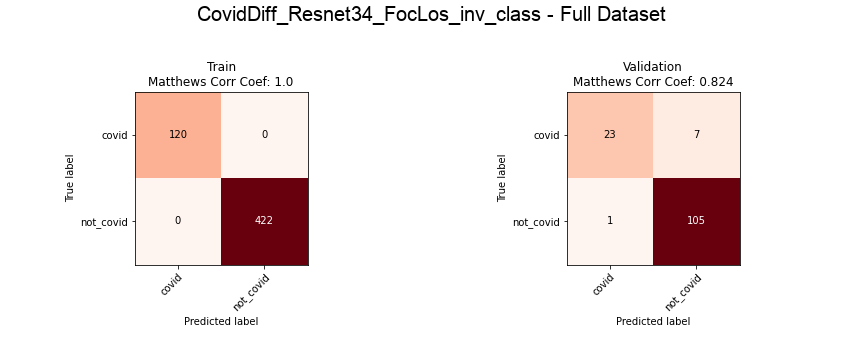

Train                         Validation                  \
             precision recall f1-score support  precision recall f1-score   
covid                1      1      1.0     120       0.96   0.77     0.85   
not_covid            1      1      1.0     422       0.94   0.99     0.96   
accuracy                           1.0     542                       0.94   
macro avg            1      1      1.0     542       0.95   0.88     0.91   
weighted avg         1      1      1.0     542       0.94   0.94     0.94   

                      
             support  
covid             30  
not_covid        106  
accuracy         136  
macro avg        136  
weighted avg     136

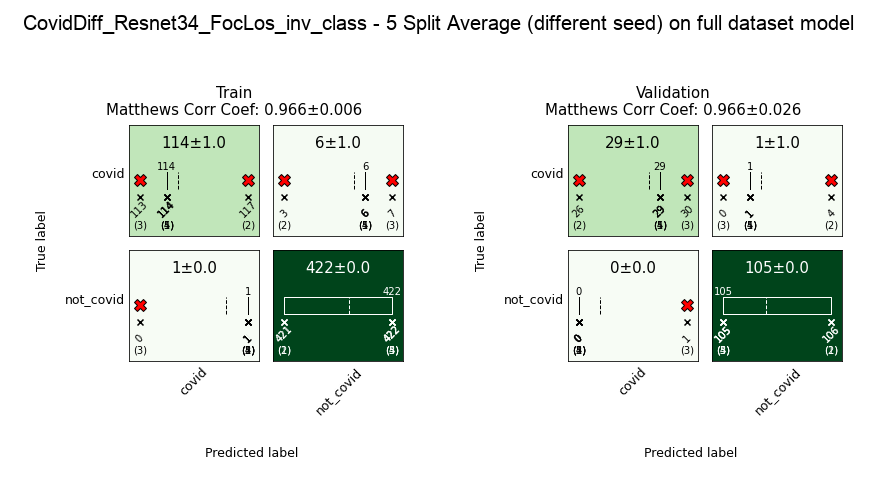


Performance summary:


,valid_loss,valid_roc,valid_acc,train_loss,train_roc,train_acc,train_covid_f1-score,valid_covid_f1-score,train_not_covid_f1-score,valid_not_covid_f1-score,train_mcc,valid_mcc
Set,,,,,,,,,,,,
Cross-Validation,0.085 ± 0.039,0.971 ± 0.018,0.951 ± 0.017,0.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,0.879 ± 0.044,1.0 ± 0.0,0.97 ± 0.01,1.0 ± 0.0,0.856 ± 0.05
Full,0.127,0.943,0.941,0.0,1.0,1.0,0.973 ± 0.005,0.972 ± 0.022,0.992 ± 0.001,0.993 ± 0.006,0.966 ± 0.006,0.966 ± 0.026


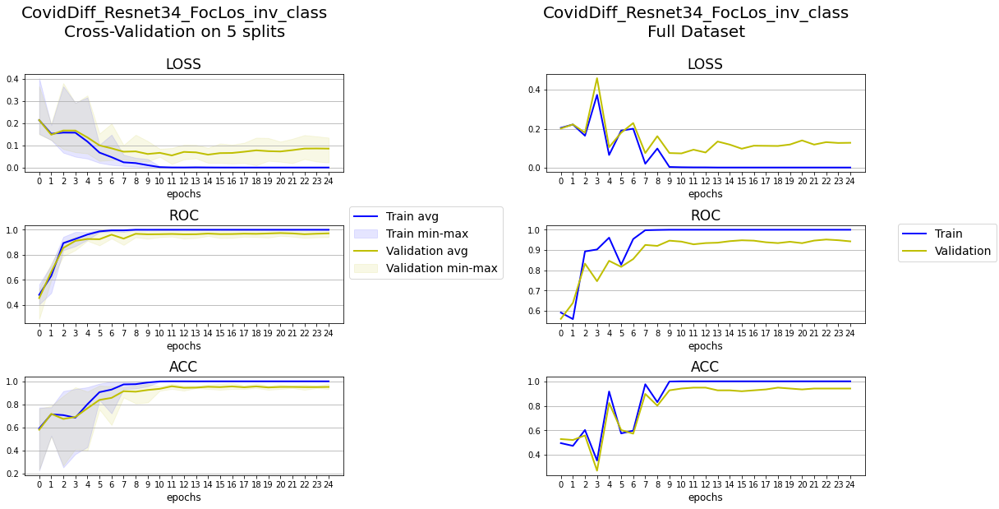

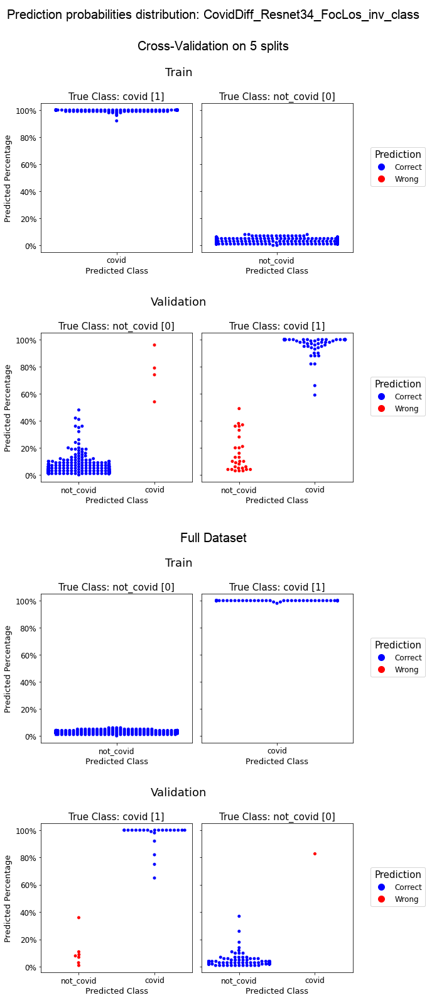




Final Log:


,session_ID,valid_loss,valid_roc,valid_acc,train_loss,train_roc,train_acc,train_covid_f1-score,valid_covid_f1-score,train_not_covid_f1-score,valid_not_covid_f1-score,train_mcc,valid_mcc,loss,inverted_class,model_ID
Cross-Validation,CovidDiff_Resnet34_BCE,0.308 ± 0.119,0.962 ± 0.029,0.941 ± 0.017,0.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,0.846 ± 0.049,1.0 ± 0.0,0.964 ± 0.011,1.0 ± 0.0,0.824 ± 0.054,BCE,no,Resnet34
Full,CovidDiff_Resnet34_BCE,0.486,0.871,0.926,0.0,1.0,1.0,0.965 ± 0.008,0.965 ± 0.033,0.991 ± 0.002,0.991 ± 0.008,0.957 ± 0.01,0.957 ± 0.039,BCE,no,Resnet34
Cross-Validation,CovidDiff_Resnet34_BCE_inv_class,0.322 ± 0.138,0.945 ± 0.036,0.941 ± 0.025,0.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,0.842 ± 0.073,1.0 ± 0.0,0.964 ± 0.015,1.0 ± 0.0,0.824 ± 0.075,BCE,yes,Resnet34
Full,CovidDiff_Resnet34_BCE_inv_class,0.438,0.912,0.912,0.0,1.0,1.0,0.959 ± 0.008,0.958 ± 0.032,0.989 ± 0.002,0.989 ± 0.008,0.948 ± 0.009,0.948 ± 0.038,BCE,yes,Resnet34
Cross-Validation,CovidDiff_Resnet34_FocLos,0.088 ± 0.043,0.959 ± 0.03,0.956 ± 0.013,0.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,0.89 ± 0.035,1.0 ± 0.0,0.972 ± 0.008,1.0 ± 0.0,0.869 ± 0.04,FocLos,no,Resnet34
Full,CovidDiff_Resnet34_FocLos,0.161,0.89,0.926,0.0,1.0,1.0,0.966 ± 0.008,0.965 ± 0.032,0.991 ± 0.002,0.991 ± 0.008,0.957 ± 0.01,0.957 ± 0.039,FocLos,no,Resnet34
Cross-Validation,CovidDiff_Resnet34_FocLos_inv_class,0.085 ± 0.039,0.971 ± 0.018,0.951 ± 0.017,0.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,0.879 ± 0.044,1.0 ± 0.0,0.97 ± 0.01,1.0 ± 0.0,0.856 ± 0.05,FocLos,yes,Resnet34
Full,CovidDiff_Resnet34_FocLos_inv_class,0.127,0.943,0.941,0.0,1.0,1.0,0.973 ± 0.005,0.972 ± 0.022,0.992 ± 0.001,0.993 ± 0.006,0.966 ± 0.006,0.966 ± 0.026,FocLos,yes,Resnet34



Total elapsed time: 1:18:03


In [8]:
# cross-validate and train model on full set - hyperparameter tuning for loss_set and invert_class_set

trainer_ID = 'CovidDiff'
base_classifier_ID = Resnet34(num_channels=dataset.total_frames)
dataset = dataset
batch_size = 32

cvu.tune_with_CV(trainer_ID = trainer_ID,
                 dataset = dataset,
                 base_classifier_ID = base_classifier_ID,
                 batch_size = batch_size,
                 n_splits = 5,
                 max_epochs_split = 25,
                 max_epochs_full = 25,
                 stratify_lab = dataset.labels,
                 loss_set = ['BCE', 'FocLos'],
                 invert_class_set = True,
                 measure_to_plot = ['loss', 'roc', 'acc'],
                 metrics = [Accuracy(), roc_auc_score],
                 show_info=False, show_log=2, show_perf_plot=True,
                 save_split_checkpoint=False, save_split_final=True,
                 save_full_checkpoint=False, save_full_final=True,
                 reload_split=False, reload_full=False)

# reload final performance log
final_log=pd.read_csv(os.path.join('results', trainer_ID, trainer_ID+'_final_performance.csv'), sep=';', index_col=0)

In [5]:
# evaluate features visualization

new_index = np.array(dataset.df.index)
model = Resnet34FeatVis(num_channels=dataset.total_frames)
reload_model_ID = 'CovidDiff_Resnet34_BCE_full'
model_ID = 'CovidDiff_Resnet34_BCE'
save_path = 'CovidDiff'

fvu = FeaturesVisualizationUtils(save_path=save_path,
                                 model_ID=model_ID,
                                 image_size = size)
fvu.run_features_visualization(dataset=dataset,
                               new_index=new_index,
                               model=model,
                               reload_model_ID=reload_model_ID,
                               gradient_aggregation='mean',
                               apply_soft_activation=True,
                               nn_to_replace=nn.ReLU,
                               nn_replacement=nn.LeakyReLU(inplace=True),
                               frame_to_show=0,
                               heatmap_transformation='exponential')
fvu.plot_heatmap(fig_size = 12)
fvu.plot_sample_masked(fig_size = 12, max_sample_combination = 30, sample_ncol = 4)
fvu.plot_heatmap_max_distribution()

Evaluating heatmap:

 -- Gradient aggregation: mean
 -- Soft activation is applied to <class 'torch.nn.modules.activation.ReLU'> , replaced with LeakyReLU(negative_slope=0.01, inplace=True)



RuntimeError: CUDA out of memory. Tried to allocate 20.00 MiB (GPU 1; 10.92 GiB total capacity; 7.24 GiB already allocated; 17.44 MiB free; 7.71 GiB reserved in total by PyTorch)

## Create Dataset with original frames

In [10]:
input_name = 'eco_50_first_Nodiff_samplFirst_mask_256'

frame_to_keep = 50
frame_sampling = 'first_available' # 'equally_spaced' 
apply_frame_difference = False
apply_sampling_first = True  # if True, apply sampling first and then frame difference (if any). If False, reverse order
apply_mask = True
resize = 256
output_folder = os.path.join('./input/', input_name)
metadata_out = os.path.join('./input/', 'MetaData_' + input_name + '.csv')

In [11]:
# create dataset

metadata_raw = pd.read_csv('./input/Clip_MetaDataUpdate.csv')
create_model_input(metadata_raw, output_folder, metadata_out, frame_to_keep, frame_sampling, apply_frame_difference,
                   apply_sampling_first, apply_mask, resize)


Total removed: 54
    - because of color: 3
    - because of number of frames: 51

Total remaining: 678 out of 732 



,count,out of
covid,,
0,528,573
1,150,159


,count,out of
akinetic,,
0,479,509
1,199,223



Raw pickle folder size: 33,966 MB

Total number of frames will be: 50 

732 / 732
Total elapsed time: 0:02:18

Files saved in ./input/eco_50_first_Nodiff_samplFirst_mask_256
Output folder size: 2,119 MB

Model metadata saved in ./input/MetaData_eco_50_first_Nodiff_samplFirst_mask_256.csv


## Train model Akinetic Yes/No

In [7]:
input_name = 'eco_50_first_Nodiff_samplFirst_mask_256'
size = 256

dataset = ecoSaccoDataset(input_name, target_class='akinetic', size=size, show_info=True)

ecoSaccoDataset initialized with size=256, augment=None
Dataset is located in ./input/eco_50_first_Nodiff_samplFirst_mask_256

############    eco_50_first_Nodiff_samplFirst_mask_256 dataset    ############

Total files: 678
Total frames: 50


,image,label,meaning,source
0,./input/eco_50_first_Nodiff_samplFirst_mask_25...,1,akinetic,Sacco
1,./input/eco_50_first_Nodiff_samplFirst_mask_25...,1,akinetic,Sacco
2,./input/eco_50_first_Nodiff_samplFirst_mask_25...,1,akinetic,Sacco
3,./input/eco_50_first_Nodiff_samplFirst_mask_25...,1,akinetic,Sacco
4,./input/eco_50_first_Nodiff_samplFirst_mask_25...,1,akinetic,Sacco
...,...,...,...,...
673,./input/eco_50_first_Nodiff_samplFirst_mask_25...,0,not_akinetic,Sacco
674,./input/eco_50_first_Nodiff_samplFirst_mask_25...,0,not_akinetic,Sacco
675,./input/eco_50_first_Nodiff_samplFirst_mask_25...,0,not_akinetic,Sacco
676,./input/eco_50_first_Nodiff_samplFirst_mask_25...,0,not_akinetic,Sacco


,,,count
label,meaning,source,
0,not_akinetic,Sacco,479
1,akinetic,Sacco,199


/home/alessandro/.conda/envs/defeatcovid19/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)



Used raw classifier: Resnet34

Start hyperparameter tuning


============================== BCE - InvertClass:no ==============================


Executing a 5-fold cross validation

Train distribution for each split:


,,,train_1,train_2,train_3,train_4,train_5
label,meaning,source,,,,,
0,not_akinetic,Sacco,383,383,383,384,383
1,akinetic,Sacco,159,159,159,159,160



Validation distribution for each split:


,,,valid_1,valid_2,valid_3,valid_4,valid_5
label,meaning,source,,,,,
0,not_akinetic,Sacco,96,96,96,95,96
1,akinetic,Sacco,40,40,40,40,39



=== Split #1 ===

Trainer started with classifier: Resnet34
dataset: <datasets.ecoSaccoDataset.ecoSaccoDataset object at 0x7fd3233a2130>
batch size: 32
Train set: 542
Validation set: 136
Training with 17 mini-batches per epoch
Logging performance every 4 iter, smoothing every: 17 iter, saving checkpoints every 85 iter

* performance with model.train()
# performance with model.eval()
                    |         VALID        |        TRAIN         |         
 lr     iter  epoch | loss    roc    acc   | loss    roc    acc   |  time   
------------------------------------------------------------------------------
0.010000   17   1.0 | 0.872# 0.711  0.309  | 0.732* 0.525  0.506  |   6.64
                    |                      | 0.900# 0.600  0.310  |   6.64
0.010000   34   2.0 | 0.639# 0.558  0.676  | 0.668* 0.658  0.568  |  13.28
                    |                      | 0.626# 0.575  0.670  |  13.28
0.009000   51   3.0 | 0.545# 0.772  0.728  | 0.582* 0.795  0.681  |  19.99
     

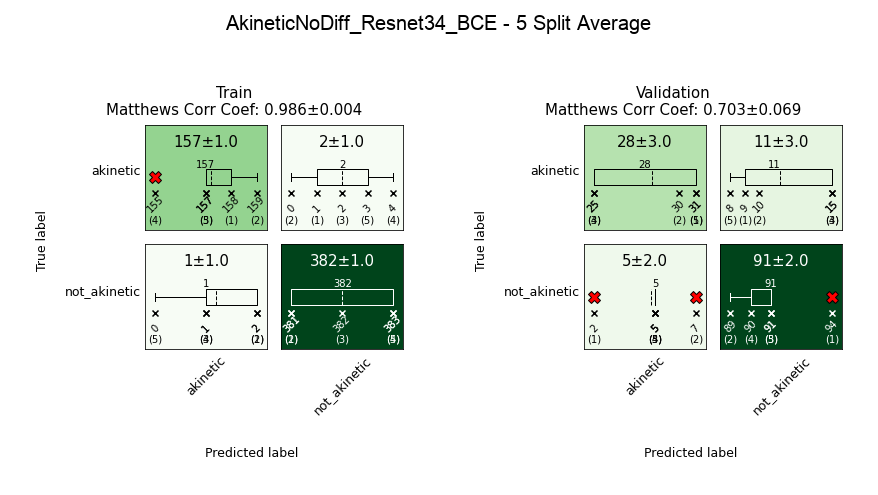



Average Performance:


,Valid_Loss_Avg,Valid_ROC_Avg,Valid_Acc_Avg,Train_Loss_Avg,Train_ROC_Avg,Train_Acc_Avg,train_akinetic_f1-score_Avg,valid_akinetic_f1-score_Avg,train_not_akinetic_f1-score_Avg,valid_not_akinetic_f1-score_Avg,train_MCC_Avg,valid_MCC_Avg
0,0.511 ± 0.113,0.916 ± 0.021,0.881 ± 0.027,0.01 ± 0.001,1.0 ± 0.0,0.994 ± 0.002,0.99 ± 0.003,0.777 ± 0.056,0.996 ± 0.001,0.918 ± 0.018,0.986 ± 0.004,0.703 ± 0.069





=== Full Dataset ===


Distribution for full dataset:


,,,train,validation
label,meaning,source,,
0,not_akinetic,Sacco,383,96
1,akinetic,Sacco,159,40


Trainer started with classifier: Resnet34
dataset: <datasets.ecoSaccoDataset.ecoSaccoDataset object at 0x7fd36dc1f970>
batch size: 32
Train set: 542
Validation set: 136
Training with 17 mini-batches per epoch
Logging performance every 4 iter, smoothing every: 17 iter, saving checkpoints every 85 iter
SGD (
Parameter Group 0
    dampening: 0
    initial_lr: 0.01
    lr: 0.01
    momentum: 0.9
    nesterov: False
    weight_decay: 0.0001
)'
<torch.optim.lr_scheduler.StepLR object at 0x7fd3642e5a60>'
BCELoss()'
[Accuracy(), <function roc_auc_score at 0x7fd387862790>]'

* performance with model.train()
# performance with model.eval()
                    |         VALID        |        TRAIN         |         
 lr     iter  epoch | loss    roc    acc   | loss    roc    acc   |  time   
------------------------------------------------------------------------------
0.010000   17   1.0 | 0.740# 0.481  0.441  | 0.740* 0.517  0.517  |   6.71
                    |                      | 0.727# 0.

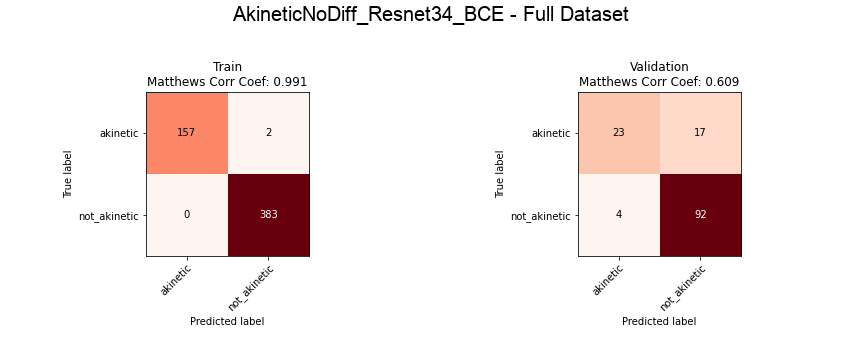

Train                         Validation                  \
             precision recall f1-score support  precision recall f1-score   
akinetic             1   0.99     0.99     159       0.85   0.57     0.69   
not_akinetic      0.99      1     1.00     383       0.84   0.96     0.90   
accuracy                          1.00     542                       0.85   
macro avg            1   0.99     1.00     542       0.85   0.77     0.79   
weighted avg         1      1     1.00     542       0.85   0.85     0.84   

                      
             support  
akinetic          40  
not_akinetic      96  
accuracy         136  
macro avg        136  
weighted avg     136

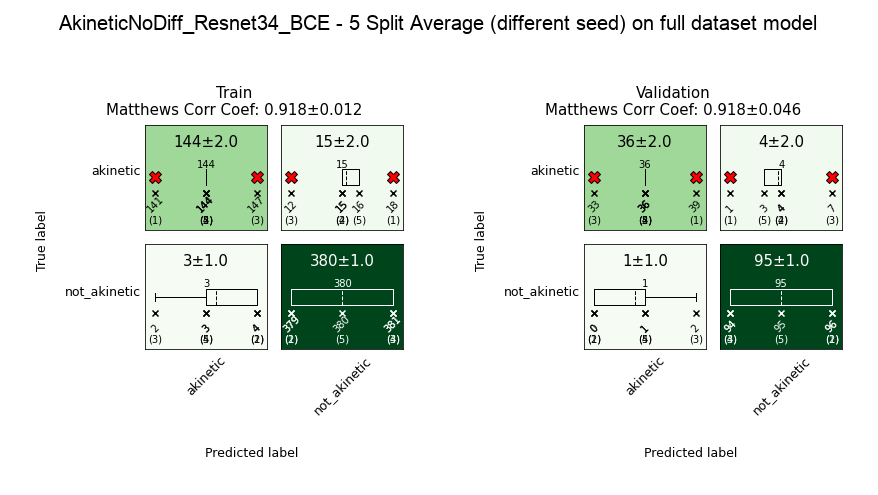


Performance summary:


,valid_loss,valid_roc,valid_acc,train_loss,train_roc,train_acc,train_akinetic_f1-score,valid_akinetic_f1-score,train_not_akinetic_f1-score,valid_not_akinetic_f1-score,train_mcc,valid_mcc
Set,,,,,,,,,,,,
Cross-Validation,0.511 ± 0.113,0.916 ± 0.021,0.881 ± 0.027,0.01 ± 0.001,1.0 ± 0.0,0.994 ± 0.002,0.99 ± 0.003,0.777 ± 0.056,0.996 ± 0.001,0.918 ± 0.018,0.986 ± 0.004,0.703 ± 0.069
Full,0.591,0.908,0.846,0.006,1.0,0.996,0.94 ± 0.009,0.939 ± 0.035,0.976 ± 0.003,0.976 ± 0.013,0.918 ± 0.012,0.918 ± 0.046


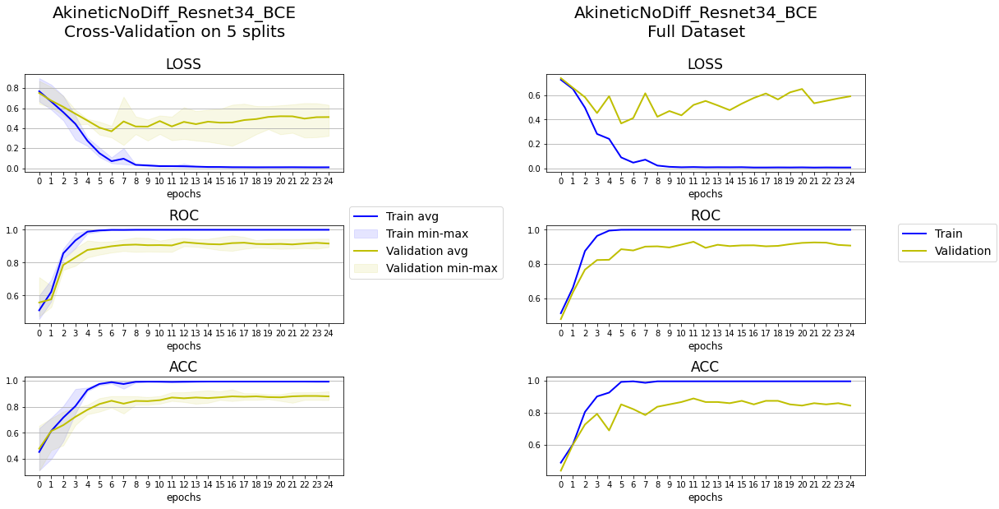

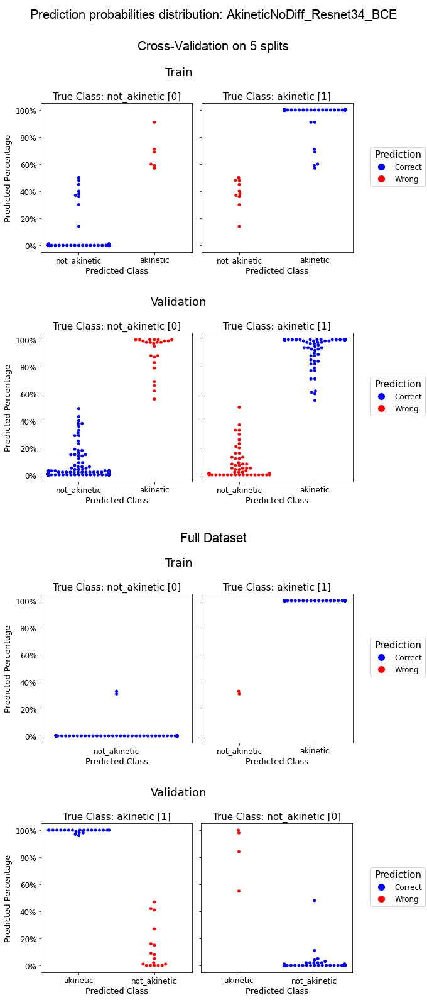



============================== BCE - InvertClass:yes ==============================


Executing a 5-fold cross validation

Train distribution for each split:


,,,train_1,train_2,train_3,train_4,train_5
label,meaning,source,,,,,
0,not_akinetic,Sacco,383,383,383,384,383
1,akinetic,Sacco,159,159,159,159,160



Validation distribution for each split:


,,,valid_1,valid_2,valid_3,valid_4,valid_5
label,meaning,source,,,,,
0,not_akinetic,Sacco,96,96,96,95,96
1,akinetic,Sacco,40,40,40,40,39



=== Split #1 ===

Trainer started with classifier: Resnet34
dataset: <datasets.ecoSaccoDataset.ecoSaccoDataset object at 0x7fd323943460>
batch size: 32
Train set: 542
Validation set: 136
Training with 17 mini-batches per epoch
Logging performance every 4 iter, smoothing every: 17 iter, saving checkpoints every 85 iter

* performance with model.train()
# performance with model.eval()
                    |         VALID        |        TRAIN         |         
 lr     iter  epoch | loss    roc    acc   | loss    roc    acc   |  time   
------------------------------------------------------------------------------
0.010000   17   1.0 | 0.802# 0.621  0.331  | 0.742* 0.559  0.520  |   6.57
                    |                      | 0.831# 0.466  0.314  |   6.57
0.010000   34   2.0 | 0.893# 0.651  0.309  | 0.671* 0.684  0.614  |  13.19
                    |                      | 0.897# 0.612  0.339  |  13.19
0.009000   51   3.0 | 0.611# 0.826  0.669  | 0.569* 0.819  0.694  |  19.83
     

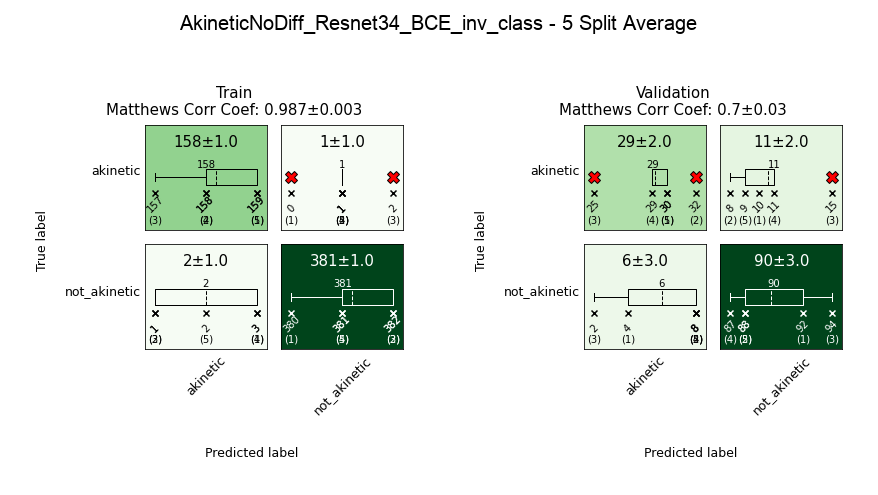



Average Performance:


,Valid_Loss_Avg,Valid_ROC_Avg,Valid_Acc_Avg,Train_Loss_Avg,Train_ROC_Avg,Train_Acc_Avg,train_akinetic_f1-score_Avg,valid_akinetic_f1-score_Avg,train_not_akinetic_f1-score_Avg,valid_not_akinetic_f1-score_Avg,train_MCC_Avg,valid_MCC_Avg
0,0.513 ± 0.075,0.925 ± 0.013,0.878 ± 0.012,0.009 ± 0.002,1.0 ± 0.0,0.994 ± 0.001,0.991 ± 0.002,0.778 ± 0.025,0.996 ± 0.001,0.915 ± 0.009,0.987 ± 0.003,0.7 ± 0.03





=== Full Dataset ===


Distribution for full dataset:


,,,train,validation
label,meaning,source,,
0,not_akinetic,Sacco,383,96
1,akinetic,Sacco,159,40


Trainer started with classifier: Resnet34
dataset: <datasets.ecoSaccoDataset.ecoSaccoDataset object at 0x7fd344e3d070>
batch size: 32
Train set: 542
Validation set: 136
Training with 17 mini-batches per epoch
Logging performance every 4 iter, smoothing every: 17 iter, saving checkpoints every 85 iter
SGD (
Parameter Group 0
    dampening: 0
    initial_lr: 0.01
    lr: 0.01
    momentum: 0.9
    nesterov: False
    weight_decay: 0.0001
)'
<torch.optim.lr_scheduler.StepLR object at 0x7fd344e3d0a0>'
BCELoss()'
[Accuracy(), <function roc_auc_score at 0x7fd387862790>]'

* performance with model.train()
# performance with model.eval()
                    |         VALID        |        TRAIN         |         
 lr     iter  epoch | loss    roc    acc   | loss    roc    acc   |  time   
------------------------------------------------------------------------------
0.010000   17   1.0 | 0.652# 0.636  0.662  | 0.727* 0.581  0.528  |   6.77
                    |                      | 0.660# 0.

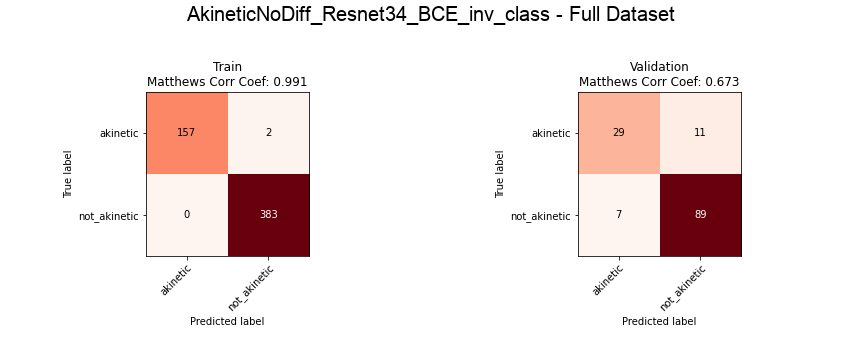

Train                         Validation                  \
             precision recall f1-score support  precision recall f1-score   
akinetic             1   0.99     0.99     159       0.81   0.72     0.76   
not_akinetic      0.99      1     1.00     383       0.89   0.93     0.91   
accuracy                          1.00     542                       0.87   
macro avg            1   0.99     1.00     542       0.85   0.83     0.84   
weighted avg         1      1     1.00     542       0.87   0.87     0.87   

                      
             support  
akinetic          40  
not_akinetic      96  
accuracy         136  
macro avg        136  
weighted avg     136

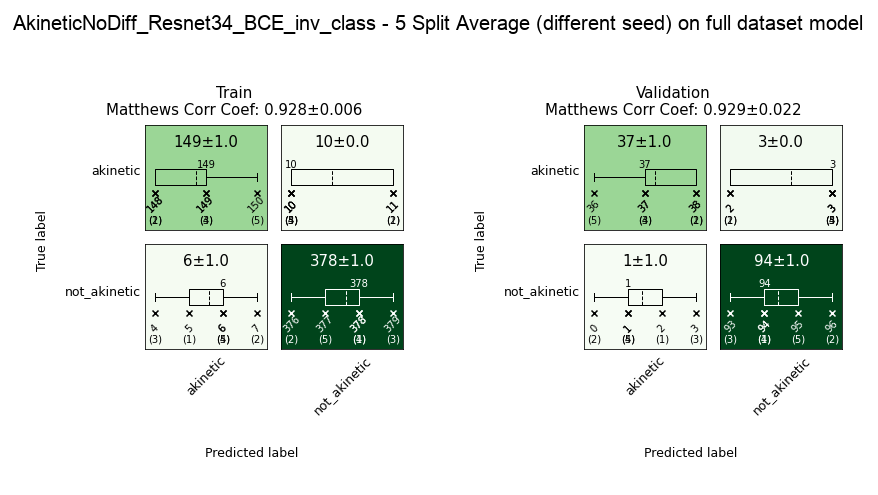


Performance summary:


,valid_loss,valid_roc,valid_acc,train_loss,train_roc,train_acc,train_akinetic_f1-score,valid_akinetic_f1-score,train_not_akinetic_f1-score,valid_not_akinetic_f1-score,train_mcc,valid_mcc
Set,,,,,,,,,,,,
Cross-Validation,0.513 ± 0.075,0.925 ± 0.013,0.878 ± 0.012,0.009 ± 0.002,1.0 ± 0.0,0.994 ± 0.001,0.991 ± 0.002,0.778 ± 0.025,0.996 ± 0.001,0.915 ± 0.009,0.987 ± 0.003,0.7 ± 0.03
Full,0.621,0.931,0.868,0.006,1.0,0.996,0.949 ± 0.004,0.949 ± 0.016,0.979 ± 0.002,0.979 ± 0.007,0.928 ± 0.006,0.929 ± 0.022


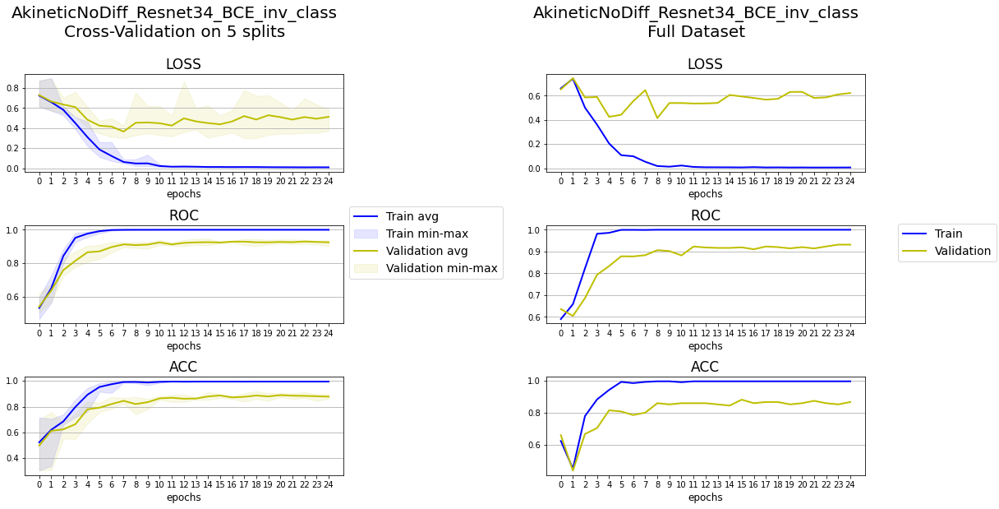

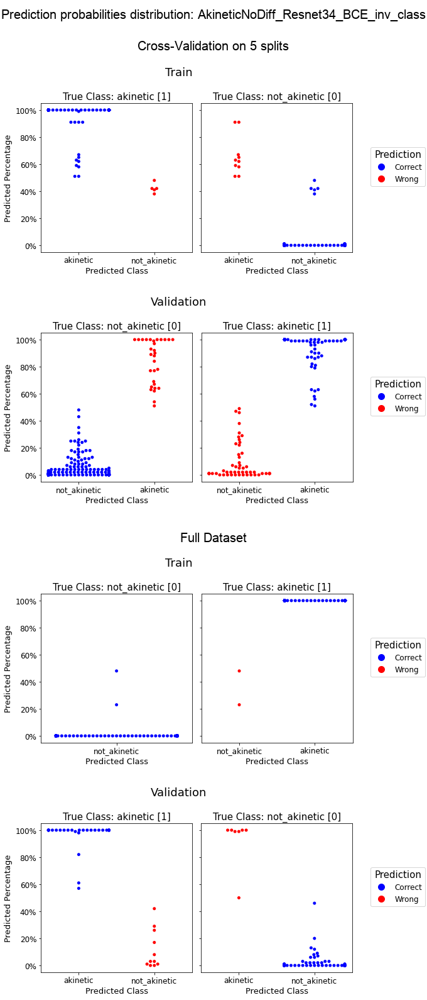



============================== FocLos - InvertClass:no ==============================


Executing a 5-fold cross validation

Train distribution for each split:


,,,train_1,train_2,train_3,train_4,train_5
label,meaning,source,,,,,
0,not_akinetic,Sacco,383,383,383,384,383
1,akinetic,Sacco,159,159,159,159,160



Validation distribution for each split:


,,,valid_1,valid_2,valid_3,valid_4,valid_5
label,meaning,source,,,,,
0,not_akinetic,Sacco,96,96,96,95,96
1,akinetic,Sacco,40,40,40,40,39



=== Split #1 ===

Trainer started with classifier: Resnet34
dataset: <datasets.ecoSaccoDataset.ecoSaccoDataset object at 0x7fd3233a2040>
batch size: 32
Train set: 542
Validation set: 136
Training with 17 mini-batches per epoch
Logging performance every 4 iter, smoothing every: 17 iter, saving checkpoints every 85 iter

* performance with model.train()
# performance with model.eval()
                    |         VALID        |        TRAIN         |         
 lr     iter  epoch | loss    roc    acc   | loss    roc    acc   |  time   
------------------------------------------------------------------------------
0.010000   17   1.0 | 0.282# 0.522  0.368  | 0.263* 0.524  0.533  |   6.56
                    |                      | 0.294# 0.488  0.325  |   6.56
0.010000   34   2.0 | 0.162# 0.706  0.625  | 0.229* 0.619  0.568  |  13.22
                    |                      | 0.171# 0.690  0.618  |  13.22
0.009000   51   3.0 | 0.171# 0.688  0.728  | 0.188* 0.736  0.685  |  19.93
     

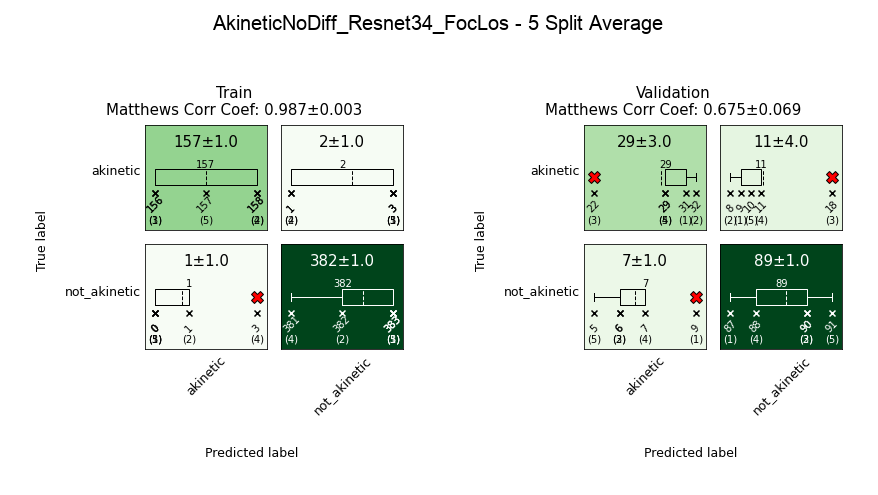



Average Performance:


,Valid_Loss_Avg,Valid_ROC_Avg,Valid_Acc_Avg,Train_Loss_Avg,Train_ROC_Avg,Train_Acc_Avg,train_akinetic_f1-score_Avg,valid_akinetic_f1-score_Avg,train_not_akinetic_f1-score_Avg,valid_not_akinetic_f1-score_Avg,train_MCC_Avg,valid_MCC_Avg
0,0.189 ± 0.071,0.911 ± 0.024,0.869 ± 0.026,0.003 ± 0.001,1.0 ± 0.0,0.994 ± 0.001,0.991 ± 0.002,0.76 ± 0.06,0.996 ± 0.001,0.91 ± 0.016,0.987 ± 0.003,0.675 ± 0.069





=== Full Dataset ===


Distribution for full dataset:


,,,train,validation
label,meaning,source,,
0,not_akinetic,Sacco,383,96
1,akinetic,Sacco,159,40


Trainer started with classifier: Resnet34
dataset: <datasets.ecoSaccoDataset.ecoSaccoDataset object at 0x7fd322a5af70>
batch size: 32
Train set: 542
Validation set: 136
Training with 17 mini-batches per epoch
Logging performance every 4 iter, smoothing every: 17 iter, saving checkpoints every 85 iter
SGD (
Parameter Group 0
    dampening: 0
    initial_lr: 0.01
    lr: 0.01
    momentum: 0.9
    nesterov: False
    weight_decay: 0.0001
)'
<torch.optim.lr_scheduler.StepLR object at 0x7fd3442b4fa0>'
FocalLoss()'
[Accuracy(), <function roc_auc_score at 0x7fd387862790>]'

* performance with model.train()
# performance with model.eval()
                    |         VALID        |        TRAIN         |         
 lr     iter  epoch | loss    roc    acc   | loss    roc    acc   |  time   
------------------------------------------------------------------------------
0.010000   17   1.0 | 0.444# 0.493  0.316  | 0.259* 0.536  0.522  |   6.71
                    |                      | 0.416# 

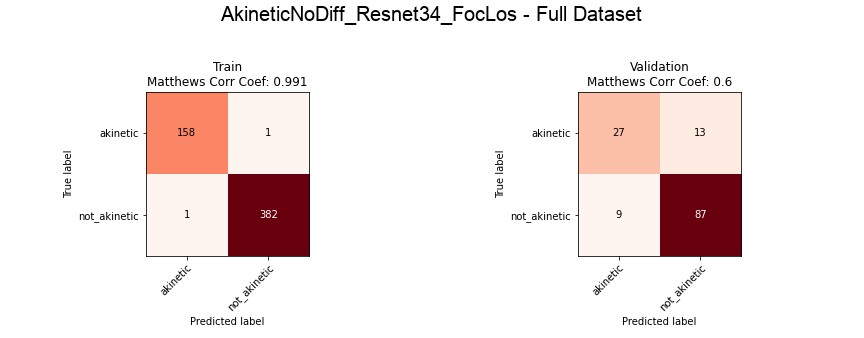

Train                         Validation                  \
             precision recall f1-score support  precision recall f1-score   
akinetic          0.99   0.99     0.99     159       0.75   0.68     0.71   
not_akinetic         1      1     1.00     383       0.87   0.91     0.89   
accuracy                          1.00     542                       0.84   
macro avg            1      1     1.00     542       0.81   0.79     0.80   
weighted avg         1      1     1.00     542       0.83   0.84     0.84   

                      
             support  
akinetic          40  
not_akinetic      96  
accuracy         136  
macro avg        136  
weighted avg     136

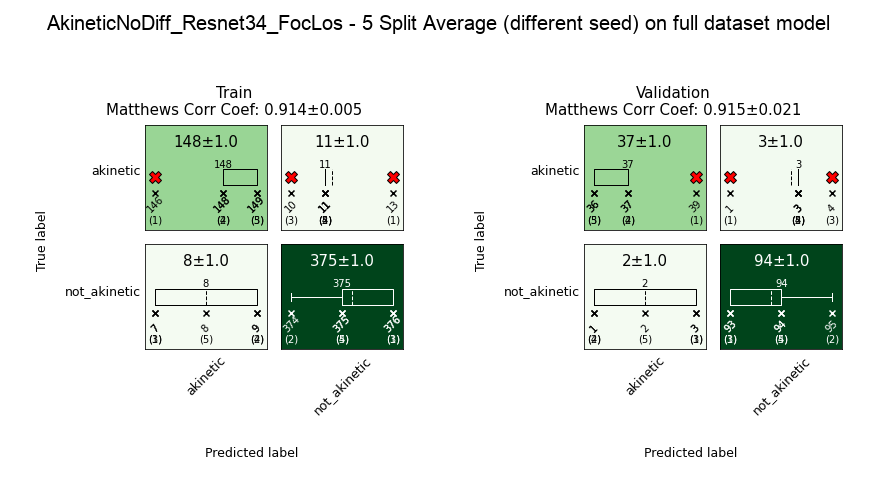


Performance summary:


,valid_loss,valid_roc,valid_acc,train_loss,train_roc,train_acc,train_akinetic_f1-score,valid_akinetic_f1-score,train_not_akinetic_f1-score,valid_not_akinetic_f1-score,train_mcc,valid_mcc
Set,,,,,,,,,,,,
Cross-Validation,0.189 ± 0.071,0.911 ± 0.024,0.869 ± 0.026,0.003 ± 0.001,1.0 ± 0.0,0.994 ± 0.001,0.991 ± 0.002,0.76 ± 0.06,0.996 ± 0.001,0.91 ± 0.016,0.987 ± 0.003,0.675 ± 0.069
Full,0.219,0.894,0.838,0.002,1.0,0.996,0.939 ± 0.004,0.939 ± 0.015,0.975 ± 0.002,0.975 ± 0.006,0.914 ± 0.005,0.915 ± 0.021


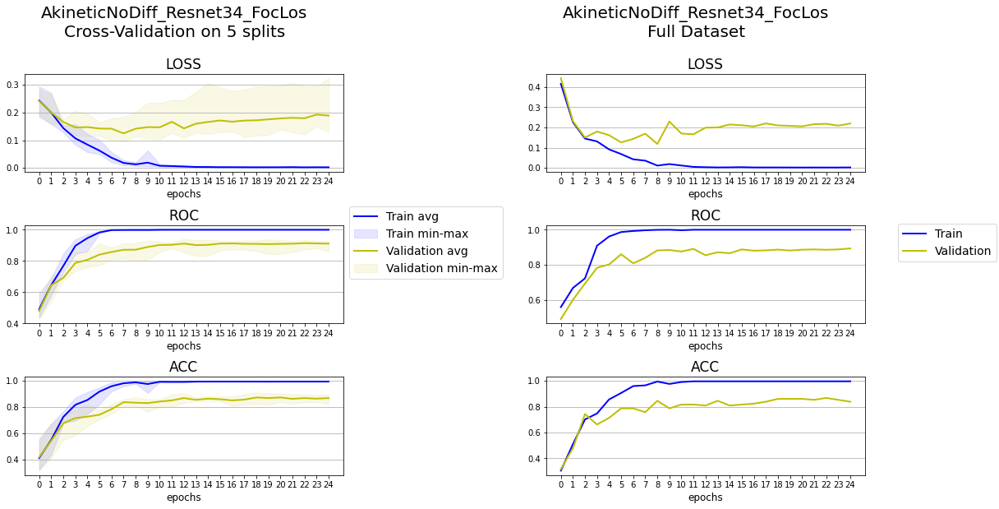

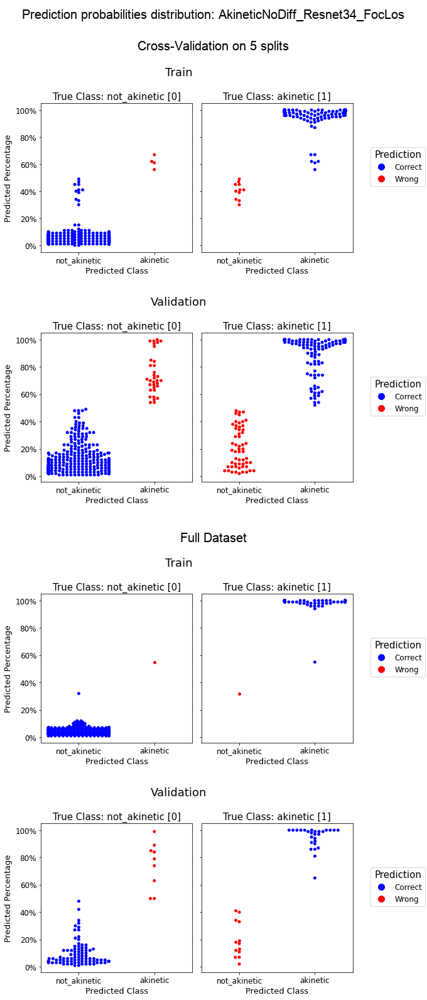



============================== FocLos - InvertClass:yes ==============================


Executing a 5-fold cross validation

Train distribution for each split:


,,,train_1,train_2,train_3,train_4,train_5
label,meaning,source,,,,,
0,not_akinetic,Sacco,383,383,383,384,383
1,akinetic,Sacco,159,159,159,159,160



Validation distribution for each split:


,,,valid_1,valid_2,valid_3,valid_4,valid_5
label,meaning,source,,,,,
0,not_akinetic,Sacco,96,96,96,95,96
1,akinetic,Sacco,40,40,40,40,39



=== Split #1 ===

Trainer started with classifier: Resnet34
dataset: <datasets.ecoSaccoDataset.ecoSaccoDataset object at 0x7fd323b50880>
batch size: 32
Train set: 542
Validation set: 136
Training with 17 mini-batches per epoch
Logging performance every 4 iter, smoothing every: 17 iter, saving checkpoints every 85 iter

* performance with model.train()
# performance with model.eval()
                    |         VALID        |        TRAIN         |         
 lr     iter  epoch | loss    roc    acc   | loss    roc    acc   |  time   
------------------------------------------------------------------------------
0.010000   17   1.0 | 0.163# 0.709  0.706  | 0.285* 0.517  0.507  |   6.70
                    |                      | 0.180# 0.651  0.710  |   6.70
0.010000   34   2.0 | 0.158# 0.707  0.574  | 0.232* 0.634  0.570  |  13.37
                    |                      | 0.159# 0.706  0.649  |  13.37
0.009000   51   3.0 | 0.211# 0.801  0.478  | 0.202* 0.724  0.637  |  20.03
     

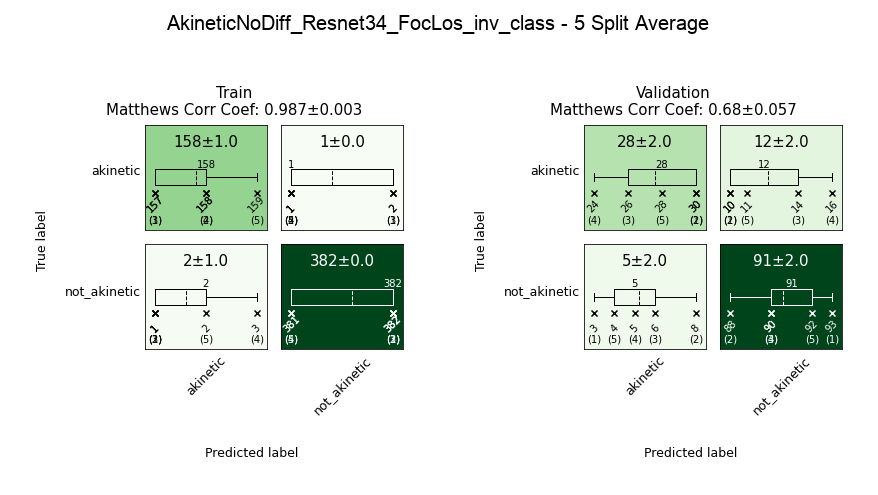



Average Performance:


,Valid_Loss_Avg,Valid_ROC_Avg,Valid_Acc_Avg,Train_Loss_Avg,Train_ROC_Avg,Train_Acc_Avg,train_akinetic_f1-score_Avg,valid_akinetic_f1-score_Avg,train_not_akinetic_f1-score_Avg,valid_not_akinetic_f1-score_Avg,train_MCC_Avg,valid_MCC_Avg
0,0.179 ± 0.042,0.917 ± 0.023,0.872 ± 0.022,0.003 ± 0.001,1.0 ± 0.0,0.994 ± 0.001,0.991 ± 0.002,0.76 ± 0.045,0.996 ± 0.001,0.912 ± 0.015,0.987 ± 0.003,0.68 ± 0.057





=== Full Dataset ===


Distribution for full dataset:


,,,train,validation
label,meaning,source,,
0,not_akinetic,Sacco,383,96
1,akinetic,Sacco,159,40


Trainer started with classifier: Resnet34
dataset: <datasets.ecoSaccoDataset.ecoSaccoDataset object at 0x7fd3234e4a30>
batch size: 32
Train set: 542
Validation set: 136
Training with 17 mini-batches per epoch
Logging performance every 4 iter, smoothing every: 17 iter, saving checkpoints every 85 iter
SGD (
Parameter Group 0
    dampening: 0
    initial_lr: 0.01
    lr: 0.01
    momentum: 0.9
    nesterov: False
    weight_decay: 0.0001
)'
<torch.optim.lr_scheduler.StepLR object at 0x7fd36c181c10>'
FocalLoss()'
[Accuracy(), <function roc_auc_score at 0x7fd387862790>]'

* performance with model.train()
# performance with model.eval()
                    |         VALID        |        TRAIN         |         
 lr     iter  epoch | loss    roc    acc   | loss    roc    acc   |  time   
------------------------------------------------------------------------------
0.010000   17   1.0 | 0.167# 0.555  0.632  | 0.279* 0.540  0.517  |   6.72
                    |                      | 0.169# 

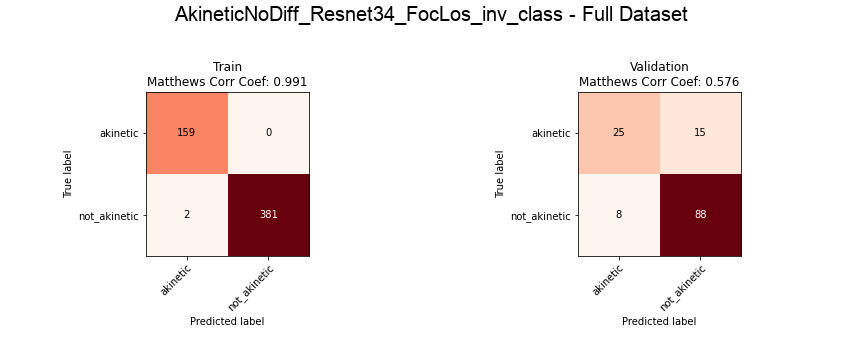

Train                         Validation                  \
             precision recall f1-score support  precision recall f1-score   
akinetic          0.99      1     0.99     159       0.76   0.62     0.68   
not_akinetic         1   0.99     1.00     383       0.85   0.92     0.88   
accuracy                          1.00     542                       0.83   
macro avg         0.99      1     1.00     542       0.81   0.77     0.78   
weighted avg         1      1     1.00     542       0.83   0.83     0.83   

                      
             support  
akinetic          40  
not_akinetic      96  
accuracy         136  
macro avg        136  
weighted avg     136

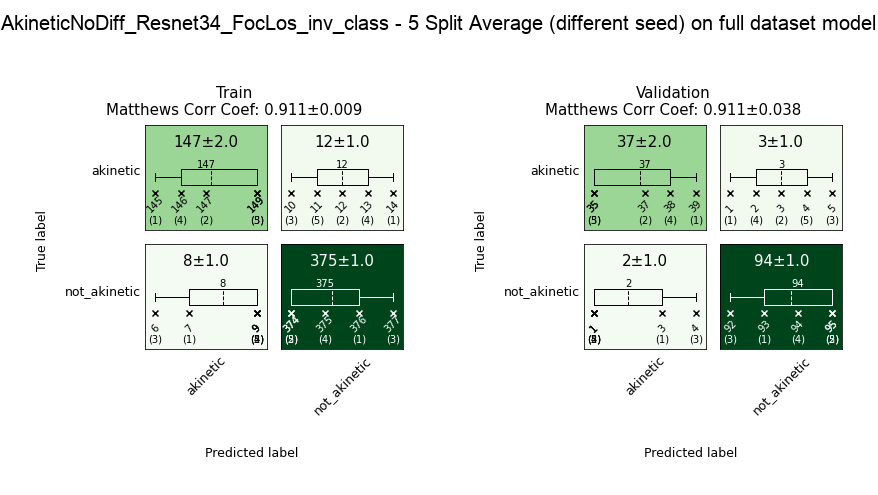


Performance summary:


,valid_loss,valid_roc,valid_acc,train_loss,train_roc,train_acc,train_akinetic_f1-score,valid_akinetic_f1-score,train_not_akinetic_f1-score,valid_not_akinetic_f1-score,train_mcc,valid_mcc
Set,,,,,,,,,,,,
Cross-Validation,0.179 ± 0.042,0.917 ± 0.023,0.872 ± 0.022,0.003 ± 0.001,1.0 ± 0.0,0.994 ± 0.001,0.991 ± 0.002,0.76 ± 0.045,0.996 ± 0.001,0.912 ± 0.015,0.987 ± 0.003,0.68 ± 0.057
Full,0.308,0.836,0.831,0.001,1.0,0.996,0.936 ± 0.007,0.936 ± 0.027,0.974 ± 0.003,0.974 ± 0.011,0.911 ± 0.009,0.911 ± 0.038


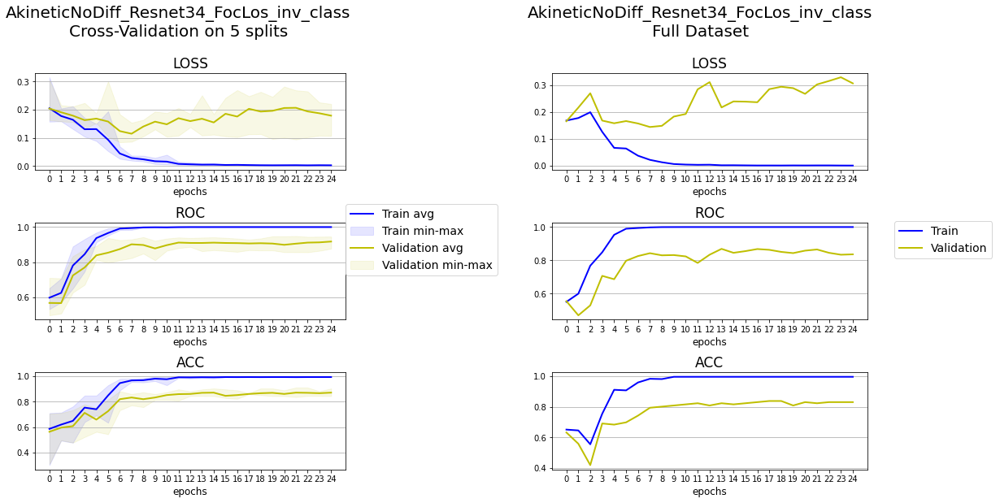

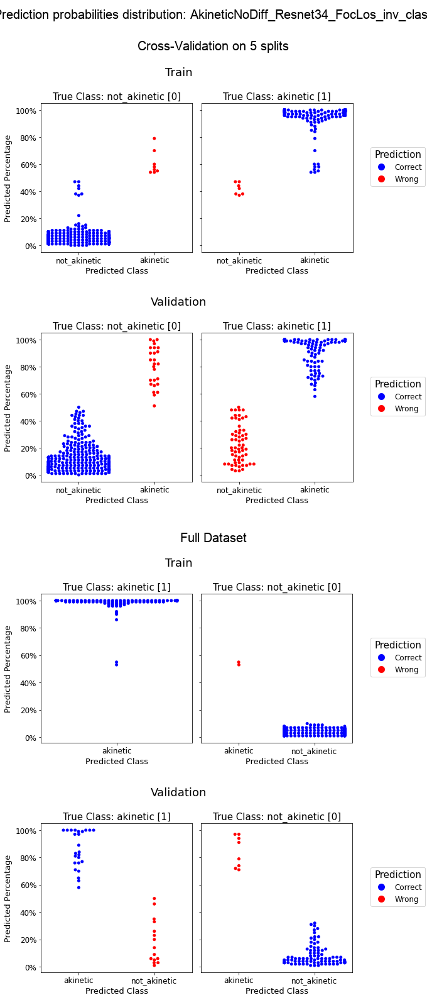




Final Log:


,session_ID,valid_loss,valid_roc,valid_acc,train_loss,train_roc,train_acc,train_akinetic_f1-score,valid_akinetic_f1-score,train_not_akinetic_f1-score,valid_not_akinetic_f1-score,train_mcc,valid_mcc,loss,inverted_class,model_ID
Cross-Validation,AkineticNoDiff_Resnet34_BCE,0.511 ± 0.113,0.916 ± 0.021,0.881 ± 0.027,0.01 ± 0.001,1.0 ± 0.0,0.994 ± 0.002,0.99 ± 0.003,0.777 ± 0.056,0.996 ± 0.001,0.918 ± 0.018,0.986 ± 0.004,0.703 ± 0.069,BCE,no,Resnet34
Full,AkineticNoDiff_Resnet34_BCE,0.591,0.908,0.846,0.006,1.0,0.996,0.94 ± 0.009,0.939 ± 0.035,0.976 ± 0.003,0.976 ± 0.013,0.918 ± 0.012,0.918 ± 0.046,BCE,no,Resnet34
Cross-Validation,AkineticNoDiff_Resnet34_BCE_inv_class,0.513 ± 0.075,0.925 ± 0.013,0.878 ± 0.012,0.009 ± 0.002,1.0 ± 0.0,0.994 ± 0.001,0.991 ± 0.002,0.778 ± 0.025,0.996 ± 0.001,0.915 ± 0.009,0.987 ± 0.003,0.7 ± 0.03,BCE,yes,Resnet34
Full,AkineticNoDiff_Resnet34_BCE_inv_class,0.621,0.931,0.868,0.006,1.0,0.996,0.949 ± 0.004,0.949 ± 0.016,0.979 ± 0.002,0.979 ± 0.007,0.928 ± 0.006,0.929 ± 0.022,BCE,yes,Resnet34
Cross-Validation,AkineticNoDiff_Resnet34_FocLos,0.189 ± 0.071,0.911 ± 0.024,0.869 ± 0.026,0.003 ± 0.001,1.0 ± 0.0,0.994 ± 0.001,0.991 ± 0.002,0.76 ± 0.06,0.996 ± 0.001,0.91 ± 0.016,0.987 ± 0.003,0.675 ± 0.069,FocLos,no,Resnet34
Full,AkineticNoDiff_Resnet34_FocLos,0.219,0.894,0.838,0.002,1.0,0.996,0.939 ± 0.004,0.939 ± 0.015,0.975 ± 0.002,0.975 ± 0.006,0.914 ± 0.005,0.915 ± 0.021,FocLos,no,Resnet34
Cross-Validation,AkineticNoDiff_Resnet34_FocLos_inv_class,0.179 ± 0.042,0.917 ± 0.023,0.872 ± 0.022,0.003 ± 0.001,1.0 ± 0.0,0.994 ± 0.001,0.991 ± 0.002,0.76 ± 0.045,0.996 ± 0.001,0.912 ± 0.015,0.987 ± 0.003,0.68 ± 0.057,FocLos,yes,Resnet34
Full,AkineticNoDiff_Resnet34_FocLos_inv_class,0.308,0.836,0.831,0.001,1.0,0.996,0.936 ± 0.007,0.936 ± 0.027,0.974 ± 0.003,0.974 ± 0.011,0.911 ± 0.009,0.911 ± 0.038,FocLos,yes,Resnet34



Total elapsed time: 1:15:03


In [11]:
# cross-validate and train model on full set - hyperparameter tuning for loss_set and invert_class_set

trainer_ID = 'AkineticNoDiff'
base_classifier_ID = Resnet34(num_channels=dataset.total_frames)
dataset = dataset
batch_size = 32

cvu.tune_with_CV(trainer_ID = trainer_ID,
                 dataset = dataset,
                 base_classifier_ID = base_classifier_ID,
                 batch_size = batch_size,
                 n_splits = 5,
                 max_epochs_split = 25,
                 max_epochs_full = 25,
                 stratify_lab = dataset.labels,
                 loss_set = ['BCE', 'FocLos'],
                 invert_class_set = True,
                 measure_to_plot = ['loss', 'roc', 'acc'],
                 metrics = [Accuracy(), roc_auc_score],
                 show_info=False, show_log=2, show_perf_plot=True,
                 save_split_checkpoint=False, save_split_final=True,
                 save_full_checkpoint=False, save_full_final=True,
                 reload_split=False, reload_full=False)

# reload final performance log
final_log=pd.read_csv(os.path.join('results', trainer_ID, trainer_ID+'_final_performance.csv'), sep=';', index_col=0)

/home/alessandro/.conda/envs/defeatcovid19/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Evaluating heatmap:

 -- Gradient aggregation: mean
 -- Soft activation is applied to <class 'torch.nn.modules.activation.ReLU'> , replaced with LeakyReLU(negative_slope=0.01, inplace=True)

Processing 7/7 batch - Total elapsed time: 0:00:44
Done




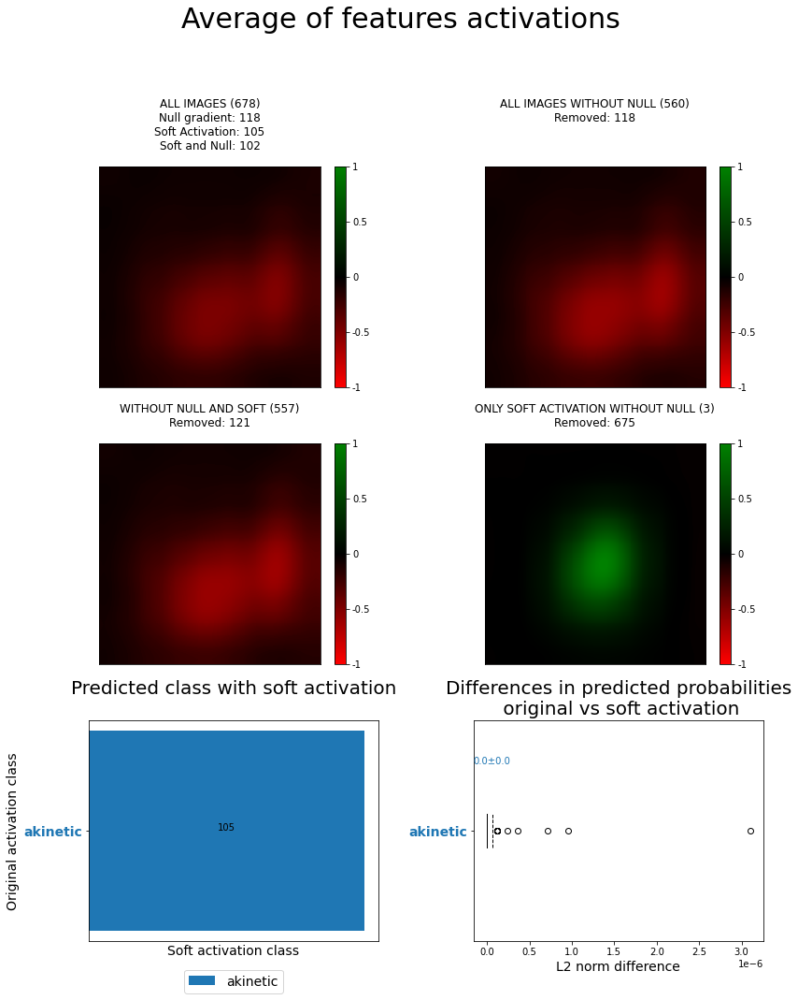

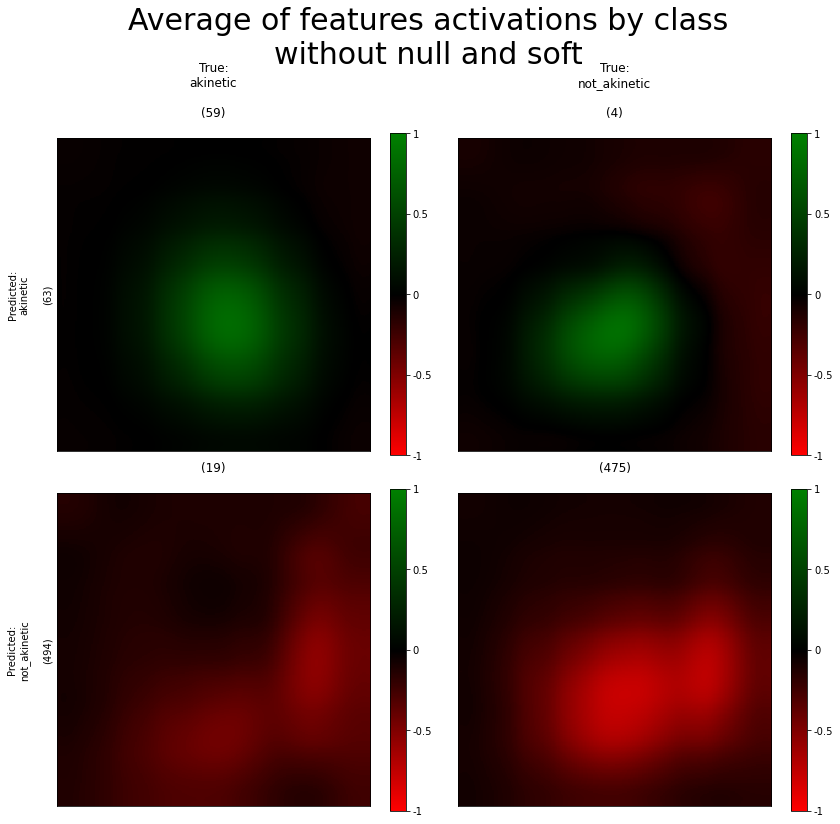

Data used for bar and box plot


,meaning,count,avg_L2_norm_diff,L2diff_list,akinetic,not_akinetic
0,akinetic,105,5.903698e-08,"[[0.0], [9.536743e-07], [0.0], [0.0], [0.0], [...",105.0,0.0


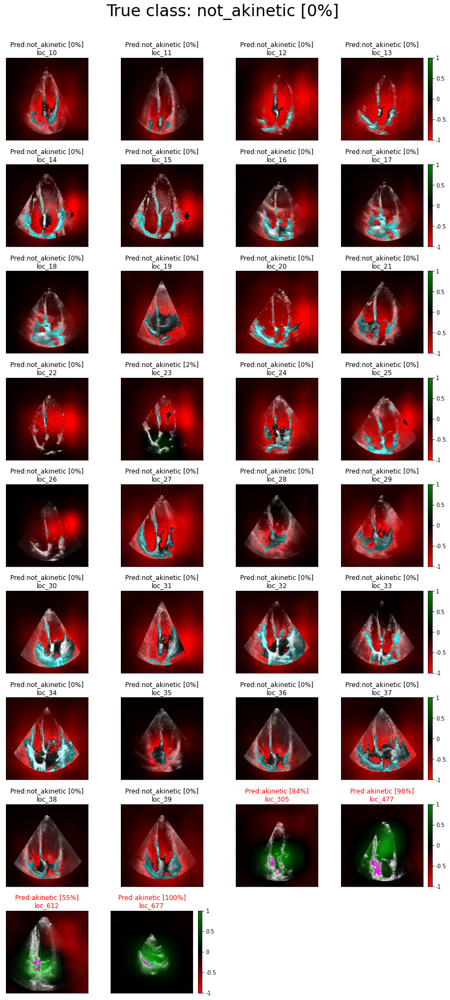

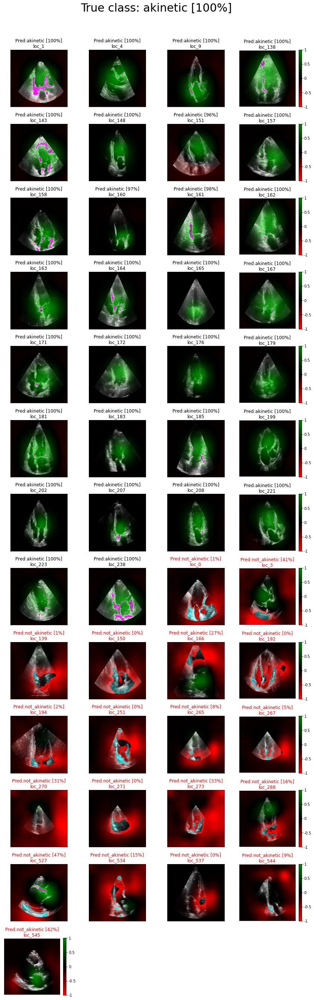

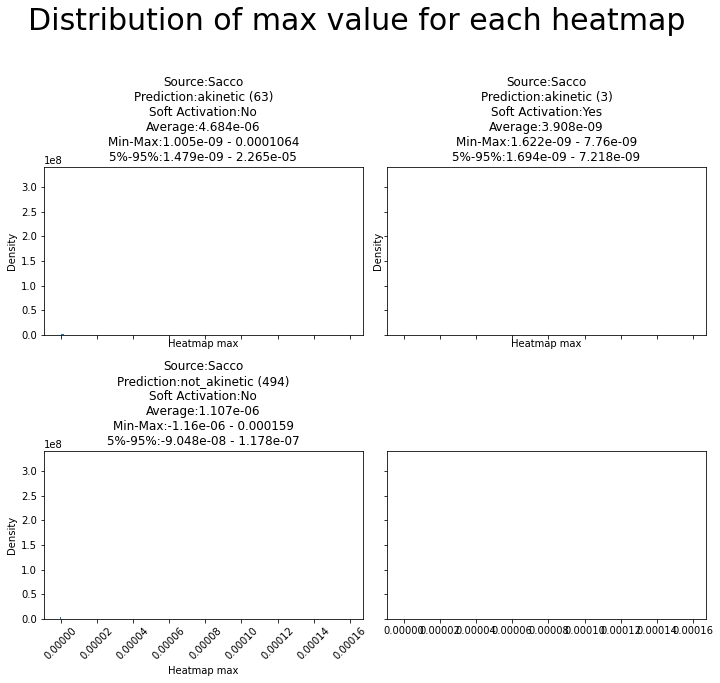

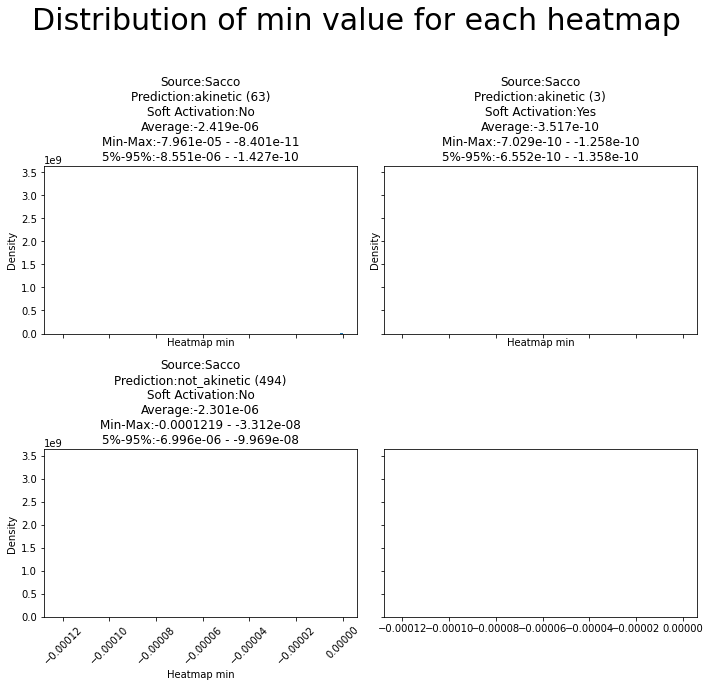

In [12]:
# evaluate features visualization

new_index = np.array(dataset.df.index)
model = Resnet34FeatVis(num_channels=dataset.total_frames)
reload_model_ID = 'AkineticNoDiff_Resnet34_BCE_full'
model_ID = 'AkineticNoDiff_Resnet34_BCE'
save_path = 'AkineticNoDiff'

fvu = FeaturesVisualizationUtils(save_path=save_path,
                                 model_ID=model_ID,
                                 image_size = size)
fvu.run_features_visualization(dataset=dataset,
                               new_index=new_index,
                               model=model,
                               reload_model_ID=reload_model_ID,
                               gradient_aggregation='mean',
                               apply_soft_activation=True,
                               nn_to_replace=nn.ReLU,
                               nn_replacement=nn.LeakyReLU(inplace=True),
                               frame_to_show=0,
                               heatmap_transformation='exponential')
fvu.plot_heatmap(fig_size = 12)
fvu.plot_sample_masked(fig_size = 12, max_sample_combination = 30, sample_ncol = 4)
fvu.plot_heatmap_max_distribution()

## Train model Covid Yes/No

In [5]:
input_name = 'eco_50_first_Nodiff_samplFirst_mask_256'
size = 256

dataset = ecoSaccoDataset(input_name, target_class='covid', size=size, show_info=True)

ecoSaccoDataset initialized with size=256, augment=None
Dataset is located in ./input/eco_50_first_Nodiff_samplFirst_mask_256

############    eco_50_first_Nodiff_samplFirst_mask_256 dataset    ############

Total files: 678
Total frames: 50


,image,label,meaning,source
0,./input/eco_50_first_Nodiff_samplFirst_mask_25...,0,not_covid,Sacco
1,./input/eco_50_first_Nodiff_samplFirst_mask_25...,0,not_covid,Sacco
2,./input/eco_50_first_Nodiff_samplFirst_mask_25...,0,not_covid,Sacco
3,./input/eco_50_first_Nodiff_samplFirst_mask_25...,0,not_covid,Sacco
4,./input/eco_50_first_Nodiff_samplFirst_mask_25...,0,not_covid,Sacco
...,...,...,...,...
673,./input/eco_50_first_Nodiff_samplFirst_mask_25...,1,covid,Sacco
674,./input/eco_50_first_Nodiff_samplFirst_mask_25...,1,covid,Sacco
675,./input/eco_50_first_Nodiff_samplFirst_mask_25...,1,covid,Sacco
676,./input/eco_50_first_Nodiff_samplFirst_mask_25...,1,covid,Sacco


,,,count
label,meaning,source,
0,not_covid,Sacco,528
1,covid,Sacco,150


/home/alessandro/.conda/envs/defeatcovid19/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)



Used raw classifier: Resnet34

Start hyperparameter tuning


============================== BCE - InvertClass:no ==============================


Executing a 5-fold cross validation

Train distribution for each split:


,,,train_1,train_2,train_3,train_4,train_5
label,meaning,source,,,,,
0,not_covid,Sacco,422,422,422,423,423
1,covid,Sacco,120,120,120,120,120



Validation distribution for each split:


,,,valid_1,valid_2,valid_3,valid_4,valid_5
label,meaning,source,,,,,
0,not_covid,Sacco,106,106,106,105,105
1,covid,Sacco,30,30,30,30,30



=== Split #1 ===

Trainer started with classifier: Resnet34
dataset: <datasets.ecoSaccoDataset.ecoSaccoDataset object at 0x7fd3226bad60>
batch size: 32
Train set: 542
Validation set: 136
Training with 17 mini-batches per epoch
Logging performance every 4 iter, smoothing every: 17 iter, saving checkpoints every 85 iter

* performance with model.train()
# performance with model.eval()
                    |         VALID        |        TRAIN         |         
 lr     iter  epoch | loss    roc    acc   | loss    roc    acc   |  time   
------------------------------------------------------------------------------
0.010000   17   1.0 | 0.566# 0.443  0.779  | 0.692* 0.627  0.587  |   6.65
                    |                      | 0.587# 0.359  0.769  |   6.65
0.010000   34   2.0 | 0.615# 0.750  0.684  | 0.541* 0.855  0.723  |  13.31
                    |                      | 0.576# 0.806  0.736  |  13.31
0.009000   51   3.0 | 0.628# 0.887  0.669  | 0.384* 0.939  0.878  |  20.05
     

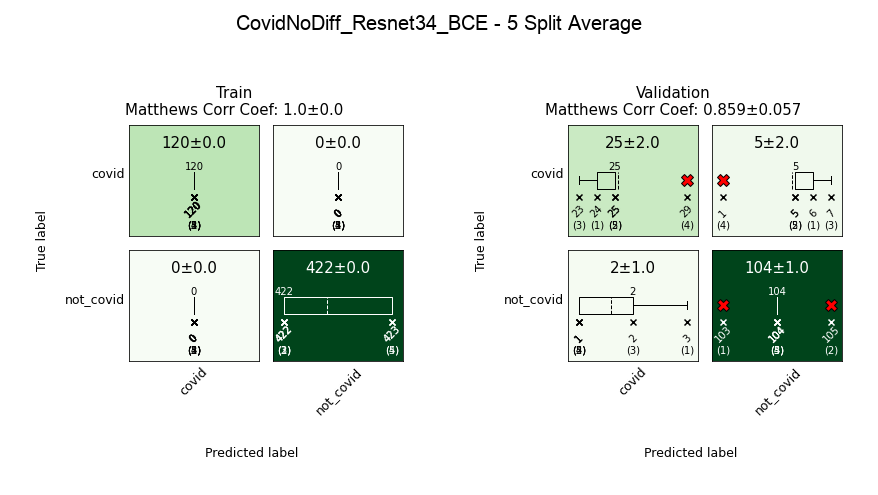



Average Performance:


,Valid_Loss_Avg,Valid_ROC_Avg,Valid_Acc_Avg,Train_Loss_Avg,Train_ROC_Avg,Train_Acc_Avg,train_covid_f1-score_Avg,valid_covid_f1-score_Avg,train_not_covid_f1-score_Avg,valid_not_covid_f1-score_Avg,train_MCC_Avg,valid_MCC_Avg
0,0.198 ± 0.126,0.972 ± 0.029,0.953 ± 0.019,0.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,0.886 ± 0.047,1.0 ± 0.0,0.97 ± 0.012,1.0 ± 0.0,0.859 ± 0.057





=== Full Dataset ===


Distribution for full dataset:


,,,train,validation
label,meaning,source,,
0,not_covid,Sacco,422,106
1,covid,Sacco,120,30


Trainer started with classifier: Resnet34
dataset: <datasets.ecoSaccoDataset.ecoSaccoDataset object at 0x7fd3643ecc10>
batch size: 32
Train set: 542
Validation set: 136
Training with 17 mini-batches per epoch
Logging performance every 4 iter, smoothing every: 17 iter, saving checkpoints every 85 iter
SGD (
Parameter Group 0
    dampening: 0
    initial_lr: 0.01
    lr: 0.01
    momentum: 0.9
    nesterov: False
    weight_decay: 0.0001
)'
<torch.optim.lr_scheduler.StepLR object at 0x7fd3643ecf10>'
BCELoss()'
[Accuracy(), <function roc_auc_score at 0x7fd387862790>]'

* performance with model.train()
# performance with model.eval()
                    |         VALID        |        TRAIN         |         
 lr     iter  epoch | loss    roc    acc   | loss    roc    acc   |  time   
------------------------------------------------------------------------------
0.010000   17   1.0 | 0.616# 0.464  0.772  | 0.682* 0.644  0.614  |   6.77
                    |                      | 0.613# 0.

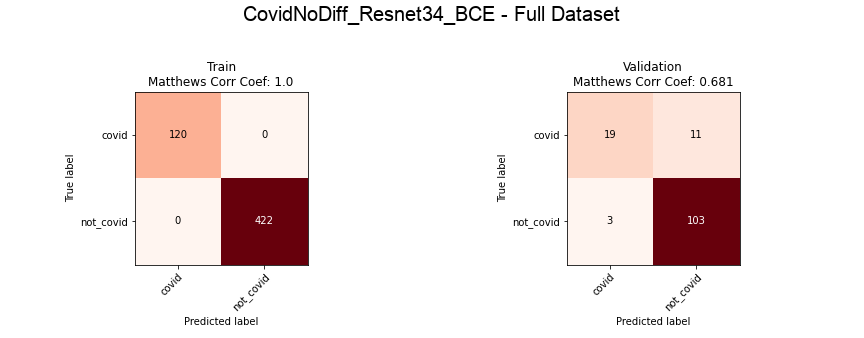

Train                         Validation                  \
             precision recall f1-score support  precision recall f1-score   
covid                1      1      1.0     120       0.86   0.63     0.73   
not_covid            1      1      1.0     422        0.9   0.97     0.94   
accuracy                           1.0     542                       0.90   
macro avg            1      1      1.0     542       0.88    0.8     0.83   
weighted avg         1      1      1.0     542       0.89    0.9     0.89   

                      
             support  
covid             30  
not_covid        106  
accuracy         136  
macro avg        136  
weighted avg     136

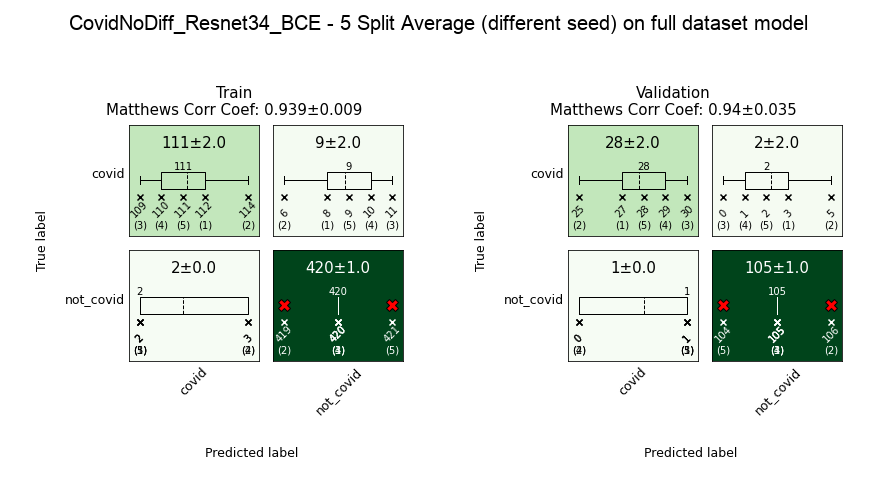


Performance summary:


,valid_loss,valid_roc,valid_acc,train_loss,train_roc,train_acc,train_covid_f1-score,valid_covid_f1-score,train_not_covid_f1-score,valid_not_covid_f1-score,train_mcc,valid_mcc
Set,,,,,,,,,,,,
Cross-Validation,0.198 ± 0.126,0.972 ± 0.029,0.953 ± 0.019,0.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,0.886 ± 0.047,1.0 ± 0.0,0.97 ± 0.012,1.0 ± 0.0,0.859 ± 0.057
Full,0.521,0.892,0.897,0.0,1.0,1.0,0.952 ± 0.007,0.951 ± 0.029,0.987 ± 0.002,0.987 ± 0.007,0.939 ± 0.009,0.94 ± 0.035


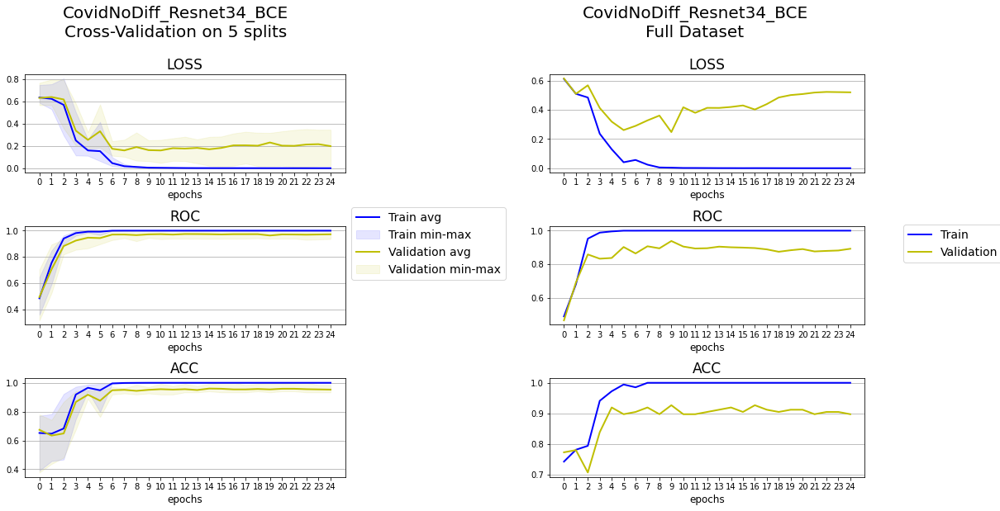

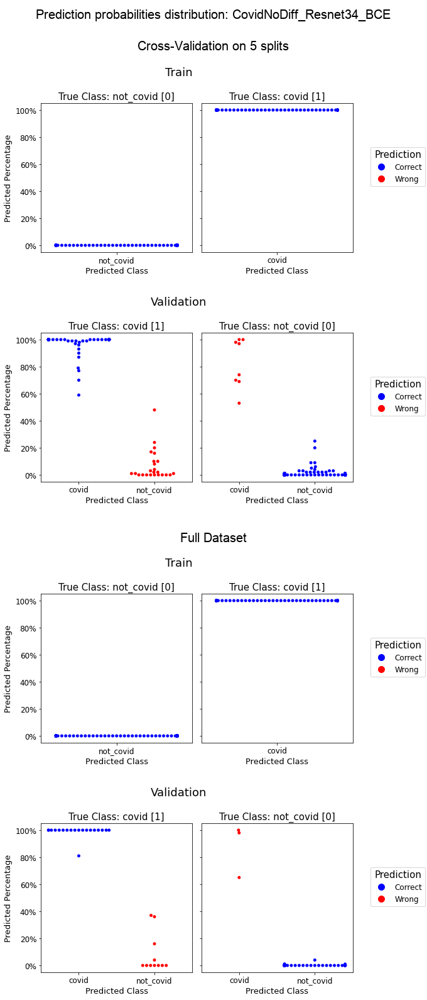



============================== BCE - InvertClass:yes ==============================


Executing a 5-fold cross validation

Train distribution for each split:


,,,train_1,train_2,train_3,train_4,train_5
label,meaning,source,,,,,
0,not_covid,Sacco,422,422,422,423,423
1,covid,Sacco,120,120,120,120,120



Validation distribution for each split:


,,,valid_1,valid_2,valid_3,valid_4,valid_5
label,meaning,source,,,,,
0,not_covid,Sacco,106,106,106,105,105
1,covid,Sacco,30,30,30,30,30



=== Split #1 ===

Trainer started with classifier: Resnet34
dataset: <datasets.ecoSaccoDataset.ecoSaccoDataset object at 0x7fd322170b20>
batch size: 32
Train set: 542
Validation set: 136
Training with 17 mini-batches per epoch
Logging performance every 4 iter, smoothing every: 17 iter, saving checkpoints every 85 iter

* performance with model.train()
# performance with model.eval()
                    |         VALID        |        TRAIN         |         
 lr     iter  epoch | loss    roc    acc   | loss    roc    acc   |  time   
------------------------------------------------------------------------------
0.010000   17   1.0 | 0.795# 0.622  0.338  | 0.758* 0.538  0.520  |   6.69
                    |                      | 0.791# 0.582  0.312  |   6.69
0.010000   34   2.0 | 0.753# 0.756  0.353  | 0.631* 0.761  0.633  |  13.37
                    |                      | 0.764# 0.635  0.349  |  13.37
0.009000   51   3.0 | 0.836# 0.853  0.485  | 0.489* 0.904  0.756  |  20.12
     

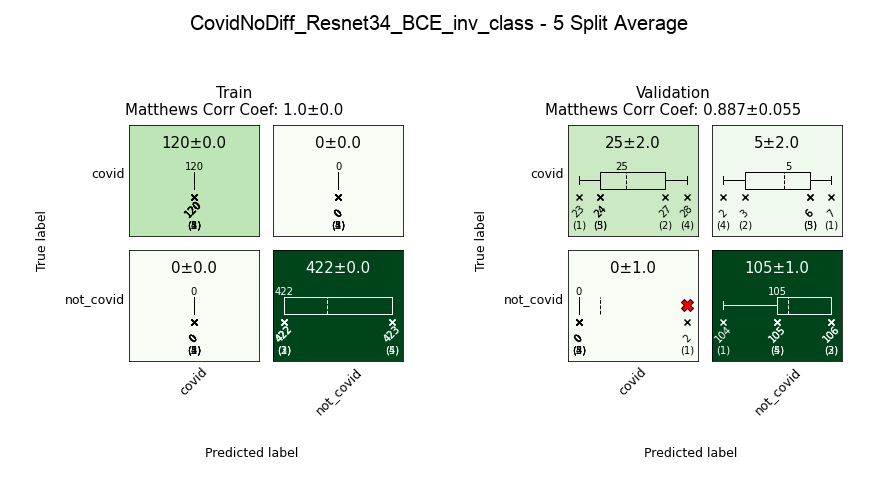



Average Performance:


,Valid_Loss_Avg,Valid_ROC_Avg,Valid_Acc_Avg,Train_Loss_Avg,Train_ROC_Avg,Train_Acc_Avg,train_covid_f1-score_Avg,valid_covid_f1-score_Avg,train_not_covid_f1-score_Avg,valid_not_covid_f1-score_Avg,train_MCC_Avg,valid_MCC_Avg
0,0.211 ± 0.099,0.961 ± 0.022,0.962 ± 0.018,0.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,0.905 ± 0.046,1.0 ± 0.0,0.976 ± 0.011,1.0 ± 0.0,0.887 ± 0.055





=== Full Dataset ===


Distribution for full dataset:


,,,train,validation
label,meaning,source,,
0,not_covid,Sacco,422,106
1,covid,Sacco,120,30


Trainer started with classifier: Resnet34
dataset: <datasets.ecoSaccoDataset.ecoSaccoDataset object at 0x7fd36c316670>
batch size: 32
Train set: 542
Validation set: 136
Training with 17 mini-batches per epoch
Logging performance every 4 iter, smoothing every: 17 iter, saving checkpoints every 85 iter
SGD (
Parameter Group 0
    dampening: 0
    initial_lr: 0.01
    lr: 0.01
    momentum: 0.9
    nesterov: False
    weight_decay: 0.0001
)'
<torch.optim.lr_scheduler.StepLR object at 0x7fd36407de50>'
BCELoss()'
[Accuracy(), <function roc_auc_score at 0x7fd387862790>]'

* performance with model.train()
# performance with model.eval()
                    |         VALID        |        TRAIN         |         
 lr     iter  epoch | loss    roc    acc   | loss    roc    acc   |  time   
------------------------------------------------------------------------------
0.010000   17   1.0 | 1.323# 0.521  0.221  | 0.763* 0.538  0.518  |   6.66
                    |                      | 1.295# 0.

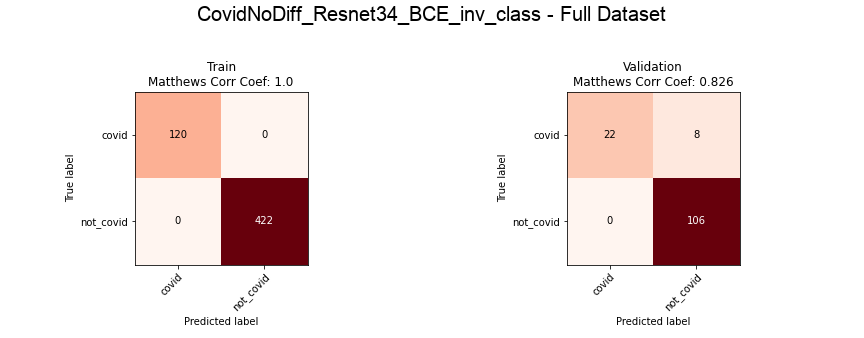

Train                         Validation                  \
             precision recall f1-score support  precision recall f1-score   
covid                1      1      1.0     120          1   0.73     0.85   
not_covid            1      1      1.0     422       0.93      1     0.96   
accuracy                           1.0     542                       0.94   
macro avg            1      1      1.0     542       0.96   0.87     0.90   
weighted avg         1      1      1.0     542       0.95   0.94     0.94   

                      
             support  
covid             30  
not_covid        106  
accuracy         136  
macro avg        136  
weighted avg     136

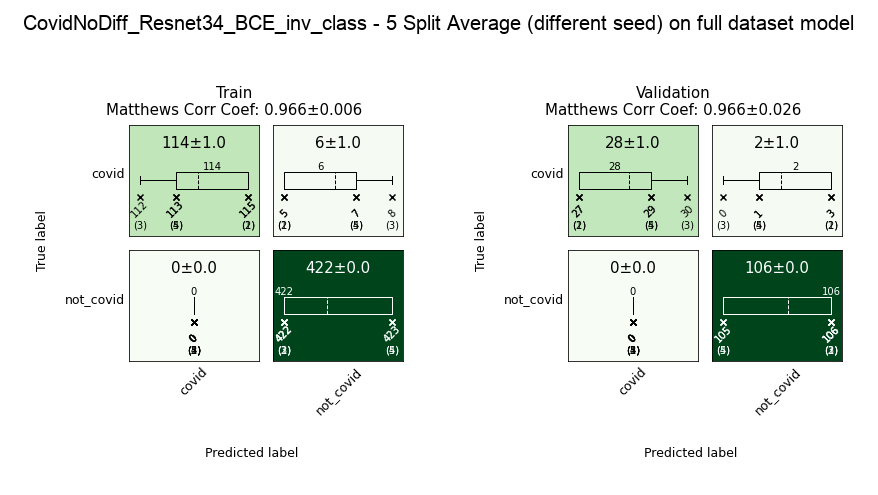


Performance summary:


,valid_loss,valid_roc,valid_acc,train_loss,train_roc,train_acc,train_covid_f1-score,valid_covid_f1-score,train_not_covid_f1-score,valid_not_covid_f1-score,train_mcc,valid_mcc
Set,,,,,,,,,,,,
Cross-Validation,0.211 ± 0.099,0.961 ± 0.022,0.962 ± 0.018,0.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,0.905 ± 0.046,1.0 ± 0.0,0.976 ± 0.011,1.0 ± 0.0,0.887 ± 0.055
Full,0.305,0.945,0.941,0.0,1.0,1.0,0.973 ± 0.005,0.972 ± 0.021,0.992 ± 0.001,0.993 ± 0.006,0.966 ± 0.006,0.966 ± 0.026


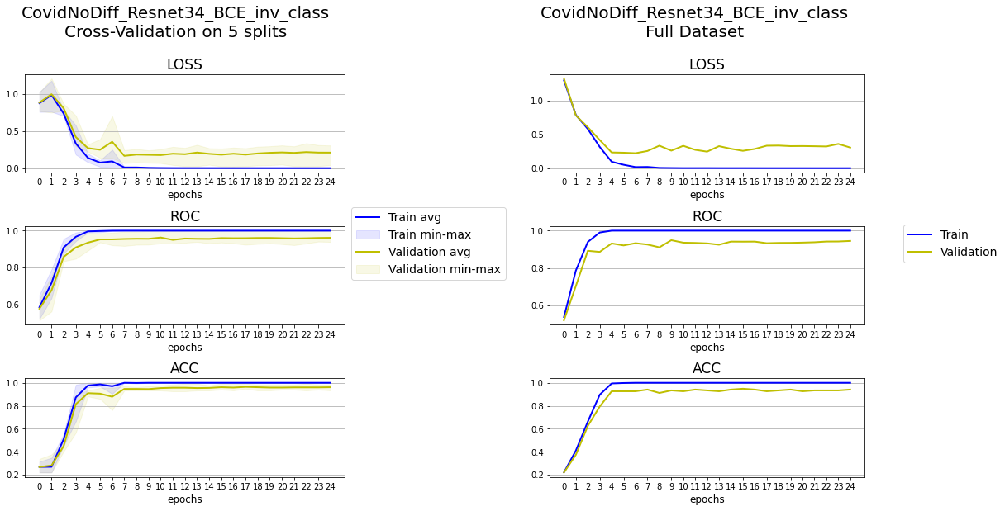

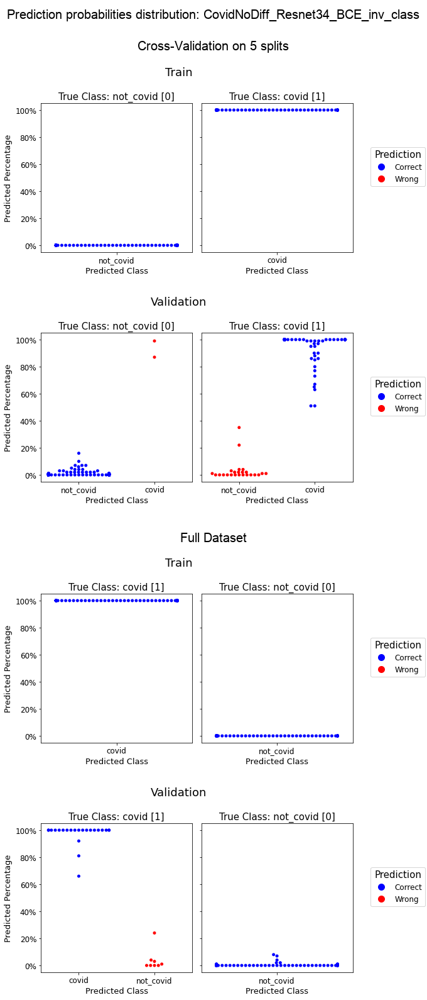



============================== FocLos - InvertClass:no ==============================


Executing a 5-fold cross validation

Train distribution for each split:


,,,train_1,train_2,train_3,train_4,train_5
label,meaning,source,,,,,
0,not_covid,Sacco,422,422,422,423,423
1,covid,Sacco,120,120,120,120,120



Validation distribution for each split:


,,,valid_1,valid_2,valid_3,valid_4,valid_5
label,meaning,source,,,,,
0,not_covid,Sacco,106,106,106,105,105
1,covid,Sacco,30,30,30,30,30



=== Split #1 ===

Trainer started with classifier: Resnet34
dataset: <datasets.ecoSaccoDataset.ecoSaccoDataset object at 0x7fd3226bacd0>
batch size: 32
Train set: 542
Validation set: 136
Training with 17 mini-batches per epoch
Logging performance every 4 iter, smoothing every: 17 iter, saving checkpoints every 85 iter

* performance with model.train()
# performance with model.eval()
                    |         VALID        |        TRAIN         |         
 lr     iter  epoch | loss    roc    acc   | loss    roc    acc   |  time   
------------------------------------------------------------------------------
0.010000   17   1.0 | 0.234# 0.397  0.316  | 0.223* 0.637  0.577  |   6.61
                    |                      | 0.230# 0.469  0.410  |   6.61
0.010000   34   2.0 | 0.419# 0.561  0.287  | 0.185* 0.794  0.677  |  13.24
                    |                      | 0.386# 0.631  0.247  |  13.24
0.009000   51   3.0 | 0.162# 0.869  0.640  | 0.131* 0.867  0.755  |  19.86
     

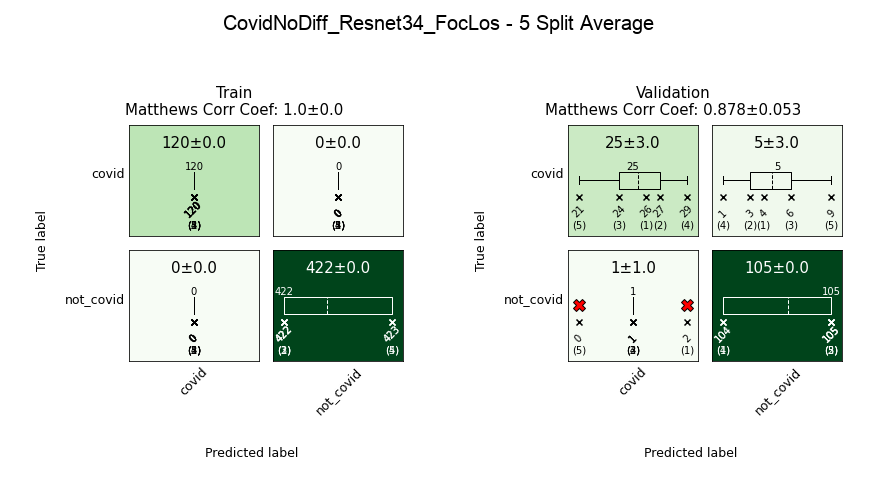



Average Performance:


,Valid_Loss_Avg,Valid_ROC_Avg,Valid_Acc_Avg,Train_Loss_Avg,Train_ROC_Avg,Train_Acc_Avg,train_covid_f1-score_Avg,valid_covid_f1-score_Avg,train_not_covid_f1-score_Avg,valid_not_covid_f1-score_Avg,train_MCC_Avg,valid_MCC_Avg
0,0.064 ± 0.033,0.967 ± 0.027,0.959 ± 0.018,0.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,0.898 ± 0.049,1.0 ± 0.0,0.974 ± 0.011,1.0 ± 0.0,0.878 ± 0.053





=== Full Dataset ===


Distribution for full dataset:


,,,train,validation
label,meaning,source,,
0,not_covid,Sacco,422,106
1,covid,Sacco,120,30


Trainer started with classifier: Resnet34
dataset: <datasets.ecoSaccoDataset.ecoSaccoDataset object at 0x7fd36c083be0>
batch size: 32
Train set: 542
Validation set: 136
Training with 17 mini-batches per epoch
Logging performance every 4 iter, smoothing every: 17 iter, saving checkpoints every 85 iter
SGD (
Parameter Group 0
    dampening: 0
    initial_lr: 0.01
    lr: 0.01
    momentum: 0.9
    nesterov: False
    weight_decay: 0.0001
)'
<torch.optim.lr_scheduler.StepLR object at 0x7fd36c083d90>'
FocalLoss()'
[Accuracy(), <function roc_auc_score at 0x7fd387862790>]'

* performance with model.train()
# performance with model.eval()
                    |         VALID        |        TRAIN         |         
 lr     iter  epoch | loss    roc    acc   | loss    roc    acc   |  time   
------------------------------------------------------------------------------
0.010000   17   1.0 | 0.154# 0.550  0.721  | 0.241* 0.589  0.539  |   6.62
                    |                      | 0.151# 

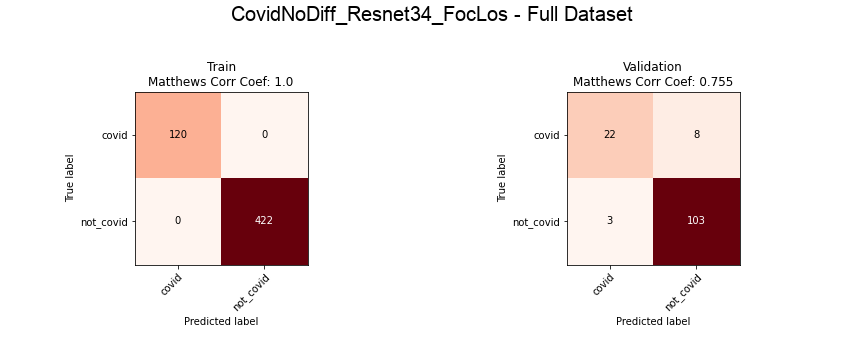

Train                         Validation                  \
             precision recall f1-score support  precision recall f1-score   
covid                1      1      1.0     120       0.88   0.73     0.80   
not_covid            1      1      1.0     422       0.93   0.97     0.95   
accuracy                           1.0     542                       0.92   
macro avg            1      1      1.0     542        0.9   0.85     0.87   
weighted avg         1      1      1.0     542       0.92   0.92     0.92   

                      
             support  
covid             30  
not_covid        106  
accuracy         136  
macro avg        136  
weighted avg     136

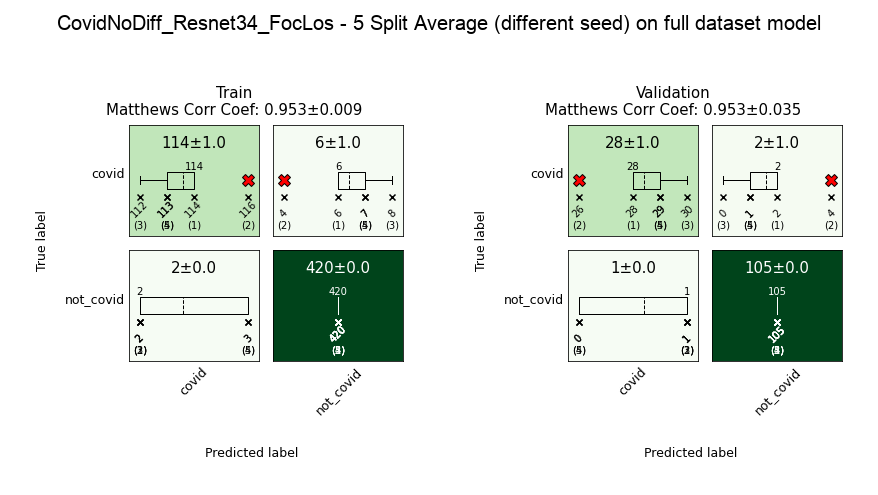


Performance summary:


,valid_loss,valid_roc,valid_acc,train_loss,train_roc,train_acc,train_covid_f1-score,valid_covid_f1-score,train_not_covid_f1-score,valid_not_covid_f1-score,train_mcc,valid_mcc
Set,,,,,,,,,,,,
Cross-Validation,0.064 ± 0.033,0.967 ± 0.027,0.959 ± 0.018,0.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,0.898 ± 0.049,1.0 ± 0.0,0.974 ± 0.011,1.0 ± 0.0,0.878 ± 0.053
Full,0.158,0.921,0.919,0.0,1.0,1.0,0.963 ± 0.007,0.962 ± 0.028,0.99 ± 0.002,0.99 ± 0.007,0.953 ± 0.009,0.953 ± 0.035


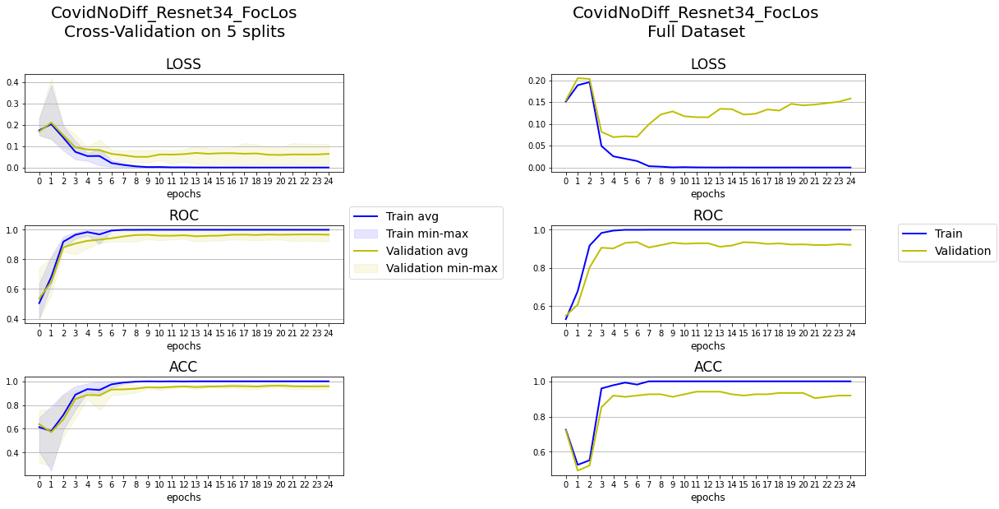

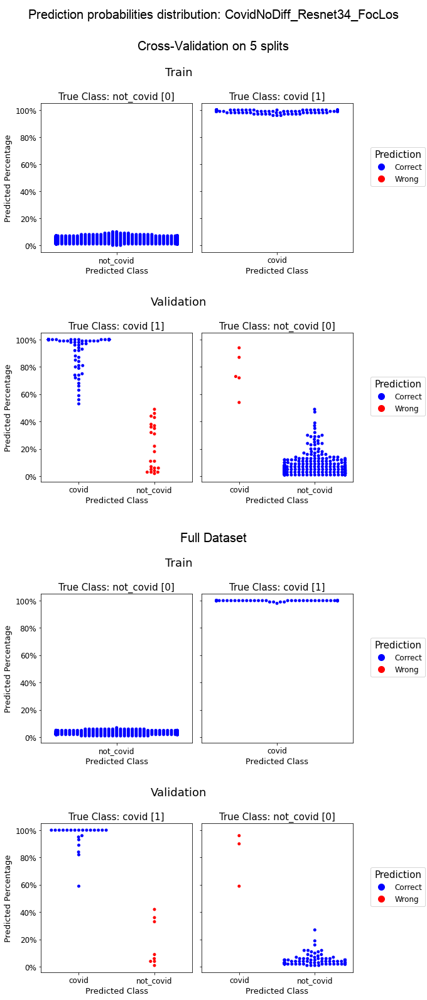



============================== FocLos - InvertClass:yes ==============================


Executing a 5-fold cross validation

Train distribution for each split:


,,,train_1,train_2,train_3,train_4,train_5
label,meaning,source,,,,,
0,not_covid,Sacco,422,422,422,423,423
1,covid,Sacco,120,120,120,120,120



Validation distribution for each split:


,,,valid_1,valid_2,valid_3,valid_4,valid_5
label,meaning,source,,,,,
0,not_covid,Sacco,106,106,106,105,105
1,covid,Sacco,30,30,30,30,30



=== Split #1 ===

Trainer started with classifier: Resnet34
dataset: <datasets.ecoSaccoDataset.ecoSaccoDataset object at 0x7fd36de3b640>
batch size: 32
Train set: 542
Validation set: 136
Training with 17 mini-batches per epoch
Logging performance every 4 iter, smoothing every: 17 iter, saving checkpoints every 85 iter

* performance with model.train()
# performance with model.eval()
                    |         VALID        |        TRAIN         |         
 lr     iter  epoch | loss    roc    acc   | loss    roc    acc   |  time   
------------------------------------------------------------------------------
0.010000   17   1.0 | 0.700# 0.551  0.221  | 0.266* 0.581  0.546  |   6.69
                    |                      | 0.695# 0.503  0.221  |   6.69
0.010000   34   2.0 | 0.738# 0.779  0.221  | 0.193* 0.740  0.613  |  13.41
                    |                      | 0.761# 0.731  0.223  |  13.41
0.009000   51   3.0 | 0.261# 0.881  0.500  | 0.150* 0.878  0.696  |  20.10
     

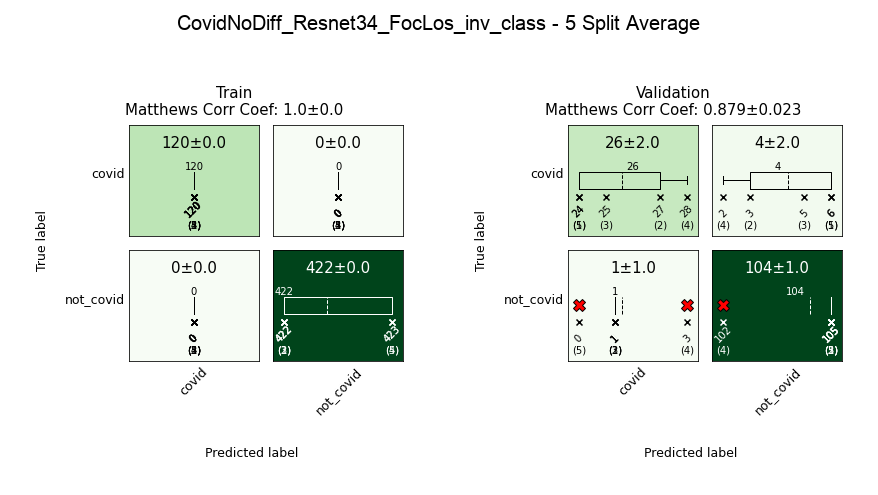



Average Performance:


,Valid_Loss_Avg,Valid_ROC_Avg,Valid_Acc_Avg,Train_Loss_Avg,Train_ROC_Avg,Train_Acc_Avg,train_covid_f1-score_Avg,valid_covid_f1-score_Avg,train_not_covid_f1-score_Avg,valid_not_covid_f1-score_Avg,train_MCC_Avg,valid_MCC_Avg
0,0.067 ± 0.023,0.963 ± 0.021,0.959 ± 0.007,0.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,0.901 ± 0.021,1.0 ± 0.0,0.974 ± 0.005,1.0 ± 0.0,0.879 ± 0.023





=== Full Dataset ===


Distribution for full dataset:


,,,train,validation
label,meaning,source,,
0,not_covid,Sacco,422,106
1,covid,Sacco,120,30


Trainer started with classifier: Resnet34
dataset: <datasets.ecoSaccoDataset.ecoSaccoDataset object at 0x7fd3222f4c40>
batch size: 32
Train set: 542
Validation set: 136
Training with 17 mini-batches per epoch
Logging performance every 4 iter, smoothing every: 17 iter, saving checkpoints every 85 iter
SGD (
Parameter Group 0
    dampening: 0
    initial_lr: 0.01
    lr: 0.01
    momentum: 0.9
    nesterov: False
    weight_decay: 0.0001
)'
<torch.optim.lr_scheduler.StepLR object at 0x7fd3446fa5e0>'
FocalLoss()'
[Accuracy(), <function roc_auc_score at 0x7fd387862790>]'

* performance with model.train()
# performance with model.eval()
                    |         VALID        |        TRAIN         |         
 lr     iter  epoch | loss    roc    acc   | loss    roc    acc   |  time   
------------------------------------------------------------------------------
0.010000   17   1.0 | 0.380# 0.461  0.221  | 0.260* 0.557  0.524  |   6.64
                    |                      | 0.387# 

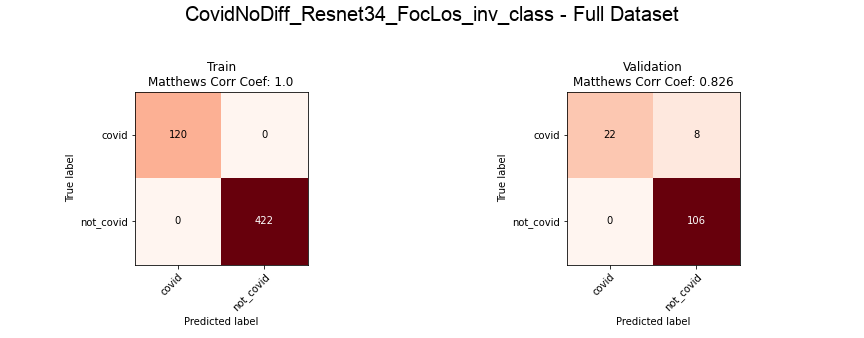

Train                         Validation                  \
             precision recall f1-score support  precision recall f1-score   
covid                1      1      1.0     120          1   0.73     0.85   
not_covid            1      1      1.0     422       0.93      1     0.96   
accuracy                           1.0     542                       0.94   
macro avg            1      1      1.0     542       0.96   0.87     0.90   
weighted avg         1      1      1.0     542       0.95   0.94     0.94   

                      
             support  
covid             30  
not_covid        106  
accuracy         136  
macro avg        136  
weighted avg     136

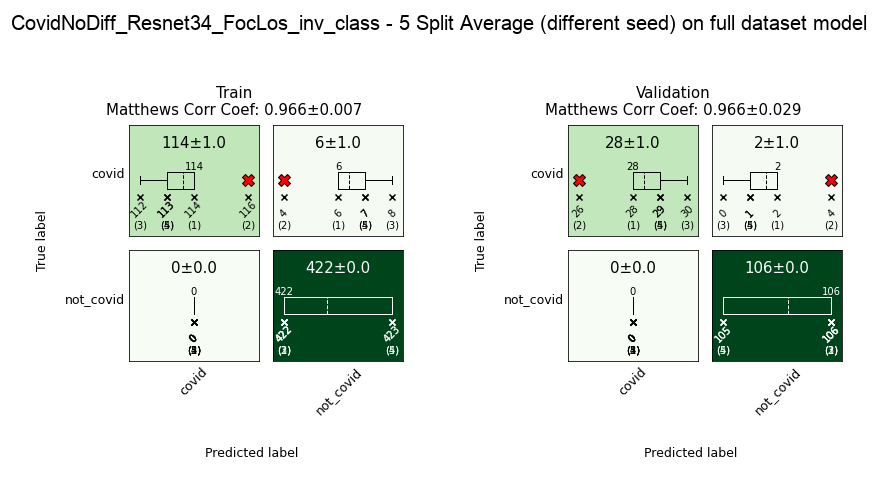


Performance summary:


,valid_loss,valid_roc,valid_acc,train_loss,train_roc,train_acc,train_covid_f1-score,valid_covid_f1-score,train_not_covid_f1-score,valid_not_covid_f1-score,train_mcc,valid_mcc
Set,,,,,,,,,,,,
Cross-Validation,0.067 ± 0.023,0.963 ± 0.021,0.959 ± 0.007,0.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,0.901 ± 0.021,1.0 ± 0.0,0.974 ± 0.005,1.0 ± 0.0,0.879 ± 0.023
Full,0.107,0.946,0.941,0.0,1.0,1.0,0.973 ± 0.006,0.972 ± 0.024,0.992 ± 0.002,0.993 ± 0.006,0.966 ± 0.007,0.966 ± 0.029


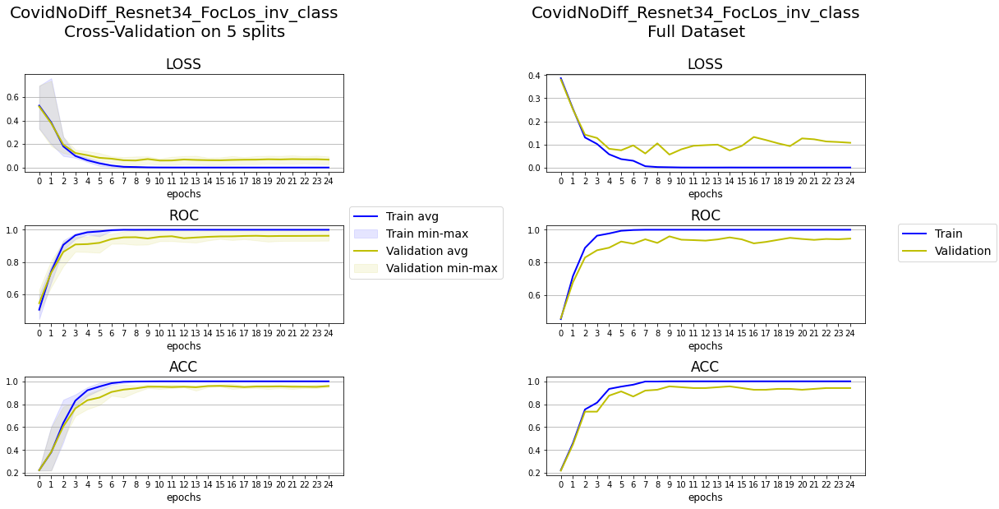

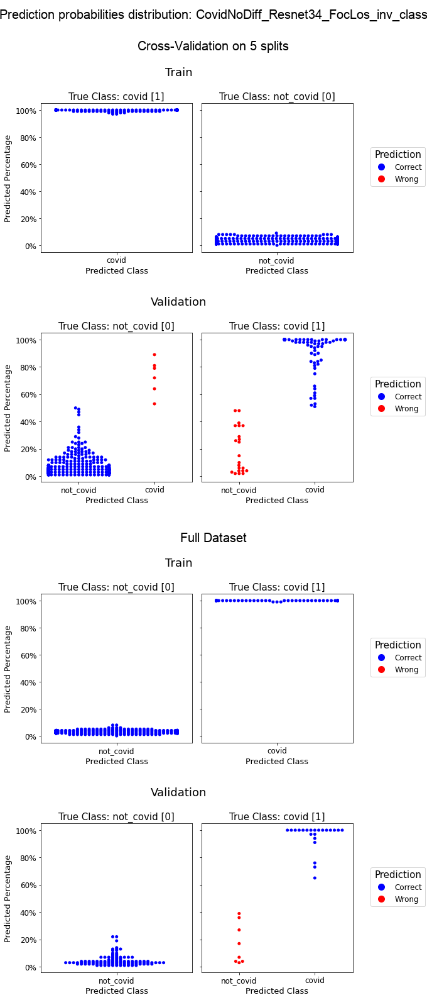




Final Log:


,session_ID,valid_loss,valid_roc,valid_acc,train_loss,train_roc,train_acc,train_covid_f1-score,valid_covid_f1-score,train_not_covid_f1-score,valid_not_covid_f1-score,train_mcc,valid_mcc,loss,inverted_class,model_ID
Cross-Validation,CovidNoDiff_Resnet34_BCE,0.198 ± 0.126,0.972 ± 0.029,0.953 ± 0.019,0.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,0.886 ± 0.047,1.0 ± 0.0,0.97 ± 0.012,1.0 ± 0.0,0.859 ± 0.057,BCE,no,Resnet34
Full,CovidNoDiff_Resnet34_BCE,0.521,0.892,0.897,0.0,1.0,1.0,0.952 ± 0.007,0.951 ± 0.029,0.987 ± 0.002,0.987 ± 0.007,0.939 ± 0.009,0.94 ± 0.035,BCE,no,Resnet34
Cross-Validation,CovidNoDiff_Resnet34_BCE_inv_class,0.211 ± 0.099,0.961 ± 0.022,0.962 ± 0.018,0.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,0.905 ± 0.046,1.0 ± 0.0,0.976 ± 0.011,1.0 ± 0.0,0.887 ± 0.055,BCE,yes,Resnet34
Full,CovidNoDiff_Resnet34_BCE_inv_class,0.305,0.945,0.941,0.0,1.0,1.0,0.973 ± 0.005,0.972 ± 0.021,0.992 ± 0.001,0.993 ± 0.006,0.966 ± 0.006,0.966 ± 0.026,BCE,yes,Resnet34
Cross-Validation,CovidNoDiff_Resnet34_FocLos,0.064 ± 0.033,0.967 ± 0.027,0.959 ± 0.018,0.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,0.898 ± 0.049,1.0 ± 0.0,0.974 ± 0.011,1.0 ± 0.0,0.878 ± 0.053,FocLos,no,Resnet34
Full,CovidNoDiff_Resnet34_FocLos,0.158,0.921,0.919,0.0,1.0,1.0,0.963 ± 0.007,0.962 ± 0.028,0.99 ± 0.002,0.99 ± 0.007,0.953 ± 0.009,0.953 ± 0.035,FocLos,no,Resnet34
Cross-Validation,CovidNoDiff_Resnet34_FocLos_inv_class,0.067 ± 0.023,0.963 ± 0.021,0.959 ± 0.007,0.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,0.901 ± 0.021,1.0 ± 0.0,0.974 ± 0.005,1.0 ± 0.0,0.879 ± 0.023,FocLos,yes,Resnet34
Full,CovidNoDiff_Resnet34_FocLos_inv_class,0.107,0.946,0.941,0.0,1.0,1.0,0.973 ± 0.006,0.972 ± 0.024,0.992 ± 0.002,0.993 ± 0.006,0.966 ± 0.007,0.966 ± 0.029,FocLos,yes,Resnet34



Total elapsed time: 1:17:00


In [14]:
# cross-validate and train model on full set - hyperparameter tuning for loss_set and invert_class_set

trainer_ID = 'CovidNoDiff'
base_classifier_ID = Resnet34(num_channels=dataset.total_frames)
dataset = dataset
batch_size = 32

cvu.tune_with_CV(trainer_ID = trainer_ID,
                 dataset = dataset,
                 base_classifier_ID = base_classifier_ID,
                 batch_size = batch_size,
                 n_splits = 5,
                 max_epochs_split = 25,
                 max_epochs_full = 25,
                 stratify_lab = dataset.labels,
                 loss_set = ['BCE', 'FocLos'],
                 invert_class_set = True,
                 measure_to_plot = ['loss', 'roc', 'acc'],
                 metrics = [Accuracy(), roc_auc_score],
                 show_info=False, show_log=2, show_perf_plot=True,
                 save_split_checkpoint=False, save_split_final=True,
                 save_full_checkpoint=False, save_full_final=True,
                 reload_split=False, reload_full=False)

# reload final performance log
final_log=pd.read_csv(os.path.join('results', trainer_ID, trainer_ID+'_final_performance.csv'), sep=';', index_col=0)

/home/alessandro/.conda/envs/defeatcovid19/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Evaluating heatmap:

 -- Gradient aggregation: mean
 -- Soft activation is applied to <class 'torch.nn.modules.activation.ReLU'> , replaced with LeakyReLU(negative_slope=0.01, inplace=True)

Processing 7/7 batch - Total elapsed time: 0:00:40
Done




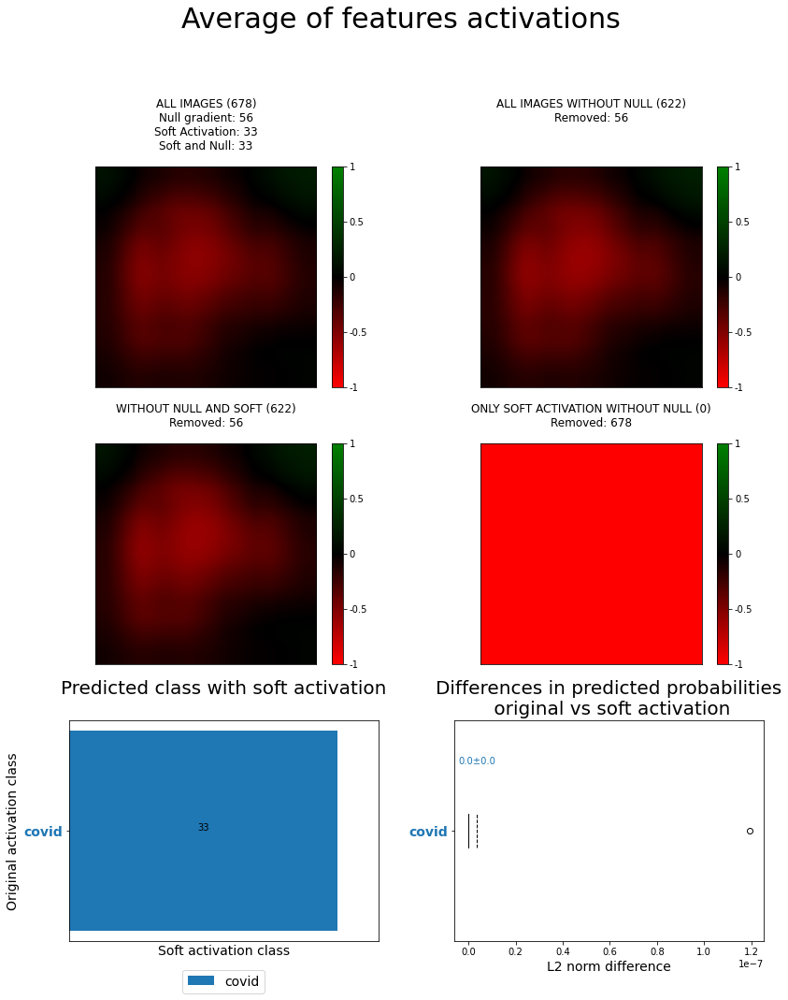

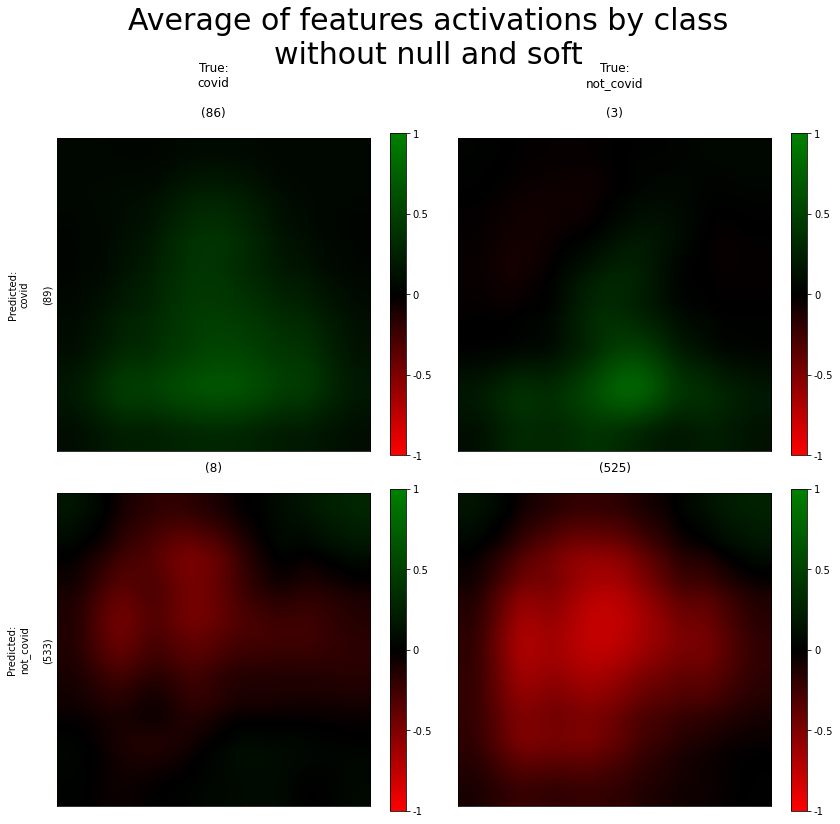

Data used for bar and box plot


,meaning,count,avg_L2_norm_diff,L2diff_list,covid,not_covid
0,covid,33,3.612403e-09,"[[0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0....",33.0,0.0


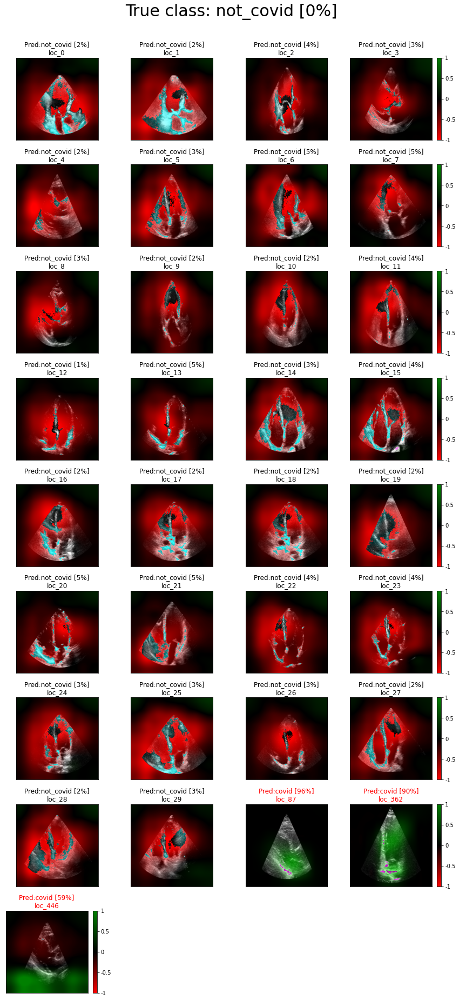

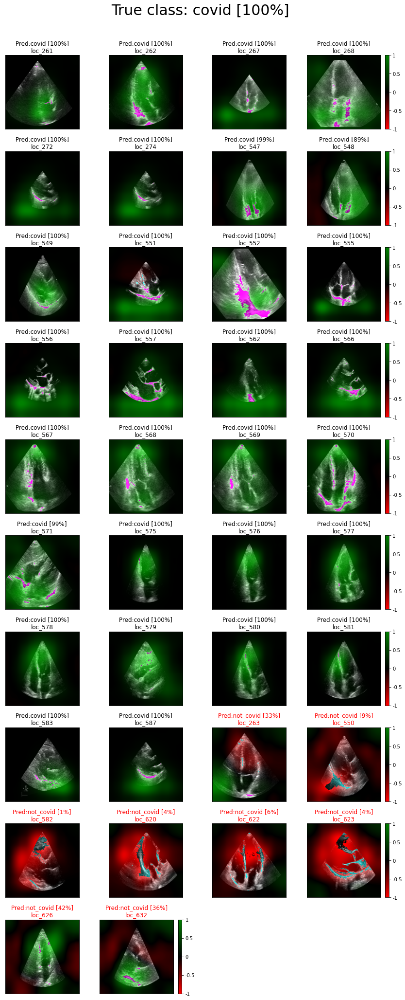

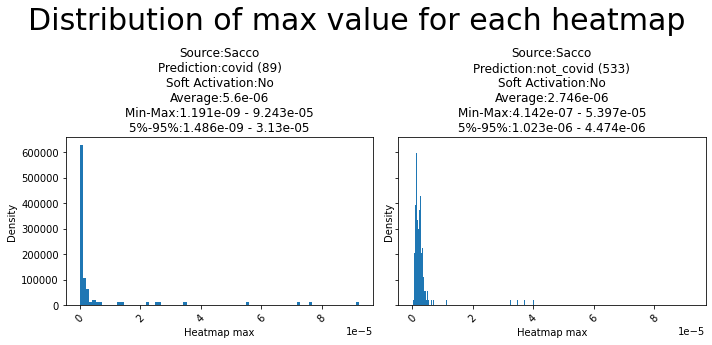

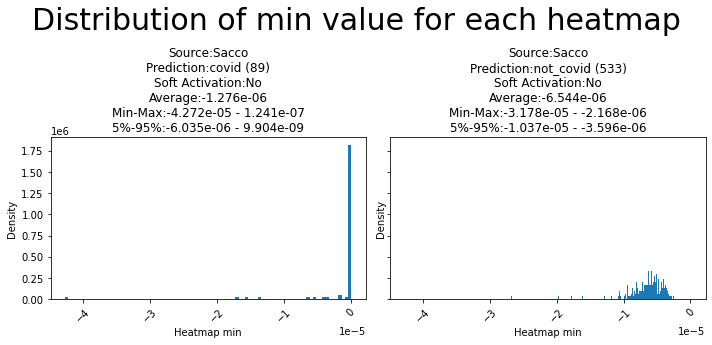

In [15]:
# evaluate features visualization

new_index = np.array(dataset.df.index)
model = Resnet34FeatVis(num_channels=dataset.total_frames)
reload_model_ID = 'CovidNoDiff_Resnet34_FocLos_full'
model_ID = 'CovidNoDiff_Resnet34_FocLos'
save_path = 'CovidNoDiff'

fvu = FeaturesVisualizationUtils(save_path=save_path,
                                 model_ID=model_ID,
                                 image_size = size)
fvu.run_features_visualization(dataset=dataset,
                               new_index=new_index,
                               model=model,
                               reload_model_ID=reload_model_ID,
                               gradient_aggregation='mean',
                               apply_soft_activation=True,
                               nn_to_replace=nn.ReLU,
                               nn_replacement=nn.LeakyReLU(inplace=True),
                               frame_to_show=0,
                               heatmap_transformation='exponential')
fvu.plot_heatmap(fig_size = 12)
fvu.plot_sample_masked(fig_size = 12, max_sample_combination = 30, sample_ncol = 4)
fvu.plot_heatmap_max_distribution()

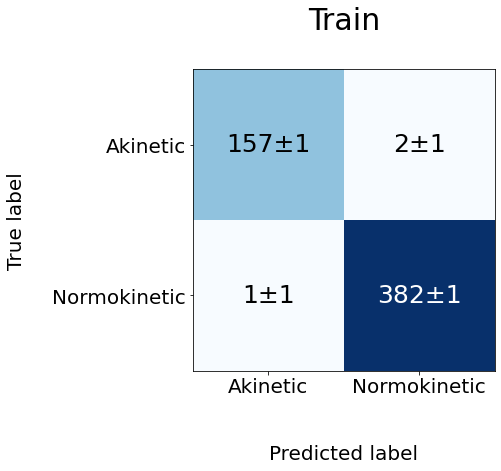

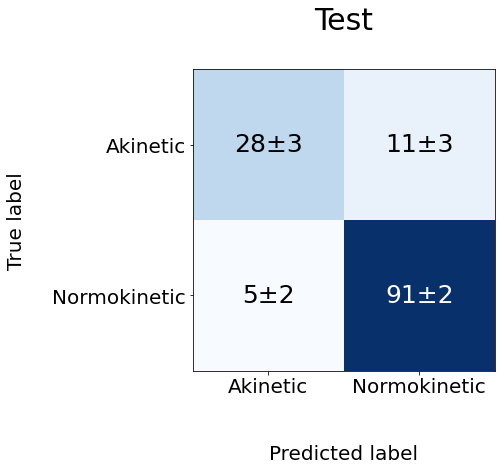

In [15]:
## confusion matrix for paper

save_path = 'conf_mat_Resnet.png'
cc = {'Train': {'conf_mat': np.array([[157,2], [1,382]]),
                'add_conf_elements': np.array([['±1','±1'], ['±1','±1']])},
      'Validation': {'conf_mat': np.array([[28,11], [5,91]]),
                'add_conf_elements': np.array([['±3','±3'], ['±2','±2']])}
     }

# save_path = 'conf_mat_GBM.png'
# cc = {'Train': {'conf_mat': np.array([[126,33], [22,362]]),
#                 'add_conf_elements': np.array([['±4','±4'], ['±5','±5']])},
#       'Validation': {'conf_mat': np.array([[32,8], [3,92]]),
#                 'add_conf_elements': np.array([['±2','±2'], ['±3','±3']])}
#      }

target_names = ['Akinetic', 'Normokinetic']
normalize=False
cmap=plt.cm.Blues

fig_path = []
for k, v in cc.items():

    conf_mat = v['conf_mat']
    add_conf_elements = v['add_conf_elements']
    title=k+'\n'

    fig, ax = plt.subplots(figsize=(7,7))
    im = ax.imshow(conf_mat, interpolation='nearest', cmap=cmap)
    #     ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(conf_mat.shape[1]),
           yticks=np.arange(conf_mat.shape[0]))
    ax.set_ylabel('True label\n', size = 20)
    ax.set_xlabel('\n\nPredicted label', size = 20)
    ax.set_xticklabels(target_names, size = 20)
    ax.set_yticklabels(target_names, size = 20)
    ax.set_title(title, size = 30)

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=0, ha="center",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = conf_mat.max() / 2.
    for i in range(conf_mat.shape[0]):
        for j in range(conf_mat.shape[1]):
            if add_conf_elements is None:
                ax.text(j, i, format(conf_mat[i, j], fmt),
                        ha="center", va="center",
                        color="white" if conf_mat[i, j] > thresh else "black", size = 25)
            else:
                ax.text(j, i, str(format(conf_mat[i, j], fmt)) + str(add_conf_elements[i, j]),
                    ha="center", va="center",
                    color="white" if conf_mat[i, j] > thresh else "black", size = 25)

    fig.tight_layout()
    fig.savefig(k+'.png')
    fig_path.append(k+'.png')
get_concat_h([Image.open(f) for f in fig_path], offset=80).save(save_path)
_=[os.remove(f) for f in fig_path]